#Hybrid Arima - LSTM code - Covid

The hybrid ARIMA-LSTM model is open to a variety of experimentation. For ideal performance, a balance must be reached between the levels of volatility that work best for the ARIMA and LSTM models. Using shorter MA periods that result in a non-mesokurtic distribution may achieve a better volatility balance between models.

## Import Libraries

In [1]:
import pandas as pd
pd.set_option('display.max_rows', 500)
import timeit


In [2]:
!pip install -q -U keras-tuner

     |████████████████████████████████| 98 kB 2.0 MB/s 


In [3]:
import keras_tuner as kt

In [4]:
!pip install pmdarima

     |████████████████████████████████| 1.4 MB 5.1 MB/s 
     |████████████████████████████████| 9.8 MB 25.3 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [5]:
import pmdarima

In [6]:
url = 'https://launchpad.net/~mario-mariomedina/+archive/ubuntu/talib/+files'
!wget $url/libta-lib0_0.4.0-oneiric1_amd64.deb -qO libta.deb
!wget $url/ta-lib0-dev_0.4.0-oneiric1_amd64.deb -qO ta.deb
!dpkg -i libta.deb ta.deb
!pip install ta-lib
import talib

Selecting previously unselected package libta-lib0.
(Reading database ... 155222 files and directories currently installed.)
Preparing to unpack libta.deb ...
Unpacking libta-lib0 (0.4.0-oneiric1) ...
Selecting previously unselected package ta-lib0-dev.
Preparing to unpack ta.deb ...
Unpacking ta-lib0-dev (0.4.0-oneiric1) ...
Setting up libta-lib0 (0.4.0-oneiric1) ...
Setting up ta-lib0-dev (0.4.0-oneiric1) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...
Processing triggers for libc-bin (2.27-3ubuntu1.3) ...
/sbin/ldconfig.real: /usr/local/lib/python3.7/dist-packages/ideep4py/lib/libmkldnn.so.0 is not a symbolic link

     |████████████████████████████████| 268 kB 5.0 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for ta-lib: filename=TA_Lib-0.4.22-cp37-cp37m-linux_x86_64.whl size=1465642 sha256=97d5d24870f78eb9e3d82aaa24198e2edf91c684ef71eff65c674508b72e9de4
  Stored in direc

In [7]:
import tensorflow
import statsmodels.tsa.api
import keras
import sklearn

In [8]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, Bidirectional,BatchNormalization, Embedding, TimeDistributed, LeakyReLU, GRU
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

In [9]:
from keras.models import Sequential, load_model
from keras.layers import Dense, LSTM, Activation, Dropout
from keras import backend as K
from keras.utils.generic_utils import get_custom_objects
from keras.callbacks import ModelCheckpoint,EarlyStopping
from keras.regularizers import l1_l2

In [10]:
import math

In [11]:
from statsmodels.tsa.api import VAR
from statsmodels.tsa.statespace.varmax import VARMAX,VARMAXResults

In [12]:
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split


In [13]:
from matplotlib import pyplot


In [14]:
import json
import datetime
import pandas as pd
import numpy as np
import os
from scipy.stats import kurtosis
import pmdarima as pm
from pmdarima import auto_arima
from talib import abstract
import json
import matplotlib.pyplot as plt
# plt.rcParams.update({'font.size': 16})
from matplotlib.pyplot import figure
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed

In [15]:
from keras.utils.generic_utils import get_custom_objects
from tensorflow.keras.utils import plot_model

In [16]:
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)

Reference 1: https://towardsdatascience.com/time-series-forecasting-predicting-stock-prices-using-an-arima-model-2e3b3080bd70

## Load Data

In [17]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [18]:
cd drive/MyDrive/Stock price prediction/Generated datasets

/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Generated datasets


In [19]:
df = pd.read_csv("FULL_Data_google_COVID_bull_bear.csv",parse_dates=[0])
df.tail(10)

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
1592,1592,1781,1781,1781,150.199997,151.429993,150.059998,150.809998,150.809998,56787900.0,150.565717,148.423811,-1.137777,2.817933,154.059677,142.787944,150.767809,5.009368,93.428749,-0.061228,100.779503,-0.039111,103.599003,-0.022436,2021-11-09,19,112313,1258,0.119141,0.111328,NaN,NaN,NaN,NaN
1593,1593,1782,1782,1782,150.020004,150.130005,147.850006,147.919998,147.919998,65187100.0,150.417145,148.729049,-1.236913,2.144358,153.017766,144.440332,148.869268,4.989888,92.922909,-0.061683,99.694365,-0.039762,101.872301,-0.022657,2021-11-10,19,80301,1470,0.154297,0.109375,NaN,NaN,NaN,NaN
1594,1594,1783,1783,1783,148.960007,149.429993,147.679993,147.869995,147.869995,41000000.0,150.110001,149.060477,-1.165047,1.767475,152.595428,145.525526,148.203086,4.989548,92.416471,-0.062129,98.604584,-0.040391,100.137594,-0.022839,2021-11-11,19,94975,1662,0.102845,0.126915,NaN,NaN,NaN,NaN
1595,1595,1784,1784,1784,148.429993,150.399994,147.479996,149.990005,149.990005,63632600.0,149.895715,149.357144,-0.869308,1.420732,152.198608,146.515681,149.394365,5.003879,91.909483,-0.062566,97.510555,-0.040998,98.396260,-0.022980,2021-11-12,19,55499,797,0.157277,0.080595,NaN,NaN,NaN,NaN
1596,1596,1785,1785,1785,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-11-13,19,146529,2505,0.139459,0.083243,NaN,NaN,NaN,NaN
1597,1597,1786,1786,1786,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-11-14,19,40964,479,0.151261,0.100840,NaN,NaN,NaN,NaN
1598,1598,1787,1787,1787,150.369995,151.880005,149.429993,150.000000,150.000000,59222800.0,149.758571,149.602859,-0.907641,1.229694,152.062246,147.143471,149.798122,5.003946,91.401994,-0.062993,96.412672,-0.041581,96.649685,-0.023077,2021-11-15,22,30290,148,0.136737,0.109389,NaN,NaN,NaN,NaN
1599,1599,1788,1788,1788,149.940002,151.490005,149.339996,151.000000,151.000000,59256200.0,149.718571,149.814763,-0.791320,1.236243,152.287250,147.342277,150.599374,5.010635,90.894052,-0.063410,95.311334,-0.042140,94.899260,-0.023130,2021-11-16,22,138962,1294,0.135531,0.115385,NaN,NaN,NaN,NaN
1600,1600,1789,1789,1789,151.000000,155.000000,150.990005,153.490005,153.490005,88807000.0,150.154286,150.040002,-0.657719,1.467121,152.974245,147.105759,152.526461,5.027099,90.385704,-0.063817,94.206941,-0.042673,93.146378,-0.023135,2021-11-17,22,87626,1290,0.100870,0.126957,NaN,NaN,NaN,NaN
1601,1601,1790,1790,1790,153.710007,158.669998,153.050003,157.869995,157.869995,137659100.0,151.162857,150.450002,-0.609656,2.267825,154.985653,145.914351,156.088817,5.055417,89.877000,-0.064214,93.099895,-0.043179,91.392433,-0.023090,2021-11-18,22,111404,1637,0.145098,0.121569,NaN,NaN,NaN,NaN


In [82]:
cd ..

/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction


In [83]:
cd Archana - LSTM Hybrid/Outputs/CovidShare

/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Archana - LSTM Hybrid/Outputs/Covid


In [26]:
pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name().head(5)

0    Saturday
1      Sunday
3     Tuesday
7    Saturday
8      Sunday
Name: Date, dtype: object

In [27]:
len(pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name())

497

In [28]:
len(df)

1602

In [29]:
len(df) - len(pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name())

1105

In [30]:
df.dropna(inplace=True)
len(df)

1080

In [31]:
pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name().head(3)

Series([], Name: Date, dtype: object)

In [32]:
df.head(5)

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
2,2,191,191,191,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,2017-07-03,15,0,0,0.666667,0.000000,0.142778,0.146810,0.100537,0.099251
4,4,193,193,193,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,2017-07-05,15,0,0,0.400000,0.000000,0.144487,0.145833,0.100630,0.096361
5,5,194,194,194,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,2017-07-06,15,0,0,0.142857,0.142857,0.145346,0.145164,0.100672,0.094761
6,6,195,195,195,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,2017-07-07,15,0,0,0.333333,0.000000,0.146208,0.144377,0.100711,0.093072
9,9,198,198,198,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,2017-07-10,14,0,0,0.000000,0.000000,0.148802,0.141354,0.100808,0.087587


In [33]:
stock_col= list(df.columns)
stock_col = stock_col[4:len(stock_col)]

In [34]:
dataset_final = df[stock_col]

In [35]:
dataset_final.head(5)

,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
2,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,2017-07-03,15,0,0,0.666667,0.000000,0.142778,0.146810,0.100537,0.099251
4,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,2017-07-05,15,0,0,0.400000,0.000000,0.144487,0.145833,0.100630,0.096361
5,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,2017-07-06,15,0,0,0.142857,0.142857,0.145346,0.145164,0.100672,0.094761
6,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,2017-07-07,15,0,0,0.333333,0.000000,0.146208,0.144377,0.100711,0.093072
9,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,2017-07-10,14,0,0,0.000000,0.000000,0.148802,0.141354,0.100808,0.087587


### Data Load for Experiments with Technical Indicators & Covid

In [36]:
stock_col= list(df.columns)
stock_col1 = stock_col[4:len(stock_col)-9]
stock_col2 = stock_col[len(stock_col)-8:len(stock_col)-6]
stock_col1.append(stock_col2[0])
stock_col1.append(stock_col2[1])
dataset_final = df[stock_col1]
dataset_final.head(5)

,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,COVID positiveIncrease,COVID deathIncrease
2,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,2017-07-03,0,0
4,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,2017-07-05,0,0
5,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,2017-07-06,0,0
6,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,2017-07-07,0,0
9,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,2017-07-10,0,0


In [37]:
# Set the date to datetime data
datetime_series = pd.to_datetime(dataset_final['Date'])
datetime_index = pd.DatetimeIndex(datetime_series.values)
dataset_final = dataset_final.set_index(datetime_index)
dataset_final = dataset_final.sort_values(by='Date')
dataset_final = dataset_final.drop(columns='Date')
dataset_final.head(5)

,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,COVID positiveIncrease,COVID deathIncrease
2017-07-03,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,0,0
2017-07-05,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,0,0
2017-07-06,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,0,0
2017-07-07,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,0,0
2017-07-10,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,0,0


### Train & test Dataset for Multistep Process

In [38]:
# Get features and target
X_value = pd.DataFrame(dataset_final.iloc[:, :])
y_value = pd.DataFrame(dataset_final.iloc[:, 3])

In [39]:
y_value.head(5)

,Close
2017-07-03,35.875000
2017-07-05,36.022499
2017-07-06,35.682499
2017-07-07,36.044998
2017-07-10,36.264999


In [40]:
# Normalized the data
X_scaler = MinMaxScaler(feature_range=(-1, 1))
y_scaler = MinMaxScaler(feature_range=(-1, 1))
X_scaler.fit(X_value)
y_scaler.fit(y_value)

MinMaxScaler(feature_range=(-1, 1))

In [41]:
X_scale_dataset = X_scaler.fit_transform(X_value)
y_scale_dataset = y_scaler.fit_transform(y_value)

In [42]:
X_scale_dataset.shape, y_scale_dataset.shape, 

((1080, 22), (1080, 1))

In [43]:
 X_value.shape[1]

22

### N Steps Definition

In [44]:
n_steps_in = 3
n_features = X_value.shape[1] #19 features
n_steps_out = 1


In [45]:
# Reshape the data
'''Set the data input steps and output steps, 
    we use 30 days data to predict 1 day price here, 
    reshape it to (None, input_step, number of features) used for LSTM input'''
# Get X/y dataset
def get_X_y(X_data, y_data):
    X = list()
    y = list()
    yc = list()

    length = len(X_data)
    for i in range(0, length, 1):
        # pdb.set_trace()
        X_value = X_data[i: i + n_steps_in][:, :]
        # print('[',i,': ',i,' + ',n_steps_in,'][:, :]')
        y_value = y_data[i + n_steps_in: i + (n_steps_in + n_steps_out)][:, 0]
        # print('[',i,' + ',n_steps_in,': ',i,' + (',n_steps_in,' + ',n_steps_out,')][:, 0]')
        yc_value = y_data[i: i + n_steps_in][:, :]
        if len(X_value) == 3 and len(y_value) == 1:
            X.append(X_value)
            y.append(y_value)
            yc.append(yc_value)

    return np.array(X), np.array(y), np.array(yc)

In [46]:
# get the train test predict index
def predict_index(dataset, X_train, n_steps_in, n_steps_out):

    # get the predict data (remove the in_steps days)
    train_predict_index = dataset.iloc[n_steps_in : X_train.shape[0] + n_steps_in + n_steps_out - 1, :].index
    test_predict_index = dataset.iloc[X_train.shape[0] + n_steps_in:, :].index

    return train_predict_index, test_predict_index


In [47]:
def mean_absolute_percentage_error(actual, prediction):
    actual = pd.Series(actual)
    prediction = pd.Series(prediction)
    return 100 * np.mean(np.abs((actual - prediction))/actual)

In [48]:
# Split train/test dataset
def split_train_test(data):
    train_size = round(len(X) * 0.75)
    data_train = data[0:train_size]
    data_test = data[train_size:]
    return data_train, data_test

In [49]:
# Get data and check shape
X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
# pdb.set_trace()
X_train, X_test, = split_train_test(X)
y_train, y_test, = split_train_test(y)
yc_train, yc_test, = split_train_test(yc)
index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

In [50]:
# %% --------------------------------------- Save dataset -----------------------------------------------------------------
print('X shape: ', X.shape)
print('y shape: ', y.shape)
print('X_train shape: ', X_train.shape)
print('y_train shape: ', y_train.shape)
print('y_c_train shape: ', yc_train.shape)
print('X_test shape: ', X_test.shape)
print('y_test shape: ', y_test.shape)
print('y_c_test shape: ', yc_test.shape)
print('index_train shape:', index_train.shape)
print('index_test shape:', index_test.shape)


X shape:  (1077, 3, 22)
y shape:  (1077, 1)
X_train shape:  (808, 3, 22)
y_train shape:  (808, 1)
y_c_train shape:  (808, 3, 1)
X_test shape:  (269, 3, 22)
y_test shape:  (269, 1)
y_c_test shape:  (269, 3, 1)
index_train shape: (808,)
index_test shape: (269,)


In [51]:
output_dim = y_train.shape[1]
output_dim

1

In [52]:
df = dataset_final.copy()

In [53]:
df.rename(columns={'Date':'date','Open':'open','Low':'low','Close':'close','Volume':'volume','High':'high'}, inplace = True)
df.reset_index(drop=True,inplace=True)

In [54]:
df.head(1)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,COVID positiveIncrease,COVID deathIncrease
0,36.220001,36.325001,35.775002,35.875,34.054882,57111200.0,36.173571,36.751904,0.303356,0.96052,38.672945,34.830864,35.924548,3.55177,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,0,0


In [55]:
# df.drop(['volume', 'MACD','20SD','logmomentum','absolute of 3 comp','angle of 3 comp','absolute of 6 comp','angle of 6 comp','absolute of 9 comp','angle of 9 comp'], axis='columns', inplace=True) # only keep columns that can help as residuals in Arima Hybrid

In [56]:
df.head(1)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,COVID positiveIncrease,COVID deathIncrease
0,36.220001,36.325001,35.775002,35.875,34.054882,57111200.0,36.173571,36.751904,0.303356,0.96052,38.672945,34.830864,35.924548,3.55177,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,0,0


### Train & Test Length

In [57]:
test_len = len(X_test)

In [58]:
train_len = len(X_train )

In [59]:
test_len, train_len

(269, 808)

## Kurtosis Review

In [60]:
   # Initialize moving averages from Ta-Lib, store functions in dictionary
# talib_moving_averages = ['SMA', 'EMA', 'WMA', 'DEMA', 'KAMA', 'MIDPOINT', 'MIDPRICE', 'T3', 'TEMA', 'TRIMA'] remove midprice due to outputbeing univariate
talib_moving_averages = ['SMA', 'EMA', 'WMA', 'DEMA', 'KAMA', 'MIDPOINT',  'T3', 'TEMA', 'TRIMA'] 
functions = {}
for ma in talib_moving_averages:
      functions[ma] = abstract.Function(ma)

    # Determine kurtosis "K" values for MA period 4-30
kurtosis_results = {'period': []}
for i in range(4, 100): # 100
  kurtosis_results['period'].append(i)
  for ma in talib_moving_averages:
              # Run moving average, remove last N days (used later for test data set), trim MA result to last 30 days
              ma_output = functions[ma](df[:-test_len], i).tail(14)
              # Determine kurtosis "K" value
              k = kurtosis(ma_output, fisher=False)
              # add to dictionary
              if ma not in kurtosis_results.keys():
                  kurtosis_results[ma] = []
              kurtosis_results[ma].append(k)

kurtosis_results = pd.DataFrame(kurtosis_results)
kurtosis_results.to_csv('kurtosis_results.csv')

In [61]:
kurtosis_results.head(5)

,period,SMA,EMA,WMA,DEMA,KAMA,MIDPOINT,T3,TEMA,TRIMA
0,4,2.272452,2.652772,2.896972,3.800351,2.299585,2.171369,1.978458,4.609342,2.411225
1,5,1.839451,2.355815,2.481058,3.327525,1.841282,1.826597,1.640277,4.262302,1.994382
2,6,1.583886,2.159532,2.194320,2.945924,1.536136,1.605787,1.510972,3.878845,1.679710
3,7,1.461290,2.026758,1.990629,2.651927,1.506197,1.558096,1.514015,3.510432,1.486348
4,8,1.447516,1.935302,1.853935,2.429648,1.509566,1.621595,1.601580,3.184123,1.373337


## Optimized periods

In [62]:
# Determine period with K closest to 3 +/-5%
optimized_period = {}
# https://pypi.org/project/TA-Lib/ determines the type of moving average to use
# https://pandas.pydata.org/pandas-docs/version/0.17.0/generated/pandas.DataFrame.at.html#pandas.DataFrame.at
for ma in talib_moving_averages:
        difference = np.abs(kurtosis_results[ma] - 3)
        df_arimahyb = pd.DataFrame({'difference': difference, 'period': kurtosis_results['period']})
        df_arimahyb = df_arimahyb.sort_values(by=['difference'], ascending=True).reset_index(drop=True)
        if df_arimahyb.at[0, 'difference'] < 3 * 0.05:
            optimized_period[ma] = df_arimahyb.at[0, 'period']
        else:
            print(ma + ' is not viable, best K greater or less than 3 +/-5%')

print('\nOptimized periods:', optimized_period)

TRIMA is not viable, best K greater or less than 3 +/-5%

Optimized periods: {'SMA': 17, 'EMA': 51, 'WMA': 49, 'DEMA': 89, 'KAMA': 18, 'MIDPOINT': 14, 'T3': 19, 'TEMA': 9}


In [63]:
optimized_period

{'DEMA': 89,
 'EMA': 51,
 'KAMA': 18,
 'MIDPOINT': 14,
 'SMA': 17,
 'T3': 19,
 'TEMA': 9,
 'WMA': 49}

## Simulation Keys

In [64]:
simulation = {}
for ma in optimized_period:
        print(ma)
        print(functions[ma])
        print ( int( optimized_period[ma]))
        # if ma in ['EMA','WMA','DEMA','KAMA','MIDPOINT']:
        #   print(ma)
        low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
        low_vol = low_vol.fillna(0)
        high_vol = pd.DataFrame()
        df2 = df.copy()
        for i in df2.columns:
          if i in low_vol.columns:
            high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Pa

In [65]:
low_vol.tail(20)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,COVID positiveIncrease,COVID deathIncrease
1060,140.200839,141.942909,138.524500,140.171495,139.966842,8.852448e+07,142.165478,146.699207,1.815578,4.572948,155.845103,137.553312,140.365562,4.935800,105.739092,-0.047411,125.318767,-0.018291,140.471430,-0.008749,109077.158389,1731.777447
1061,139.425914,141.705469,138.035200,140.698014,140.492650,8.620711e+07,141.528981,145.978836,2.115887,4.189393,154.357621,137.600050,140.587196,4.939545,105.263514,-0.048037,124.464999,-0.019222,139.335869,-0.009472,102841.290470,1754.266015
1062,140.773058,142.636405,139.932338,141.733666,141.526843,7.421445e+07,141.294887,145.298477,2.211018,3.647690,152.593858,138.003097,141.351509,4.946870,104.786174,-0.048658,123.598217,-0.020150,138.164839,-0.010188,105557.460315,2130.717759
1063,142.179695,143.266994,141.127848,142.249061,142.041527,6.519616e+07,141.224295,144.665584,2.093072,3.241276,151.148137,138.183031,141.949877,4.950518,104.307114,-0.049275,122.718682,-0.021074,136.959041,-0.010898,102639.580150,2301.041924
1064,142.253947,144.008334,141.546689,142.555532,142.347589,6.254214e+07,141.336839,144.184381,1.988881,2.884864,149.954110,138.414652,142.353647,4.952685,103.826381,-0.049886,121.826667,-0.021994,135.719217,-0.011600,69581.281276,1416.274721
1065,142.782738,143.732491,141.438660,142.125353,141.918068,6.542511e+07,141.385297,143.758659,1.774804,2.626682,149.012024,138.505294,142.201451,4.949632,103.344020,-0.050491,120.922446,-0.022909,134.446150,-0.012293,82284.124854,1213.050329
1066,142.153085,142.656915,140.466684,141.564232,141.357788,7.040262e+07,141.585336,143.387397,1.634667,2.376817,148.141030,138.633764,141.776638,4.945637,102.860075,-0.051092,120.006305,-0.023818,133.140665,-0.012977,91985.728638,1671.446790
1067,142.177201,143.194327,140.977156,142.610382,142.402435,6.948112e+07,141.933749,143.094536,1.573317,2.074153,147.242842,138.946230,142.332468,4.953023,102.374593,-0.051687,119.078535,-0.024722,131.803627,-0.013650,105946.749025,2401.564322
1068,143.009006,144.052615,142.286776,143.812497,143.602819,6.805244e+07,142.378675,142.879716,1.473333,1.874158,146.628032,139.131400,143.319154,4.961467,101.887619,-0.052275,118.139433,-0.025618,130.435938,-0.014311,97749.622599,2337.714304
1069,143.380322,145.547752,142.940349,145.397429,145.185452,7.592729e+07,142.902069,142.813890,1.447641,1.844159,146.502207,139.125573,144.704671,4.972505,101.399198,-0.052858,117.189304,-0.026508,129.038540,-0.014959,65512.021173,1450.883588


In [66]:
high_vol.head(10)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,COVID positiveIncrease,COVID deathIncrease
0,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,0.0,0.0
1,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,0.0,0.0
2,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,0.0,0.0
3,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,0.0,0.0
4,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,0.0,0.0
5,36.182499,36.462502,36.095001,36.382500,34.536625,79127200.0,36.039642,36.202738,0.372153,0.308860,36.820458,35.585018,36.309257,3.566217,37.412947,0.059392,31.005161,0.084416,43.829622,-0.052901,0.0,0.0
6,36.467499,36.544998,36.205002,36.435001,34.586472,99538000.0,36.101071,36.206547,0.317572,0.295861,36.798268,35.614826,36.393086,3.567700,37.215939,0.061899,31.279154,0.080632,43.892360,-0.052406,0.0,0.0
7,36.375000,37.122501,36.360001,36.942501,35.068211,100797600.0,36.253571,36.220595,0.322643,0.340687,36.901969,35.539221,36.759363,3.581920,37.022928,0.064410,31.557136,0.076830,43.941338,-0.051818,0.0,0.0
8,36.992500,37.332500,36.832500,37.259998,35.369610,80528400.0,36.430357,36.266785,0.257925,0.410484,37.087753,35.445818,37.093120,3.590715,36.833908,0.066926,31.838833,0.073014,43.976744,-0.051137,0.0,0.0
9,37.205002,37.724998,37.142502,37.389999,35.493000,95174000.0,36.674285,36.329523,0.184267,0.445597,37.220717,35.438330,37.291039,3.594294,36.648875,0.069445,32.123972,0.069192,43.998789,-0.050365,0.0,0.0


## Common Functions

In [73]:
def get_arima(dataframe,original_data, train_len, test_len):
    # prepare train and test data
    X_value = pd.DataFrame(dataframe.iloc[:, :])
    y_value = pd.DataFrame(dataframe.iloc[:, 3])
    X_train, X_test = split_train_test(X_value)
    y_train, y_test = split_train_test(y_value)
    yc_train,yc_test = split_train_test(original_data)
    # y_train_ = y_train['close'].to_list()
    # y_test_ = y_test['close'].to_list()
    yc = yc_test.values.tolist()
    y_train_list = y_train['close'].values.tolist() 
    y_test_list = y_test['close'].values.tolist()                                           
      
    # Initialize model
    model = auto_arima(y_train_list,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
                  suppress_warnings=True,stepwise=True,seasonal=True)
    print(model.summary())
        # Determine model parameters
    model.fit(y_train_list,disp= 0)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

        # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
            model = pmdarima.ARIMA(order=order)
            model.fit(y_train_list,disp= 0)
            # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')
            prediction.append(model.predict()[0])
            y_train_list.append(y_test_list[i])

    # Generate error data
    mse = mean_squared_error(yc_test, prediction)
    rmse = mse ** 0.5
    # mape = mean_absolute_percentage_error(pd.Series(yc_test).values.tolist(), pd.Series(predictionte).values.tolist() )
    mae = mean_absolute_error(pd.Series(yc_test).values.tolist() , pd.Series(prediction).values.tolist() )
    return yc, prediction, mse, rmse, mae

In [74]:
def plot_train(simulation,SIM):
  train_predict_index = np.load("index_train_appl.npy", allow_pickle=True)#Dates for train data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['final_tr']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['final_tr']['prediction'][i], columns=["predicted_price"],
                                  index=train_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)
          
          #This is a dataframe with each column containing the predicted daily closing price
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['final_tr']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['final_tr']['original'][i], columns=["real_price"],
                                index=train_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)  #This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Training for Hybrid Arima LSTM with MA - {SIM} : {fileimg}",fontsize=20)
  sf = fileimg+'_'+SIM+'Train Hybrid Arima LSTM Pred Out.png'
  plt.savefig(sf,dpi='figure')
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"----- Train RMSE for {SIM} -----", RMSE)
  print(f"----- Train_MSE_LSTM for {SIM} -----", MSE)
  print(f"----- Train MAE LSTM for {SIM} -----", MAE)

In [75]:
def plot_test(simulation, SIM):
  test_predict_index = np.load("index_test_appl.npy", allow_pickle=True)#Dates for train data

      # rescaled_real_y = y_scaler.inverse_transform(y_train)#Real closing price data
      # rescaled_predicted_y = y_scaler.inverse_transform(train_yhat)#Predicted closing price data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['final']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['final']['prediction'][i], columns=["predicted_price"],
                                  index=test_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)#This is a dataframe with each column containing the predicted daily closing price
      #
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['final']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['final']['original'][i], columns=["real_price"],
                                index=test_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)#This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Testing for Hybrid Arima LSTM with MA - {SIM} : {fileimg}",fontsize=20)
  sf = fileimg+'_'+SIM+'Test Hybrid Arima LSTM Pred Out.png'
  plt.savefig(sf,dpi='figure')
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"----- Test RMSE for {SIM}-----", RMSE)
  print(f"----- Test_MSE_LSTM for {SIM}-----", MSE)
  print(f"----- Test_MAE_LSTM for {SIM}-----", MAE)

In [76]:
def plot_train_high(simulation, SIM):
  train_predict_index = np.load("index_test_appl.npy", allow_pickle=True)#Dates for train data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['high_vol']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['high_vol']['prediction'][i], columns=["predicted_price"],
                                  index=train_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)
          
          #This is a dataframe with each column containing the predicted daily closing price
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['high_vol']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['high_vol']['original'][i], columns=["real_price"],
                                index=train_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)  #This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Training for {SIM}", fontsize=20)
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"----- Individual LSTM RMSE for {SIM} -----", RMSE)
  print(f"----- Individual LSTM_MSE_LSTM for {SIM} -----", MSE)
  print(f"----- Individual LSTM MAE LSTM for {SIM} -----", MAE)

In [77]:
def plot_train_low(simulation , SIM):
  train_predict_index = np.load("index_test_appl.npy", allow_pickle=True)#Dates for train data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['low_vol']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['low_vol']['prediction'][i], columns=["predicted_price"],
                                  index=train_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)
          
          #This is a dataframe with each column containing the predicted daily closing price
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['low_vol']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['low_vol']['original'][i], columns=["real_price"],
                                index=train_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)  #This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Training for {SIM}", fontsize=20)
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"-----Arima RMSE for {SIM} -----", RMSE)
  print(f"----- Arima MSE for {SIM} -----", MSE)
  print(f"----- Arima MAE for {SIM} -----", MAE)

In [78]:
import os
os.getcwd()

'/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Archana - LSTM Hybrid/Outputs/Covid'

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 1

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    model.add(Dense(units=64,activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    ## Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # cts().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.48 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.15 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.06 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.08 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.53 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.58 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.15 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 2.098 seconds
                               SARIMAX Results                                
Dep.

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.00968, saving model to LSTM1.h5
48/48 - 4s - loss: 0.2459 - val_loss: 0.0097 - lr: 0.0010 - 4s/epoch - 76ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.00968
48/48 - 1s - loss: 0.1711 - val_loss: 0.0231 - lr: 0.0010 - 512ms/epoch - 11ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.00968
48/48 - 1s - loss: 0.0984 - val_loss: 0.8944 - lr: 0.0010 - 524ms/epoch - 11ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.00968
48/48 - 1s - loss: 0.0525 - val_loss: 0.2835 - lr: 0.0010 - 522ms/epoch - 11ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00968
48/48 - 1s - loss: 0.0453 - val_loss: 0.1463 - lr: 0.0010 - 537ms/epoch - 11ms/step
Epoch 6/500

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 00006: val_loss did not improve from 0.00968
48/48 - 1s - loss: 0.0397 - val_loss: 0.2374 - lr: 0.0010 - 540ms/epoch - 11ms/step
Epoch 7

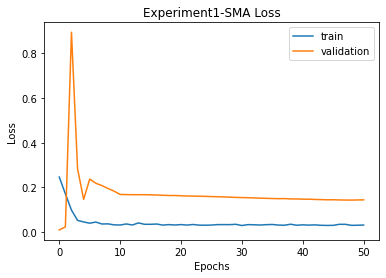


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 29.531169515594907 
RMSE:	 5.434258874547192 
MAPE:	 4.511922179897357
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.02 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.03 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.20 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.06 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.07 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.92 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.51 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0.

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.14983, saving model to LSTM1.h5
16/16 - 2s - loss: 0.2317 - val_loss: 0.1498 - lr: 0.0010 - 2s/epoch - 128ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.14983 to 0.11662, saving model to LSTM1.h5
16/16 - 0s - loss: 0.0996 - val_loss: 0.1166 - lr: 0.0010 - 226ms/epoch - 14ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.11662
16/16 - 0s - loss: 0.0823 - val_loss: 0.3269 - lr: 0.0010 - 194ms/epoch - 12ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.11662
16/16 - 0s - loss: 0.0624 - val_loss: 0.1525 - lr: 0.0010 - 190ms/epoch - 12ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.11662 to 0.07705, saving model to LSTM1.h5
16/16 - 0s - loss: 0.0569 - val_loss: 0.0770 - lr: 0.0010 - 194ms/epoch - 12ms/step
Epoch 6/500

Epoch 00006: val_loss improved from 0.07705 to 0.07685, saving model to LSTM1.h5
16/16 - 0s - loss: 0.0481 - val_loss: 0.0768 - lr: 0.0010 - 213ms/epoch - 13ms/ste

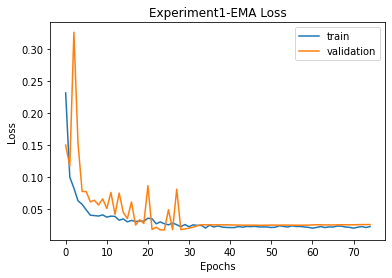


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 29.531169515594907 
RMSE:	 5.434258874547192 
MAPE:	 4.511922179897357

EMA
Prediction vs Close:		57.09% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 44.2948843329178 
RMSE:	 6.655440205795392 
MAPE:	 5.1903345685841265
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.03 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.06 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.07 sec
 ARIMA(3,3,1)(0,0,0)[0]

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.24073, saving model to LSTM1.h5
17/17 - 2s - loss: 0.3924 - val_loss: 0.2407 - lr: 0.0010 - 2s/epoch - 122ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.24073 to 0.21989, saving model to LSTM1.h5
17/17 - 0s - loss: 0.1053 - val_loss: 0.2199 - lr: 0.0010 - 229ms/epoch - 13ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.21989
17/17 - 0s - loss: 0.0880 - val_loss: 0.2684 - lr: 0.0010 - 207ms/epoch - 12ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.21989 to 0.10733, saving model to LSTM1.h5
17/17 - 0s - loss: 0.0788 - val_loss: 0.1073 - lr: 0.0010 - 228ms/epoch - 13ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.10733 to 0.09092, saving model to LSTM1.h5
17/17 - 0s - loss: 0.0505 - val_loss: 0.0909 - lr: 0.0010 - 224ms/epoch - 13ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.09092
17/17 - 0s - loss: 0.0526 - val_loss: 0.1424 - lr: 0.0010 - 213ms/epoch - 13ms/ste

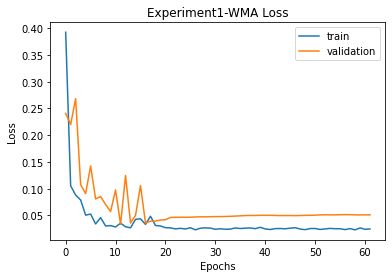


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 29.531169515594907 
RMSE:	 5.434258874547192 
MAPE:	 4.511922179897357

EMA
Prediction vs Close:		57.09% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 44.2948843329178 
RMSE:	 6.655440205795392 
MAPE:	 5.1903345685841265

WMA
Prediction vs Close:		56.72% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 34.81241095672678 
RMSE:	 5.900204314829002 
MAPE:	 4.770935413189914
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.38 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.02 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.03 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.05104, saving model to LSTM1.h5
10/10 - 2s - loss: 0.8102 - val_loss: 0.0510 - lr: 0.0010 - 2s/epoch - 211ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.05104 to 0.04974, saving model to LSTM1.h5
10/10 - 0s - loss: 0.1873 - val_loss: 0.0497 - lr: 0.0010 - 152ms/epoch - 15ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.04974
10/10 - 0s - loss: 0.0745 - val_loss: 0.2709 - lr: 0.0010 - 127ms/epoch - 13ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.04974
10/10 - 0s - loss: 0.0673 - val_loss: 0.2236 - lr: 0.0010 - 135ms/epoch - 13ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.04974
10/10 - 0s - loss: 0.0665 - val_loss: 0.1066 - lr: 0.0010 - 130ms/epoch - 13ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.04974
10/10 - 0s - loss: 0.0543 - val_loss: 0.0958 - lr: 0.0010 - 124ms/epoch - 12ms/step
Epoch 7/500

Epoch 00007: ReduceLROnPlateau reducing learn

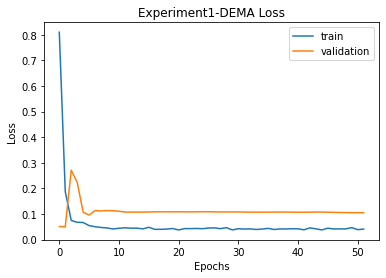


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 29.531169515594907 
RMSE:	 5.434258874547192 
MAPE:	 4.511922179897357

EMA
Prediction vs Close:		57.09% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 44.2948843329178 
RMSE:	 6.655440205795392 
MAPE:	 5.1903345685841265

WMA
Prediction vs Close:		56.72% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 34.81241095672678 
RMSE:	 5.900204314829002 
MAPE:	 4.770935413189914

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 52.107642174945944 
RMSE:	 7.2185623343534235 
MAPE:	 5.72607728989529
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(0,3,0)

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.23368, saving model to LSTM1.h5
45/45 - 2s - loss: 0.2105 - val_loss: 0.2337 - lr: 0.0010 - 2s/epoch - 52ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.23368
45/45 - 0s - loss: 0.1425 - val_loss: 0.7288 - lr: 0.0010 - 495ms/epoch - 11ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.23368
45/45 - 1s - loss: 0.1108 - val_loss: 0.9172 - lr: 0.0010 - 532ms/epoch - 12ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.23368 to 0.01871, saving model to LSTM1.h5
45/45 - 1s - loss: 0.0518 - val_loss: 0.0187 - lr: 0.0010 - 537ms/epoch - 12ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.01871
45/45 - 0s - loss: 0.0458 - val_loss: 0.0336 - lr: 0.0010 - 482ms/epoch - 11ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.01871
45/45 - 1s - loss: 0.0412 - val_loss: 0.0357 - lr: 0.0010 - 540ms/epoch - 12ms/step
Epoch 7/500

Epoch 00007: val_loss improved from 0.01871 to

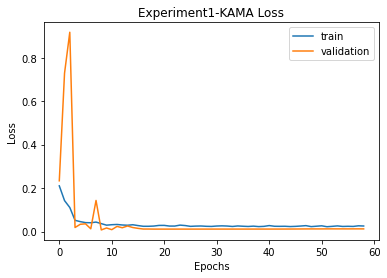


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 29.531169515594907 
RMSE:	 5.434258874547192 
MAPE:	 4.511922179897357

EMA
Prediction vs Close:		57.09% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 44.2948843329178 
RMSE:	 6.655440205795392 
MAPE:	 5.1903345685841265

WMA
Prediction vs Close:		56.72% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 34.81241095672678 
RMSE:	 5.900204314829002 
MAPE:	 4.770935413189914

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 52.107642174945944 
RMSE:	 7.2185623343534235 
MAPE:	 5.72607728989529

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 101.2314633840329 
RMSE:	 10.06138476473457 
MAPE:	 7.671150891933135
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MI

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.04090, saving model to LSTM1.h5
58/58 - 2s - loss: 0.1551 - val_loss: 0.0409 - lr: 0.0010 - 2s/epoch - 42ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.04090 to 0.03024, saving model to LSTM1.h5
58/58 - 1s - loss: 0.0955 - val_loss: 0.0302 - lr: 0.0010 - 665ms/epoch - 11ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.03024
58/58 - 1s - loss: 0.0563 - val_loss: 0.0304 - lr: 0.0010 - 619ms/epoch - 11ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.03024
58/58 - 1s - loss: 0.0576 - val_loss: 0.1880 - lr: 0.0010 - 631ms/epoch - 11ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.03024 to 0.02879, saving model to LSTM1.h5
58/58 - 1s - loss: 0.0549 - val_loss: 0.0288 - lr: 0.0010 - 643ms/epoch - 11ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.02879
58/58 - 1s - loss: 0.0463 - val_loss: 0.2561 - lr: 0.0010 - 606ms/epoch - 10ms/step
Epoch 7/500

Epoch 00007: val

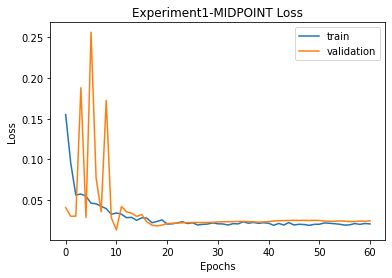


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 29.531169515594907 
RMSE:	 5.434258874547192 
MAPE:	 4.511922179897357

EMA
Prediction vs Close:		57.09% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 44.2948843329178 
RMSE:	 6.655440205795392 
MAPE:	 5.1903345685841265

WMA
Prediction vs Close:		56.72% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 34.81241095672678 
RMSE:	 5.900204314829002 
MAPE:	 4.770935413189914

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 52.107642174945944 
RMSE:	 7.2185623343534235 
MAPE:	 5.72607728989529

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 101.2314633840329 
RMSE:	 10.06138476473457 
MAPE:	 7.671150891933135

MIDPOINT
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 120.91184599154492 
RMSE:	 10.995992269529154 
MAPE:	 9.137686493675425
T3
T3([input_arrays], [

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.01665, saving model to LSTM1.h5
43/43 - 3s - loss: 0.3626 - val_loss: 0.0167 - lr: 0.0010 - 3s/epoch - 61ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.01665
43/43 - 0s - loss: 0.1414 - val_loss: 0.7987 - lr: 0.0010 - 452ms/epoch - 11ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.01665
43/43 - 0s - loss: 0.0695 - val_loss: 0.4506 - lr: 0.0010 - 461ms/epoch - 11ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.01665
43/43 - 1s - loss: 0.0630 - val_loss: 0.3210 - lr: 0.0010 - 503ms/epoch - 12ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.01665
43/43 - 0s - loss: 0.0495 - val_loss: 0.1193 - lr: 0.0010 - 491ms/epoch - 11ms/step
Epoch 6/500

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 00006: val_loss did not improve from 0.01665
43/43 - 0s - loss: 0.0459 - val_loss: 0.1564 - lr: 0.0010 - 497ms/epoch - 12ms/step
Epoch 7

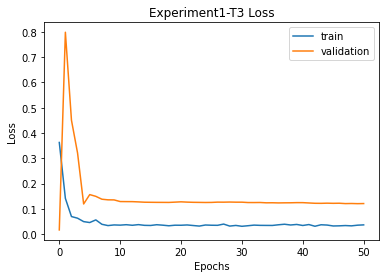


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 29.531169515594907 
RMSE:	 5.434258874547192 
MAPE:	 4.511922179897357

EMA
Prediction vs Close:		57.09% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 44.2948843329178 
RMSE:	 6.655440205795392 
MAPE:	 5.1903345685841265

WMA
Prediction vs Close:		56.72% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 34.81241095672678 
RMSE:	 5.900204314829002 
MAPE:	 4.770935413189914

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 52.107642174945944 
RMSE:	 7.2185623343534235 
MAPE:	 5.72607728989529

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 101.2314633840329 
RMSE:	 10.06138476473457 
MAPE:	 7.671150891933135

MIDPOINT
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 120.91184599154492 
RMSE:	 10.995992269529154 
MAPE:	 9.137686493675425

T3
Prediction vs Close

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.25314, saving model to LSTM1.h5
90/90 - 3s - loss: 0.1518 - val_loss: 0.2531 - lr: 0.0010 - 3s/epoch - 31ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.25314
90/90 - 1s - loss: 0.1497 - val_loss: 0.3602 - lr: 0.0010 - 967ms/epoch - 11ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.25314
90/90 - 1s - loss: 0.0931 - val_loss: 0.6540 - lr: 0.0010 - 1s/epoch - 11ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.25314 to 0.05296, saving model to LSTM1.h5
90/90 - 1s - loss: 0.0483 - val_loss: 0.0530 - lr: 0.0010 - 1s/epoch - 11ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.05296 to 0.01559, saving model to LSTM1.h5
90/90 - 1s - loss: 0.0433 - val_loss: 0.0156 - lr: 0.0010 - 1s/epoch - 11ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.01559
90/90 - 1s - loss: 0.0839 - val_loss: 0.2820 - lr: 0.0010 - 1s/epoch - 11ms/step
Epoch 7/500

Epoch 00007: val_loss did no

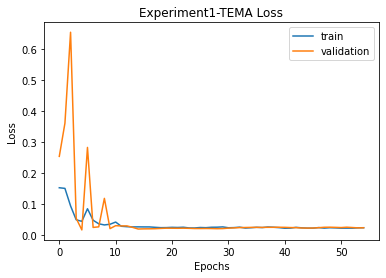


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 29.531169515594907 
RMSE:	 5.434258874547192 
MAPE:	 4.511922179897357

EMA
Prediction vs Close:		57.09% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 44.2948843329178 
RMSE:	 6.655440205795392 
MAPE:	 5.1903345685841265

WMA
Prediction vs Close:		56.72% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 34.81241095672678 
RMSE:	 5.900204314829002 
MAPE:	 4.770935413189914

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 52.107642174945944 
RMSE:	 7.2185623343534235 
MAPE:	 5.72607728989529

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 101.2314633840329 
RMSE:	 10.06138476473457 
MAPE:	 7.671150891933135

MIDPOINT
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 120.91184599154492 
RMSE:	 10.995992269529154 
MAPE:	 9.137686493675425

T3
Prediction vs Close

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation1 = {}
    imgfile = 'Experiment1'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation1[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation1_data.json', 'w') as fp:
                  json.dump(simulation1, fp)

              for ma in simulation1.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation1[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation1[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation1[ma]['final']['mse'],
                        '\nRMSE:\t', simulation1[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation1[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
            # code you want to evaluate
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment1.png to Experiment1 (2).png


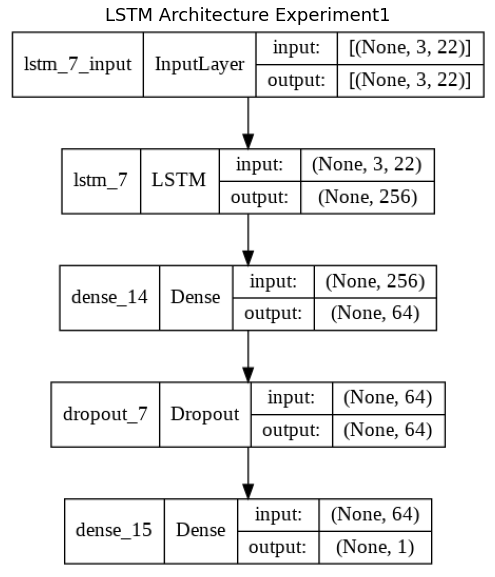

In [ ]:
img = cv2.imread('Experiment1.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

Excess kurtosis is a metric that compares the kurtosis of a distribution against the kurtosis of a normal distribution. The kurtosis of a normal distribution equals 3. Therefore, the excess kurtosis is found using the formula below:

Excess Kurtosis = Kurtosis – 3

### Model Plots

In [ ]:
np.save("X_train_appl.npy", X_train)
np.save("y_train_appl.npy", y_train)
np.save("X_test_appl.npy", X_test)
np.save("y_test_appl.npy", y_test)
np.save("yc_train_appl.npy", yc_train)
np.save("yc_test_appl.npy", yc_test)
np.save('index_train_appl.npy', index_train)
np.save('index_test_appl.npy', index_test)

In [ ]:
list(simulation1.keys())

['SMA', 'EMA', 'WMA', 'DEMA', 'KAMA', 'MIDPOINT', 'T3', 'TEMA']

In [97]:
with open('simulation1_data.json') as json_file:
    simulation1 = json.load(json_file)
fileimg = 'Experiment1'

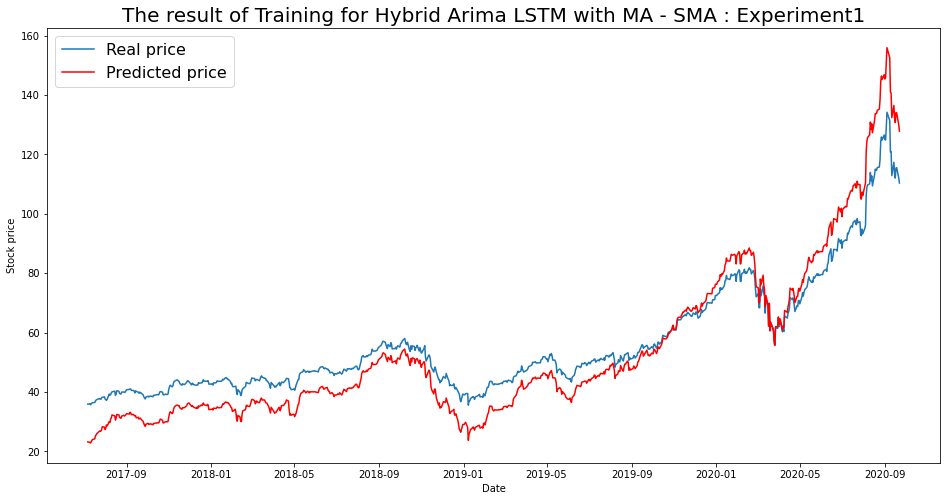

----- Train RMSE for SMA ----- 7.935503486463878
----- Train_MSE_LSTM for SMA ----- 62.97221558368037
----- Train MAE LSTM for SMA ----- 6.979776083083713


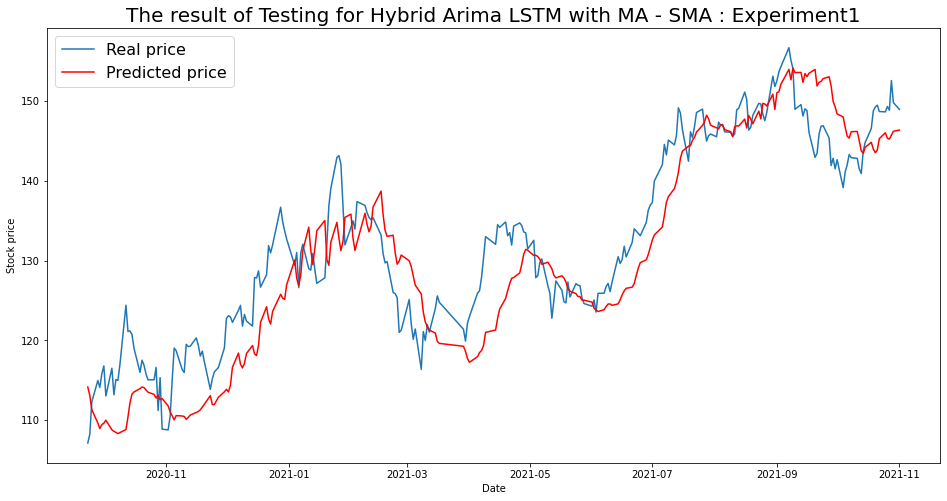

----- Test RMSE for SMA----- 5.434258874547192
----- Test_MSE_LSTM for SMA----- 29.531169515594907
----- Test_MAE_LSTM for SMA----- 4.511922179897357


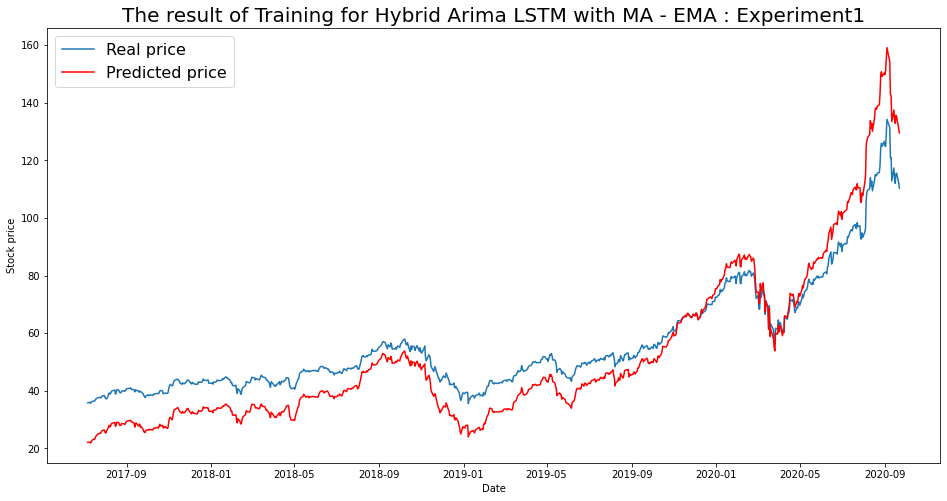

----- Train RMSE for EMA ----- 9.402372564274692
----- Train_MSE_LSTM for EMA ----- 88.40460983742544
----- Train MAE LSTM for EMA ----- 8.28586532352354


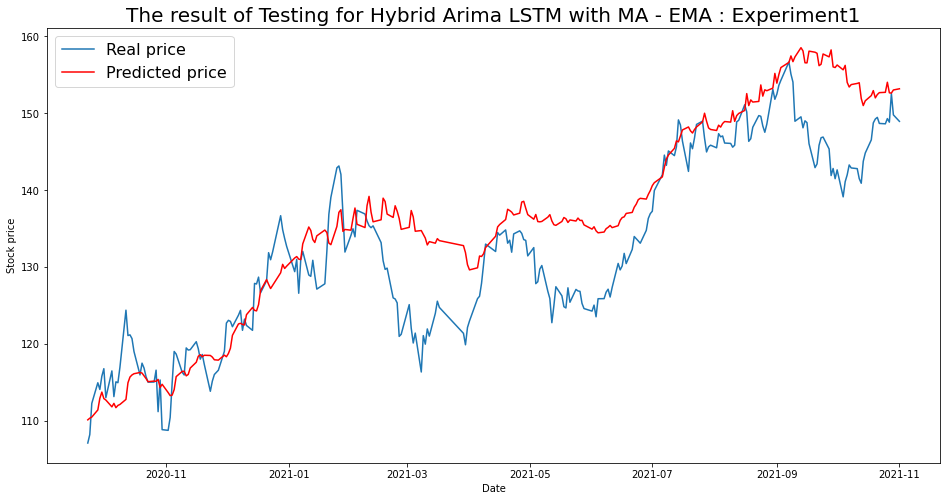

----- Test RMSE for EMA----- 6.655440205795392
----- Test_MSE_LSTM for EMA----- 44.2948843329178
----- Test_MAE_LSTM for EMA----- 5.1903345685841265


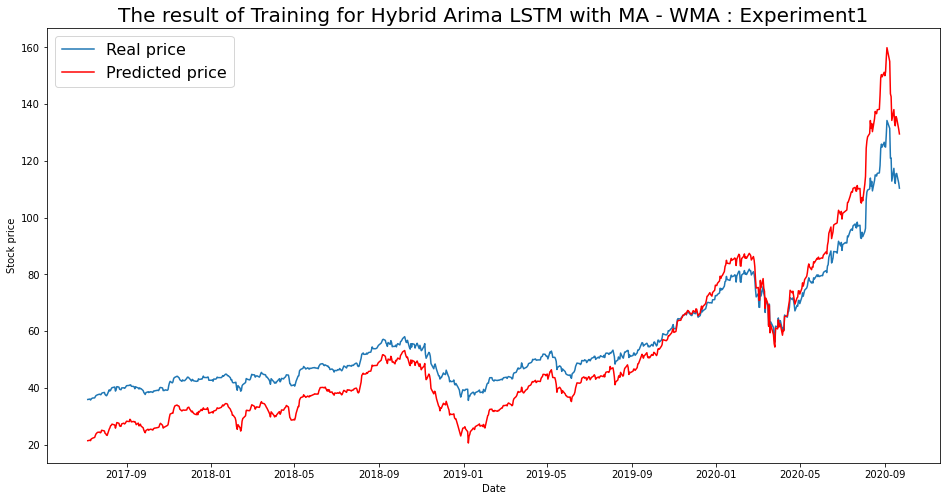

----- Train RMSE for WMA ----- 9.895902209840198
----- Train_MSE_LSTM for WMA ----- 97.92888054672011
----- Train MAE LSTM for WMA ----- 8.733617713903124


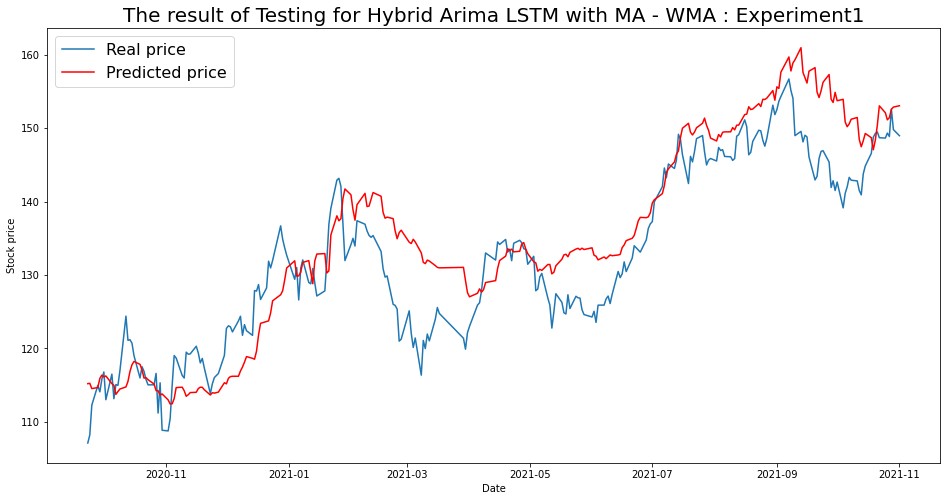

----- Test RMSE for WMA----- 5.900204314829002
----- Test_MSE_LSTM for WMA----- 34.81241095672678
----- Test_MAE_LSTM for WMA----- 4.770935413189914


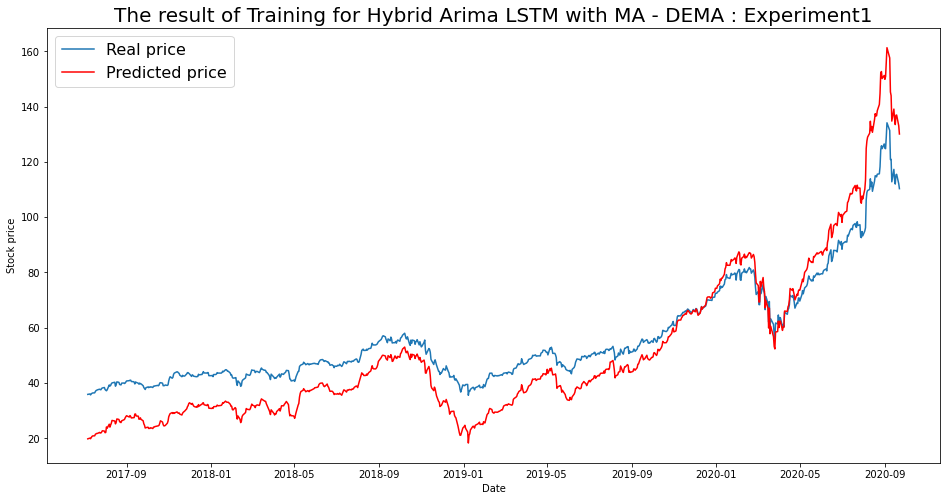

----- Train RMSE for DEMA ----- 10.759004484921052
----- Train_MSE_LSTM for DEMA ----- 115.75617750655131
----- Train MAE LSTM for DEMA ----- 9.577381117820352


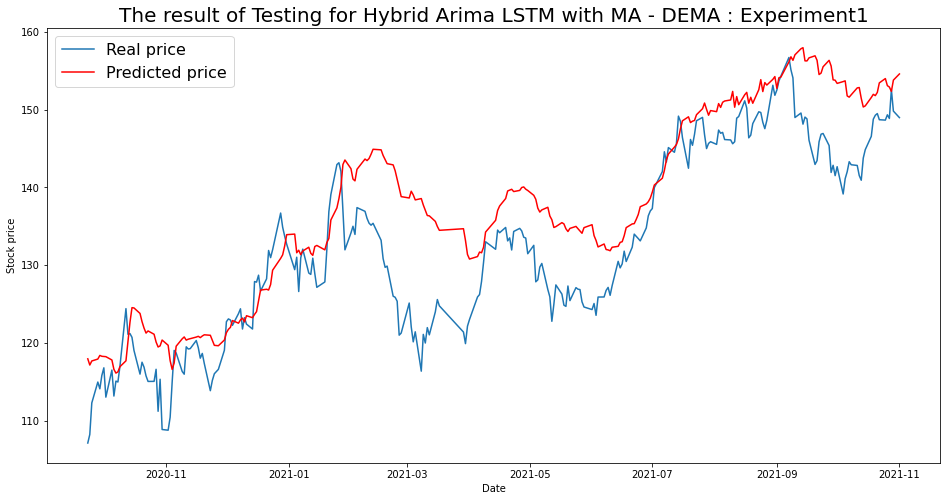

----- Test RMSE for DEMA----- 7.2185623343534235
----- Test_MSE_LSTM for DEMA----- 52.107642174945944
----- Test_MAE_LSTM for DEMA----- 5.72607728989529


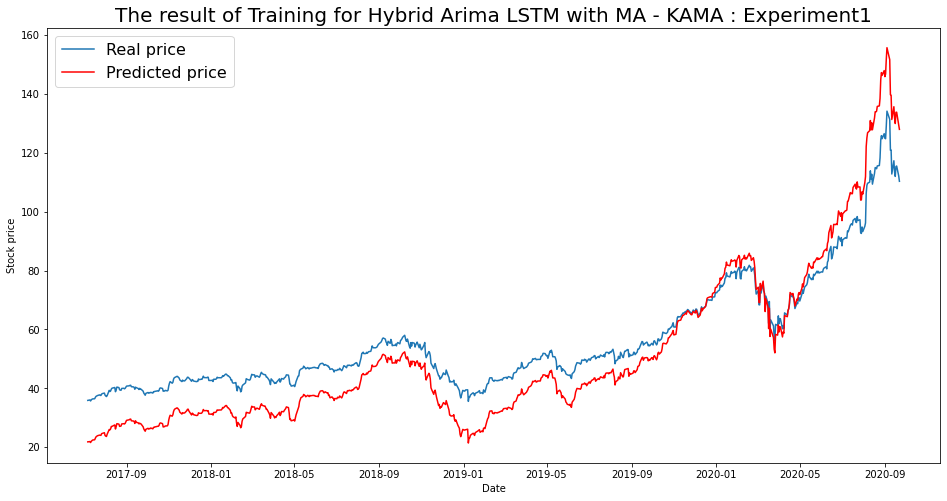

----- Train RMSE for KAMA ----- 9.565138688518502
----- Train_MSE_LSTM for KAMA ----- 91.49187813059346
----- Train MAE LSTM for KAMA ----- 8.554695393558186


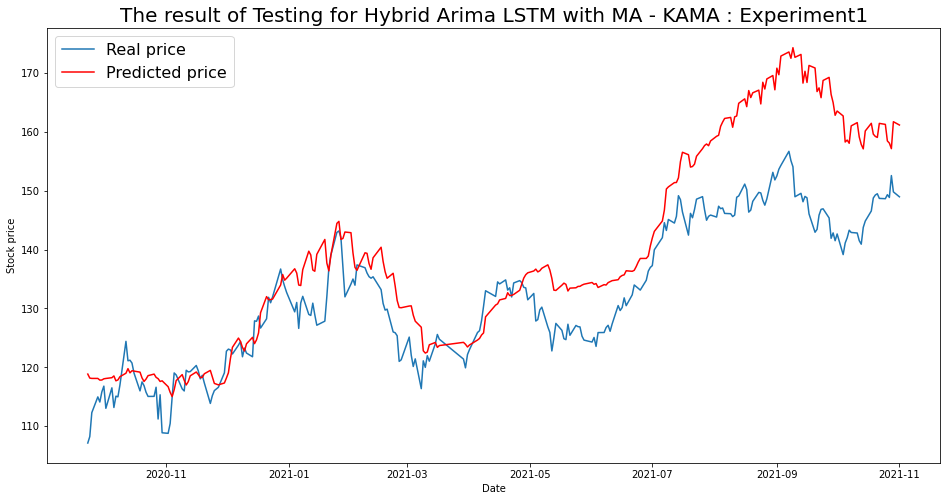

----- Test RMSE for KAMA----- 10.06138476473457
----- Test_MSE_LSTM for KAMA----- 101.2314633840329
----- Test_MAE_LSTM for KAMA----- 7.671150891933135


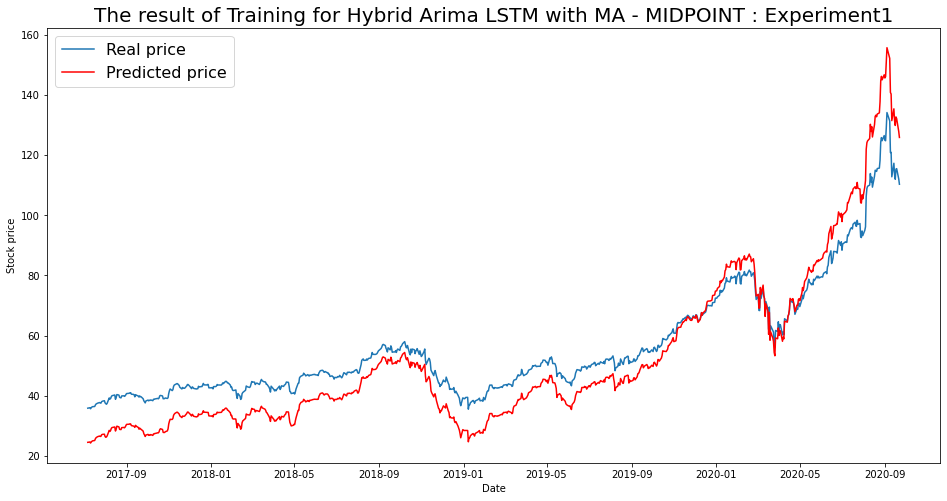

----- Train RMSE for MIDPOINT ----- 8.472630816745282
----- Train_MSE_LSTM for MIDPOINT ----- 71.78547295686181
----- Train MAE LSTM for MIDPOINT ----- 7.568616716744433


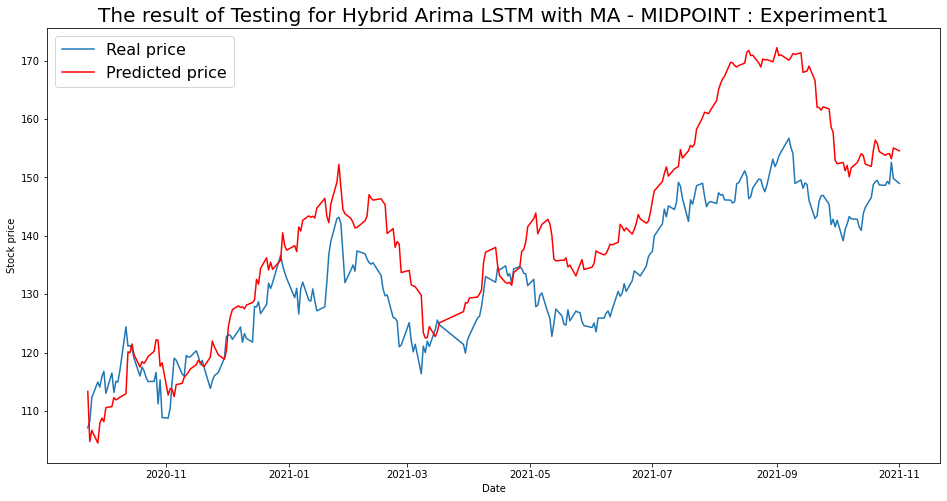

----- Test RMSE for MIDPOINT----- 10.995992269529154
----- Test_MSE_LSTM for MIDPOINT----- 120.91184599154492
----- Test_MAE_LSTM for MIDPOINT----- 9.137686493675425


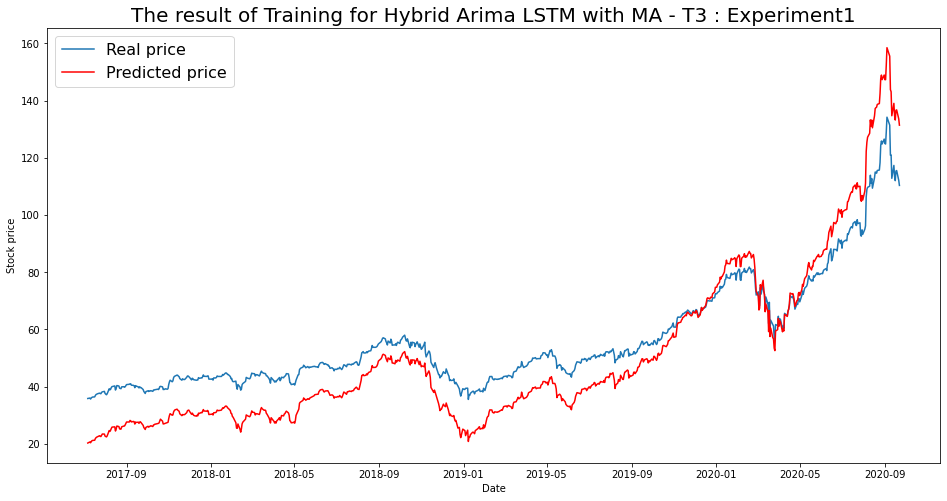

----- Train RMSE for T3 ----- 10.697204443760125
----- Train_MSE_LSTM for T3 ----- 114.43018291160138
----- Train MAE LSTM for T3 ----- 9.607836069383296


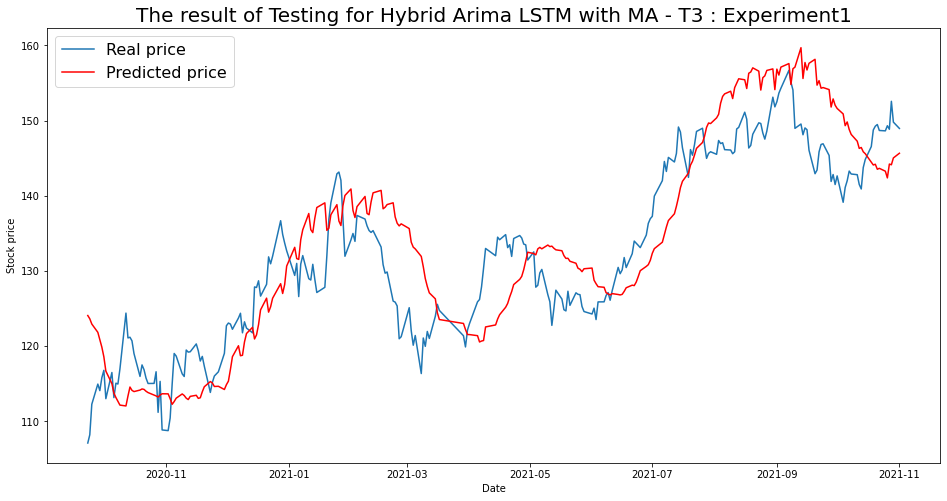

----- Test RMSE for T3----- 6.443131859256255
----- Test_MSE_LSTM for T3----- 41.51394815576297
----- Test_MAE_LSTM for T3----- 5.507945991108928


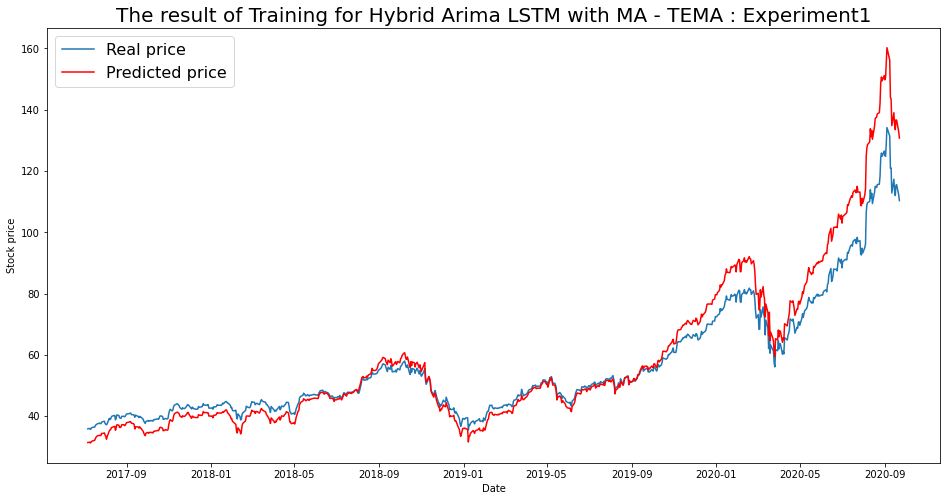

----- Train RMSE for TEMA ----- 6.840259844014339
----- Train_MSE_LSTM for TEMA ----- 46.78915473363507
----- Train MAE LSTM for TEMA ----- 4.502232091756086


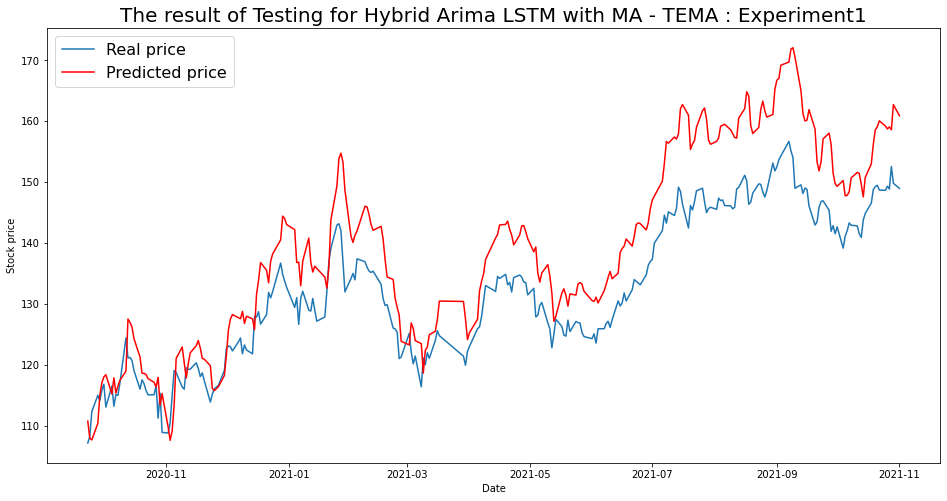

----- Test RMSE for TEMA----- 8.504717540081634
----- Test_MSE_LSTM for TEMA----- 72.3302204365722
----- Test_MAE_LSTM for TEMA----- 7.413730210152267


In [98]:
for i in range(len(list(simulation1.keys()))):
  SIM = list(simulation1.keys())[i]
  plot_train(simulation1,SIM)
  plot_test(simulation1,SIM)

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 2

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # # Option 1
    # # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # option 2
    model = Sequential()
    model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    model.add(Dense(64))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(learning_rate = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM2.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()




    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.44 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.02 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.14 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.05 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.09 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.53 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.57 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.15 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 2.049 seconds
                               SARIMAX Results                                
Dep.

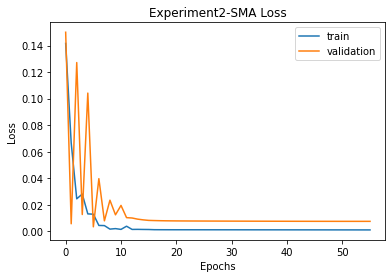


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 63.041023819643854 
RMSE:	 7.939837770360541 
MAPE:	 6.449589599500938
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.02 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.03 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.20 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.06 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.08 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=1.04 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.51 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0.

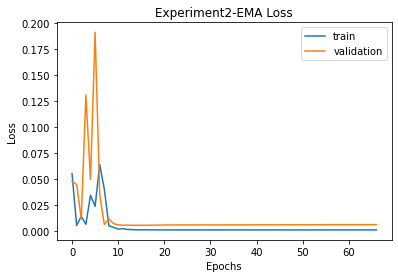


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 63.041023819643854 
RMSE:	 7.939837770360541 
MAPE:	 6.449589599500938

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 63.66877348603133 
RMSE:	 7.979271488427457 
MAPE:	 6.567170782771208
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.03 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.05 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.10 sec
 ARIMA(3,3,1)(0,0,0)[0] 

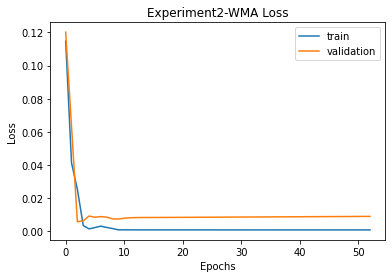


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 63.041023819643854 
RMSE:	 7.939837770360541 
MAPE:	 6.449589599500938

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 63.66877348603133 
RMSE:	 7.979271488427457 
MAPE:	 6.567170782771208

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 74.84193590201411 
RMSE:	 8.65112338959595 
MAPE:	 6.92726320779593
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.02 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.03 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf

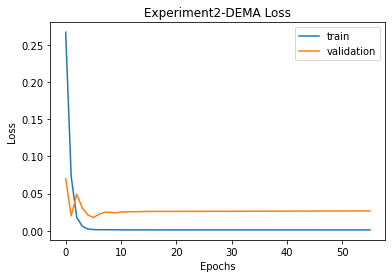


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 63.041023819643854 
RMSE:	 7.939837770360541 
MAPE:	 6.449589599500938

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 63.66877348603133 
RMSE:	 7.979271488427457 
MAPE:	 6.567170782771208

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 74.84193590201411 
RMSE:	 8.65112338959595 
MAPE:	 6.92726320779593

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 124.07774757087437 
RMSE:	 11.139019147612341 
MAPE:	 9.962964959911572
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(0,3,0)(0

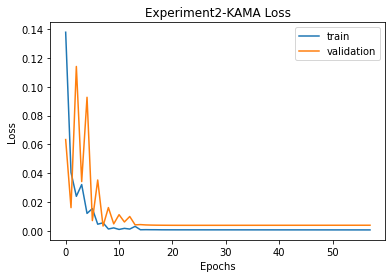


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 63.041023819643854 
RMSE:	 7.939837770360541 
MAPE:	 6.449589599500938

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 63.66877348603133 
RMSE:	 7.979271488427457 
MAPE:	 6.567170782771208

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 74.84193590201411 
RMSE:	 8.65112338959595 
MAPE:	 6.92726320779593

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 124.07774757087437 
RMSE:	 11.139019147612341 
MAPE:	 9.962964959911572

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 64.92528911521055 
RMSE:	 8.057623043752454 
MAPE:	 6.682416615913553
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MIDP

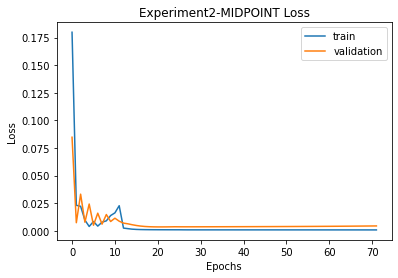


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 63.041023819643854 
RMSE:	 7.939837770360541 
MAPE:	 6.449589599500938

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 63.66877348603133 
RMSE:	 7.979271488427457 
MAPE:	 6.567170782771208

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 74.84193590201411 
RMSE:	 8.65112338959595 
MAPE:	 6.92726320779593

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 124.07774757087437 
RMSE:	 11.139019147612341 
MAPE:	 9.962964959911572

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 64.92528911521055 
RMSE:	 8.057623043752454 
MAPE:	 6.682416615913553

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 68.19255604013144 
RMSE:	 8.25787842246006 
MAPE:	 6.72839330666561
T3
T3([input_arrays], [timepe

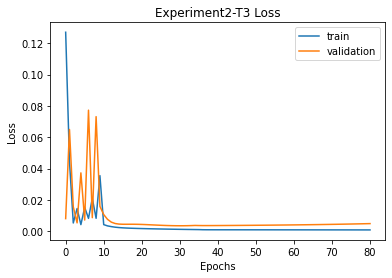


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 63.041023819643854 
RMSE:	 7.939837770360541 
MAPE:	 6.449589599500938

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 63.66877348603133 
RMSE:	 7.979271488427457 
MAPE:	 6.567170782771208

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 74.84193590201411 
RMSE:	 8.65112338959595 
MAPE:	 6.92726320779593

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 124.07774757087437 
RMSE:	 11.139019147612341 
MAPE:	 9.962964959911572

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 64.92528911521055 
RMSE:	 8.057623043752454 
MAPE:	 6.682416615913553

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 68.19255604013144 
RMSE:	 8.25787842246006 
MAPE:	 6.72839330666561

T3
Prediction vs Close:		53.

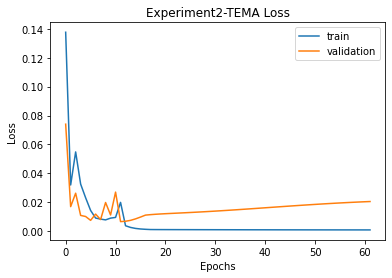


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 63.041023819643854 
RMSE:	 7.939837770360541 
MAPE:	 6.449589599500938

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 63.66877348603133 
RMSE:	 7.979271488427457 
MAPE:	 6.567170782771208

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 74.84193590201411 
RMSE:	 8.65112338959595 
MAPE:	 6.92726320779593

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 124.07774757087437 
RMSE:	 11.139019147612341 
MAPE:	 9.962964959911572

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 64.92528911521055 
RMSE:	 8.057623043752454 
MAPE:	 6.682416615913553

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 68.19255604013144 
RMSE:	 8.25787842246006 
MAPE:	 6.72839330666561

T3
Prediction vs Close:		53.

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation2 = {}
    imgfile = 'Experiment2'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation2[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation2_data.json', 'w') as fp:
                  json.dump(simulation2, fp)

              for ma in simulation2.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation2[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation2[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation2[ma]['final']['mse'],
                        '\nRMSE:\t', simulation2[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation2[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment2.png to Experiment2 (1).png


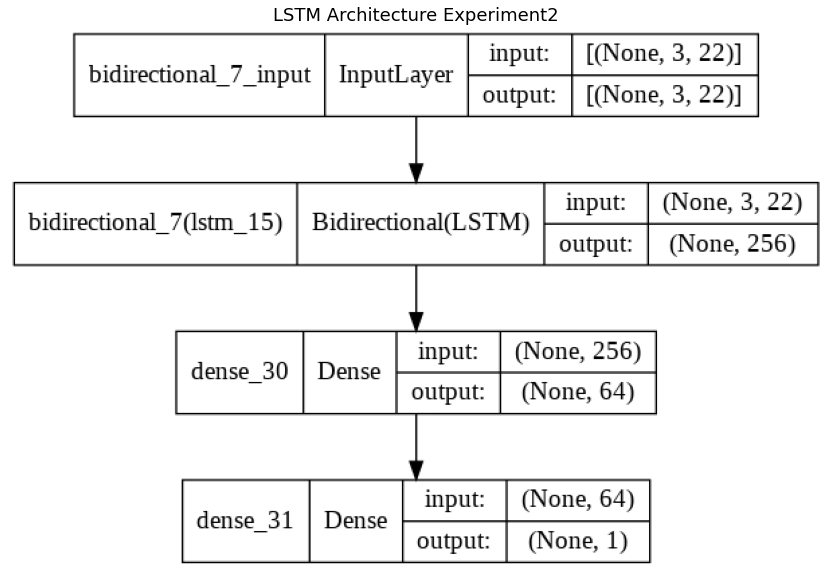

In [ ]:
img = cv2.imread('Experiment2.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [99]:
with open('simulation2_data.json') as json_file:
    simulation2 = json.load(json_file)
fileimg = 'Experiment2'

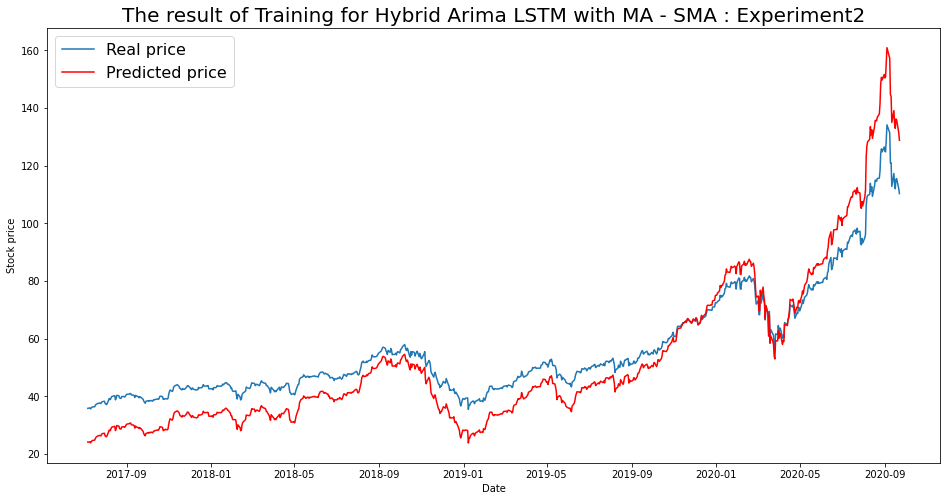

----- Train RMSE for SMA ----- 8.825487281603085
----- Train_MSE_LSTM for SMA ----- 77.88922575773782
----- Train MAE LSTM for SMA ----- 7.678486704575587


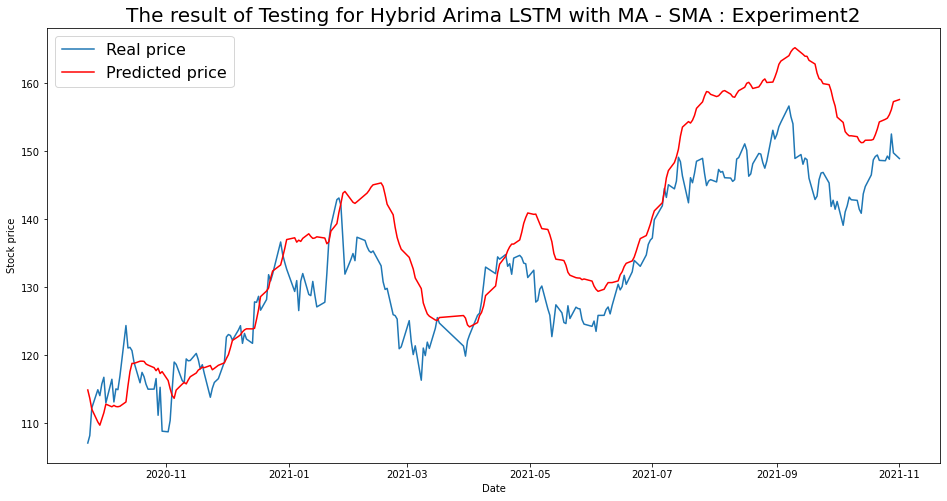

----- Test RMSE for SMA----- 7.939837770360541
----- Test_MSE_LSTM for SMA----- 63.041023819643854
----- Test_MAE_LSTM for SMA----- 6.449589599500938


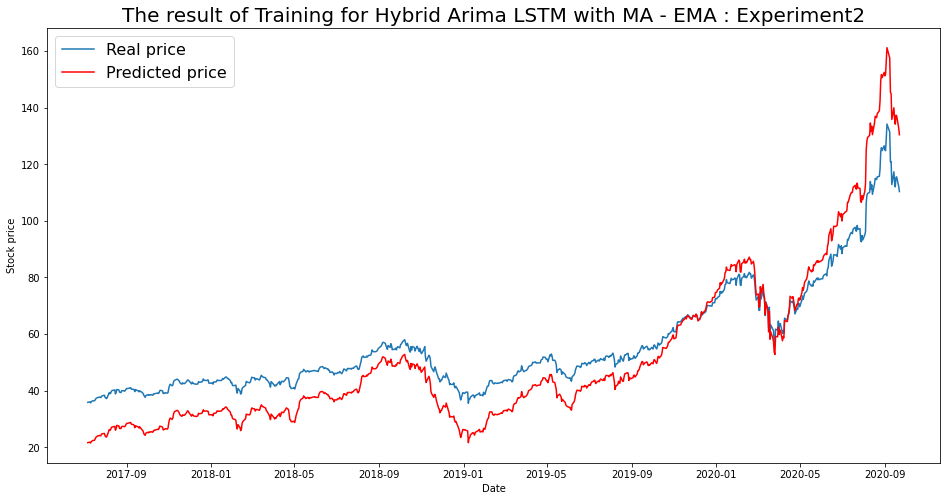

----- Train RMSE for EMA ----- 10.17885992167541
----- Train_MSE_LSTM for EMA ----- 103.60918930508994
----- Train MAE LSTM for EMA ----- 9.004301877044565


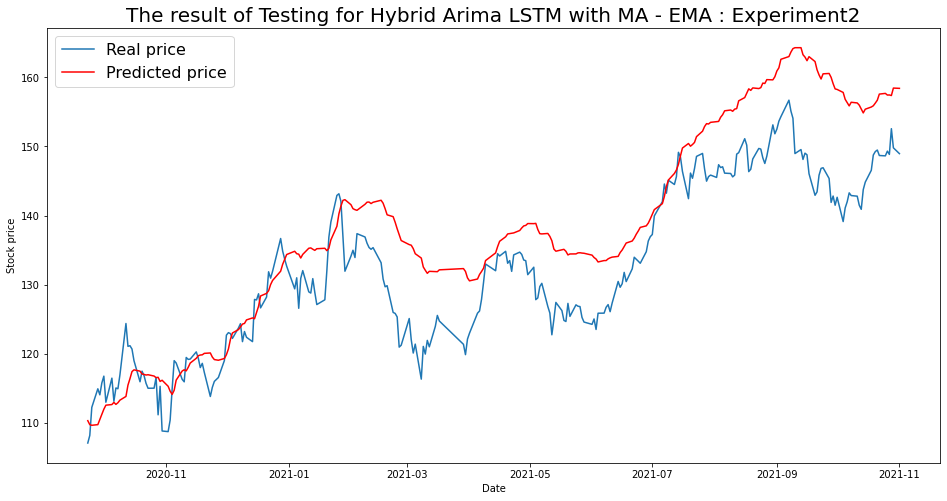

----- Test RMSE for EMA----- 7.979271488427457
----- Test_MSE_LSTM for EMA----- 63.66877348603133
----- Test_MAE_LSTM for EMA----- 6.567170782771208


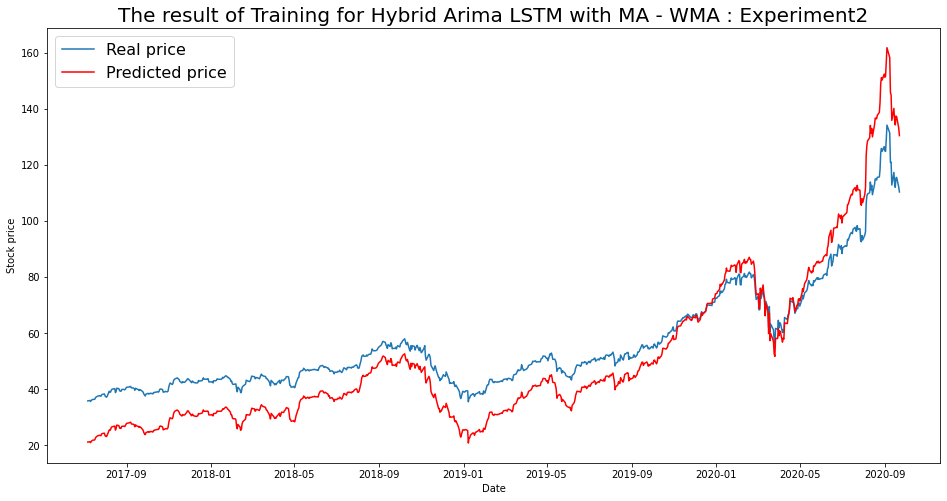

----- Train RMSE for WMA ----- 10.465802137903177
----- Train_MSE_LSTM for WMA ----- 109.5330143897387
----- Train MAE LSTM for WMA ----- 9.31366489027537


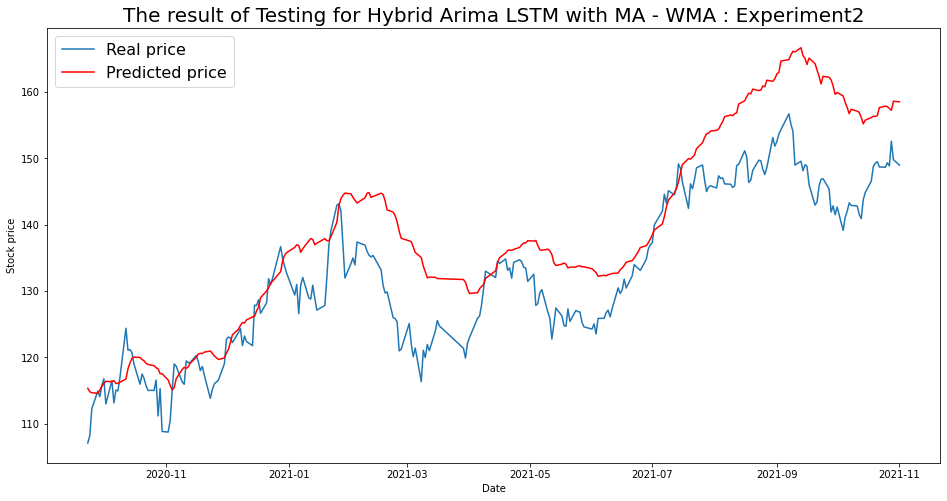

----- Test RMSE for WMA----- 8.65112338959595
----- Test_MSE_LSTM for WMA----- 74.84193590201411
----- Test_MAE_LSTM for WMA----- 6.92726320779593


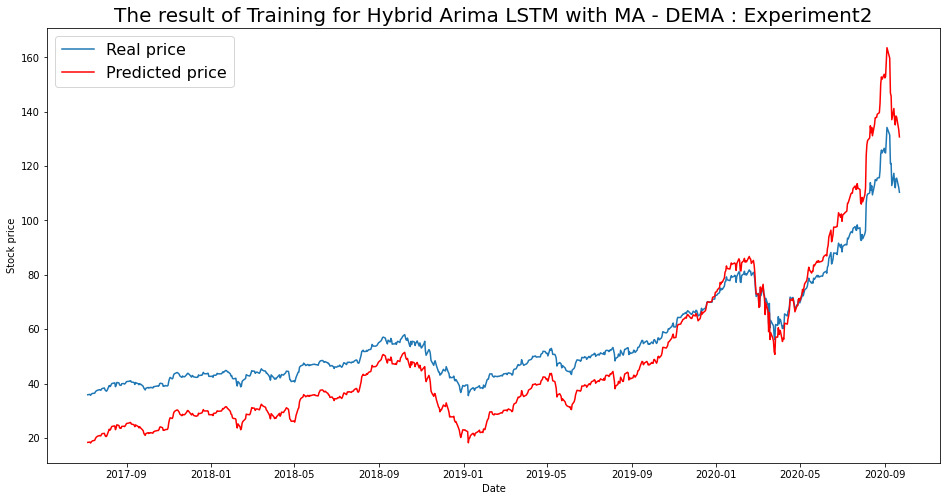

----- Train RMSE for DEMA ----- 12.116566242192249
----- Train_MSE_LSTM for DEMA ----- 146.8111775014328
----- Train MAE LSTM for DEMA ----- 10.867763409922118


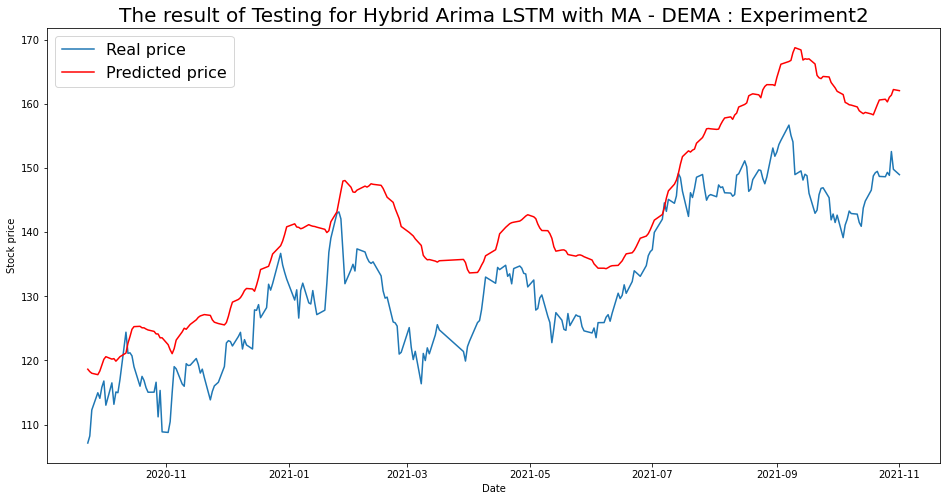

----- Test RMSE for DEMA----- 11.139019147612341
----- Test_MSE_LSTM for DEMA----- 124.07774757087437
----- Test_MAE_LSTM for DEMA----- 9.962964959911572


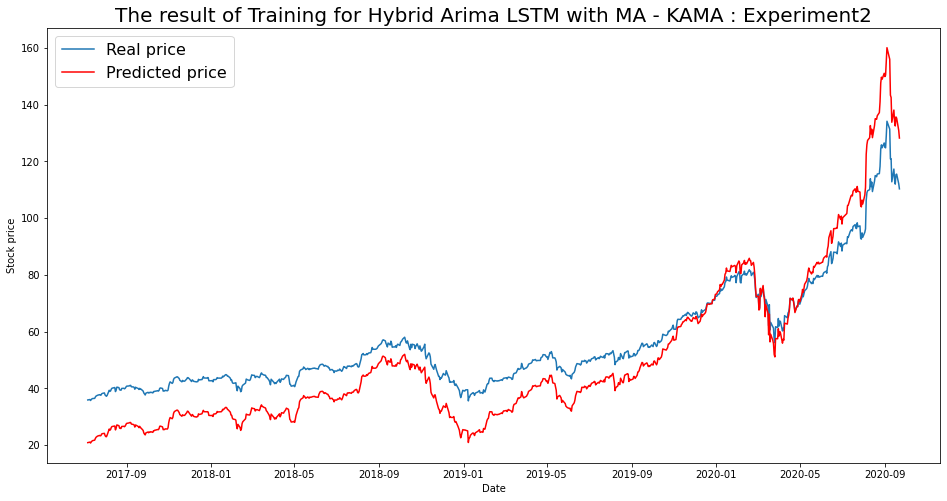

----- Train RMSE for KAMA ----- 10.526385532586437
----- Train_MSE_LSTM for KAMA ----- 110.80479238064504
----- Train MAE LSTM for KAMA ----- 9.464160976428907


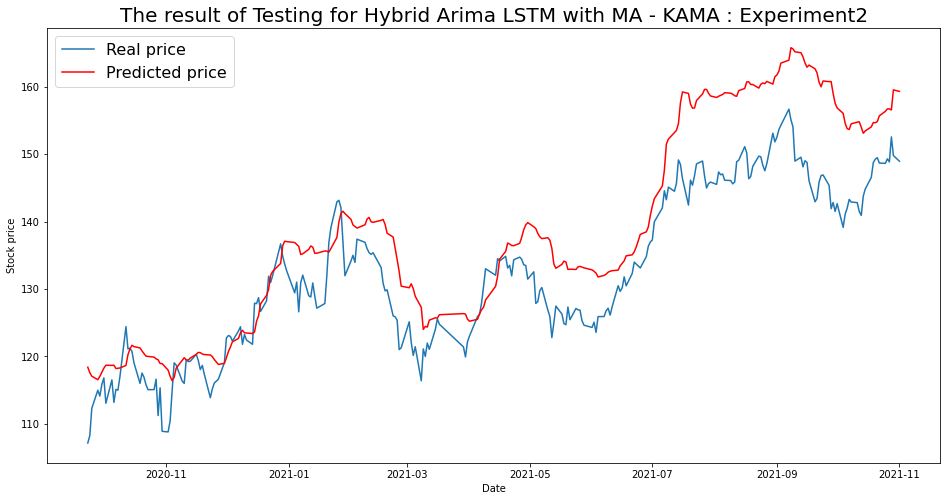

----- Test RMSE for KAMA----- 8.057623043752454
----- Test_MSE_LSTM for KAMA----- 64.92528911521055
----- Test_MAE_LSTM for KAMA----- 6.682416615913553


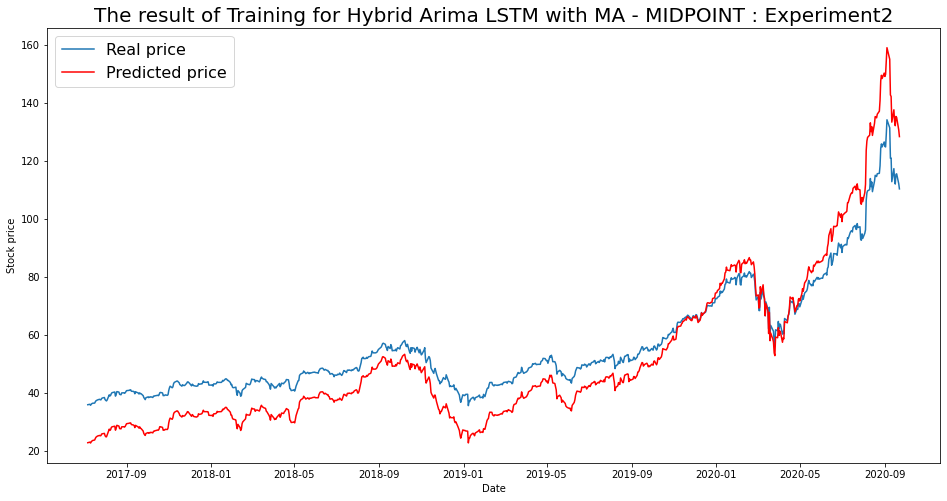

----- Train RMSE for MIDPOINT ----- 9.44780598788214
----- Train_MSE_LSTM for MIDPOINT ----- 89.26103798466161
----- Train MAE LSTM for MIDPOINT ----- 8.392066648593033


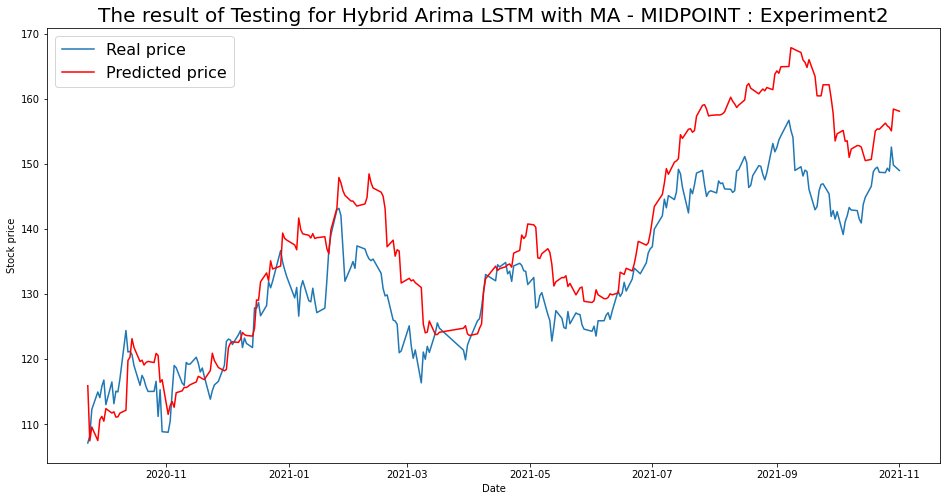

----- Test RMSE for MIDPOINT----- 8.25787842246006
----- Test_MSE_LSTM for MIDPOINT----- 68.19255604013144
----- Test_MAE_LSTM for MIDPOINT----- 6.72839330666561


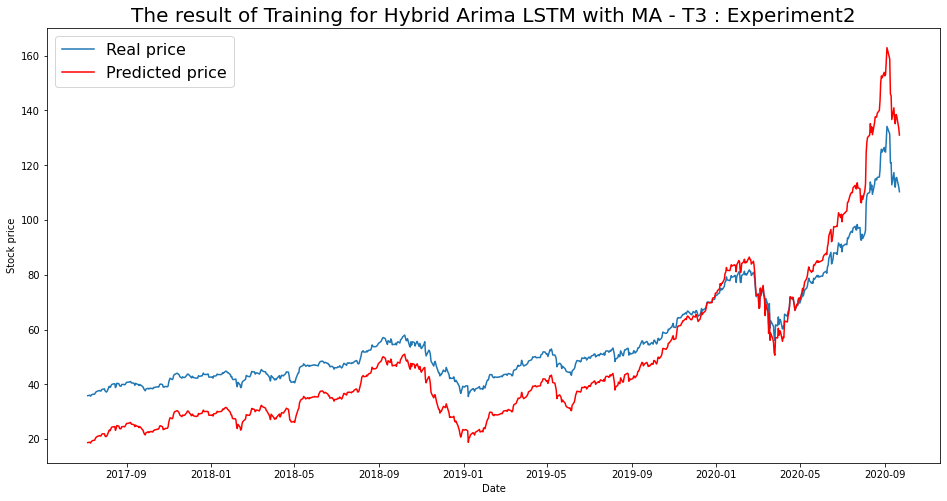

----- Train RMSE for T3 ----- 12.031116618105388
----- Train_MSE_LSTM for T3 ----- 144.74776707845163
----- Train MAE LSTM for T3 ----- 10.821733970313776


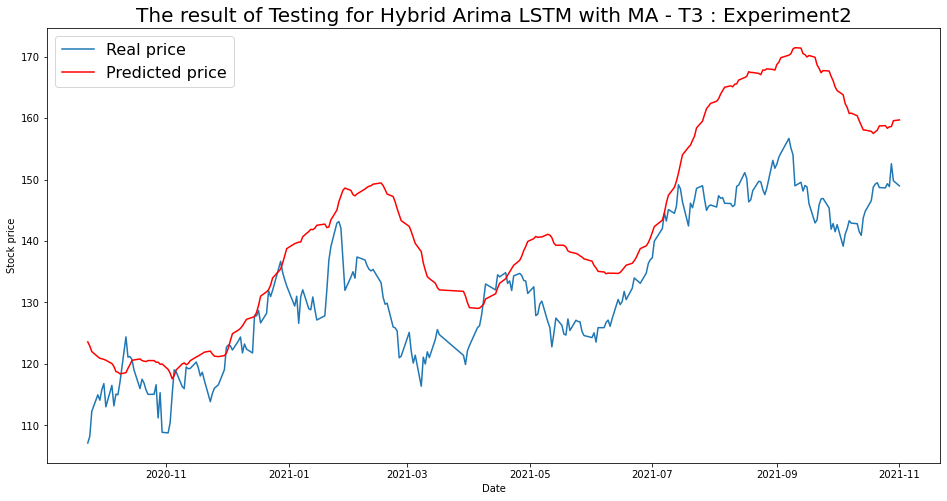

----- Test RMSE for T3----- 12.207785680983669
----- Test_MSE_LSTM for T3----- 149.0300312328299
----- Test_MAE_LSTM for T3----- 10.094975187792123


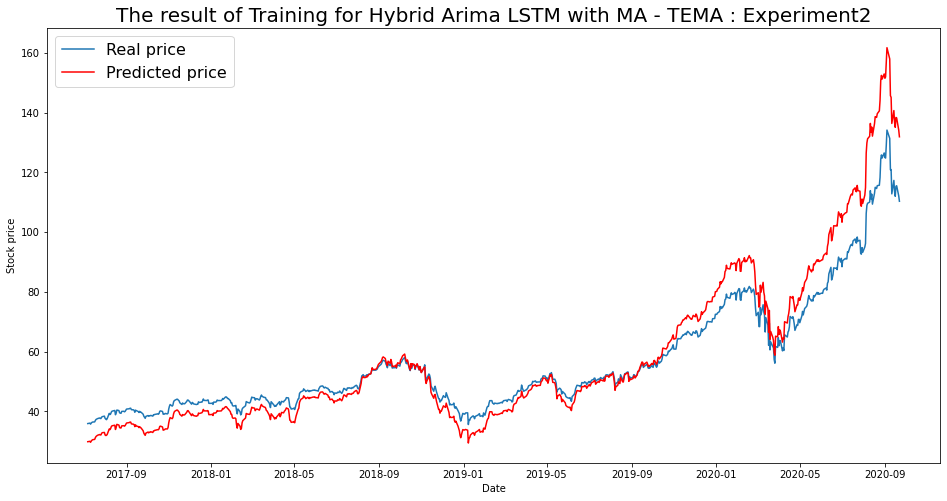

----- Train RMSE for TEMA ----- 7.432502353073835
----- Train_MSE_LSTM for TEMA ----- 55.242091228448096
----- Train MAE LSTM for TEMA ----- 5.1691971761128395


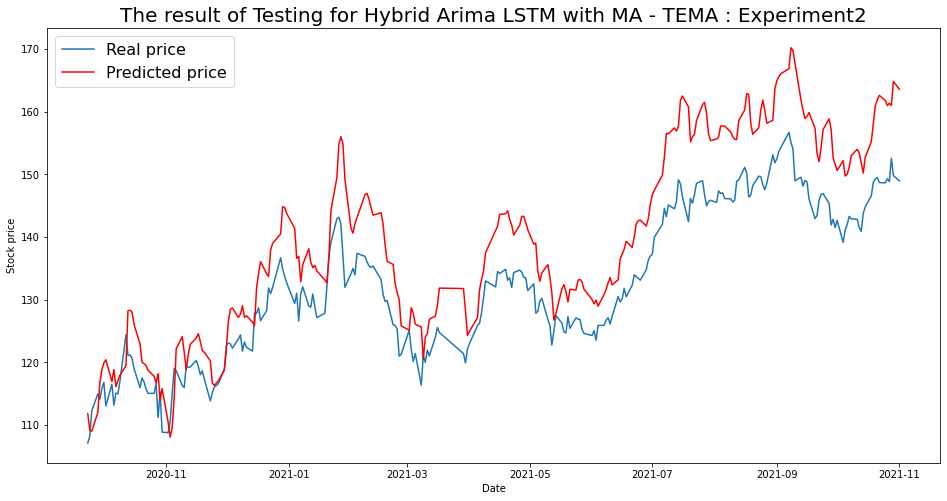

----- Test RMSE for TEMA----- 8.473866740227066
----- Test_MSE_LSTM for TEMA----- 71.80641753112648
----- Test_MAE_LSTM for TEMA----- 7.512371017185029


In [100]:
for i in range(len(list(simulation2.keys()))):
  SIM = list(simulation2.keys())[i]
  plot_train(simulation2,SIM)
  plot_test(simulation2,SIM)

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 3

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # # Option 1
    # # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()




    # Option 3
    # define custom activation
    # 
    class Double_Tanh(Activation):
        def __init__(self, activation, **kwargs):
            super(Double_Tanh, self).__init__(activation, **kwargs)
            self.__name__ = 'double_tanh'

    def double_tanh(x):
        return (K.tanh(x) * 2)

    get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
        # Model Generation
    model = Sequential()
    #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    model.add(Dense(1))
    model.add(Activation(double_tanh))
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM3.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.03 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.13 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.05 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.06 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.53 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.53 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.14 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 1.919 seconds
                               SARIMAX Results                                
Dep.

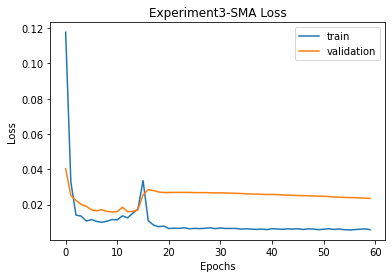


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 123.96893050522607 
RMSE:	 11.134133576764116 
MAPE:	 9.602398807260117
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.02 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.03 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.21 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.05 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.08 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.59 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.45 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0

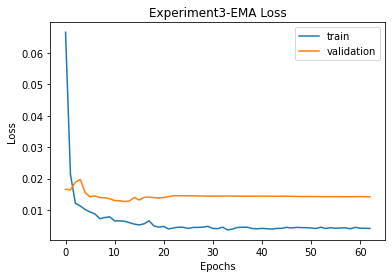


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 123.96893050522607 
RMSE:	 11.134133576764116 
MAPE:	 9.602398807260117

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 63.919262026708296 
RMSE:	 7.994952284204596 
MAPE:	 6.479287961204322
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.02 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.03 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.19 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.05 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.11 sec
 ARIMA(3,3,1)(0,0,0)[

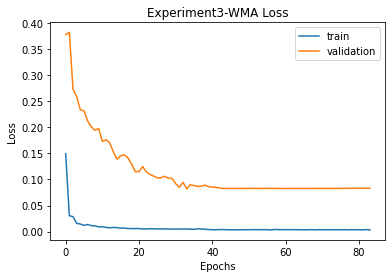


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 123.96893050522607 
RMSE:	 11.134133576764116 
MAPE:	 9.602398807260117

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 63.919262026708296 
RMSE:	 7.994952284204596 
MAPE:	 6.479287961204322

WMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 24.651058301828286 
RMSE:	 4.9649832126431495 
MAPE:	 3.9308905500983484
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.02 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.03 sec
 ARIMA(0,3,1)(0,0,0)[0]             :

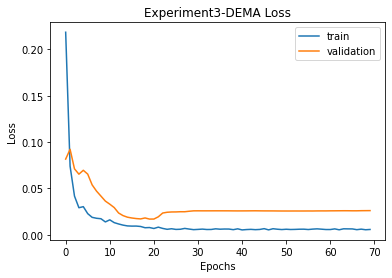


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 123.96893050522607 
RMSE:	 11.134133576764116 
MAPE:	 9.602398807260117

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 63.919262026708296 
RMSE:	 7.994952284204596 
MAPE:	 6.479287961204322

WMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 24.651058301828286 
RMSE:	 4.9649832126431495 
MAPE:	 3.9308905500983484

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 156.8635759091866 
RMSE:	 12.524518989134338 
MAPE:	 11.387412907589542
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(0

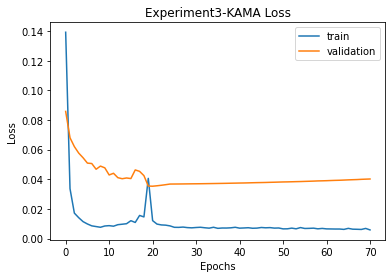


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 123.96893050522607 
RMSE:	 11.134133576764116 
MAPE:	 9.602398807260117

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 63.919262026708296 
RMSE:	 7.994952284204596 
MAPE:	 6.479287961204322

WMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 24.651058301828286 
RMSE:	 4.9649832126431495 
MAPE:	 3.9308905500983484

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 156.8635759091866 
RMSE:	 12.524518989134338 
MAPE:	 11.387412907589542

KAMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 59.19746610115158 
RMSE:	 7.69398895899595 
MAPE:	 6.776737847872761
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working o

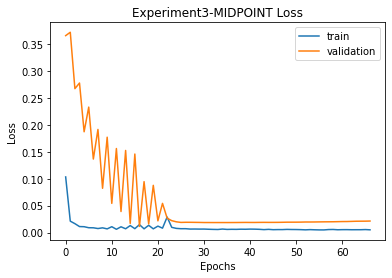


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 123.96893050522607 
RMSE:	 11.134133576764116 
MAPE:	 9.602398807260117

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 63.919262026708296 
RMSE:	 7.994952284204596 
MAPE:	 6.479287961204322

WMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 24.651058301828286 
RMSE:	 4.9649832126431495 
MAPE:	 3.9308905500983484

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 156.8635759091866 
RMSE:	 12.524518989134338 
MAPE:	 11.387412907589542

KAMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 59.19746610115158 
RMSE:	 7.69398895899595 
MAPE:	 6.776737847872761

MIDPOINT
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 46.490023595118274 
RMSE:	 6.818359303756166 
MAPE:	 5.538801606657957
T3
T3([input_arrays]

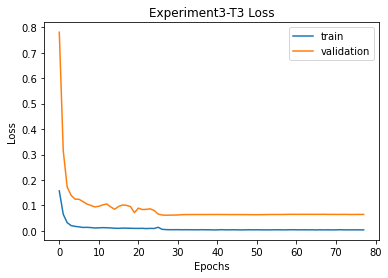


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 123.96893050522607 
RMSE:	 11.134133576764116 
MAPE:	 9.602398807260117

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 63.919262026708296 
RMSE:	 7.994952284204596 
MAPE:	 6.479287961204322

WMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 24.651058301828286 
RMSE:	 4.9649832126431495 
MAPE:	 3.9308905500983484

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 156.8635759091866 
RMSE:	 12.524518989134338 
MAPE:	 11.387412907589542

KAMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 59.19746610115158 
RMSE:	 7.69398895899595 
MAPE:	 6.776737847872761

MIDPOINT
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 46.490023595118274 
RMSE:	 6.818359303756166 
MAPE:	 5.538801606657957

T3
Prediction vs Cl

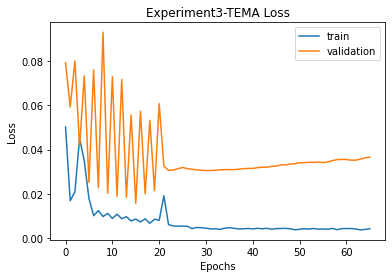


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 123.96893050522607 
RMSE:	 11.134133576764116 
MAPE:	 9.602398807260117

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 63.919262026708296 
RMSE:	 7.994952284204596 
MAPE:	 6.479287961204322

WMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 24.651058301828286 
RMSE:	 4.9649832126431495 
MAPE:	 3.9308905500983484

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 156.8635759091866 
RMSE:	 12.524518989134338 
MAPE:	 11.387412907589542

KAMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 59.19746610115158 
RMSE:	 7.69398895899595 
MAPE:	 6.776737847872761

MIDPOINT
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 46.490023595118274 
RMSE:	 6.818359303756166 
MAPE:	 5.538801606657957

T3
Prediction vs Cl

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation3 = {}
    imgfile = 'Experiment3'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation3[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation3_data.json', 'w') as fp:
                  json.dump(simulation3, fp)

              for ma in simulation3.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation3[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation3[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation3[ma]['final']['mse'],
                        '\nRMSE:\t', simulation3[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation3[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment3.png to Experiment3 (1).png


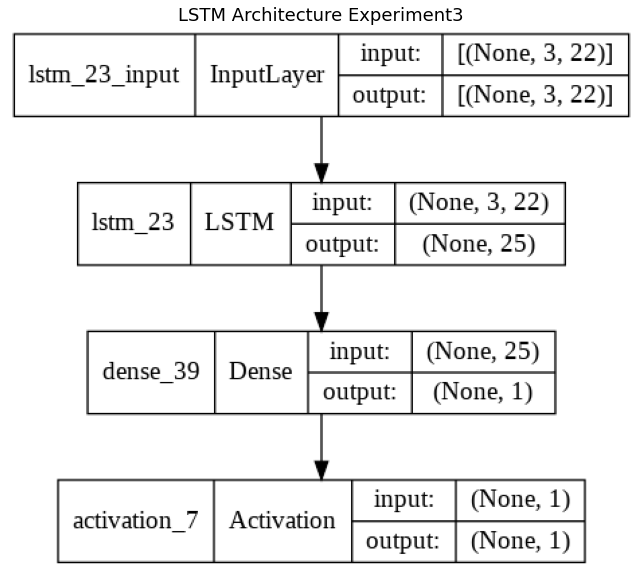

In [ ]:
img = cv2.imread('Experiment3.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [103]:
with open('simulation3_data.json') as json_file:
    simulation3 = json.load(json_file)
fileimg = 'Experiment3'

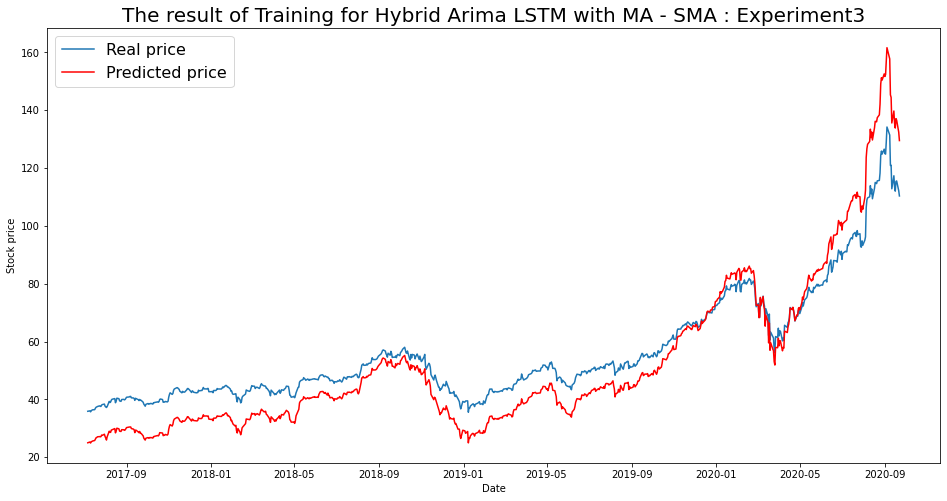

----- Train RMSE for SMA ----- 8.930823939228564
----- Train_MSE_LSTM for SMA ----- 79.759616233498
----- Train MAE LSTM for SMA ----- 7.745279391393028


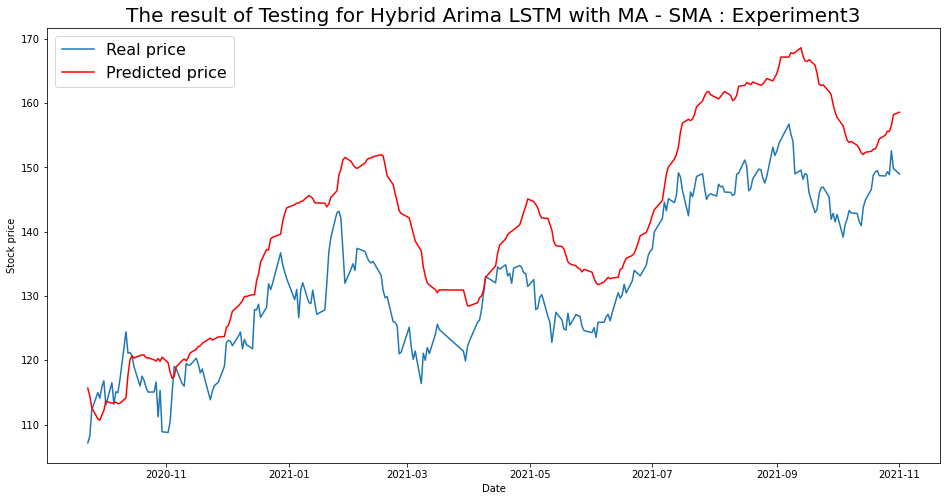

----- Test RMSE for SMA----- 11.134133576764116
----- Test_MSE_LSTM for SMA----- 123.96893050522607
----- Test_MAE_LSTM for SMA----- 9.602398807260117


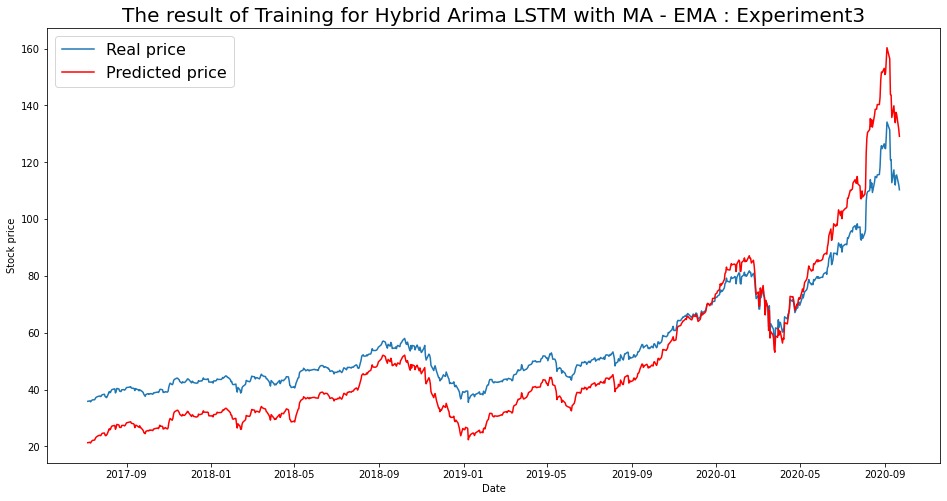

----- Train RMSE for EMA ----- 10.565146653068828
----- Train_MSE_LSTM for EMA ----- 111.62232380085146
----- Train MAE LSTM for EMA ----- 9.411117943188193


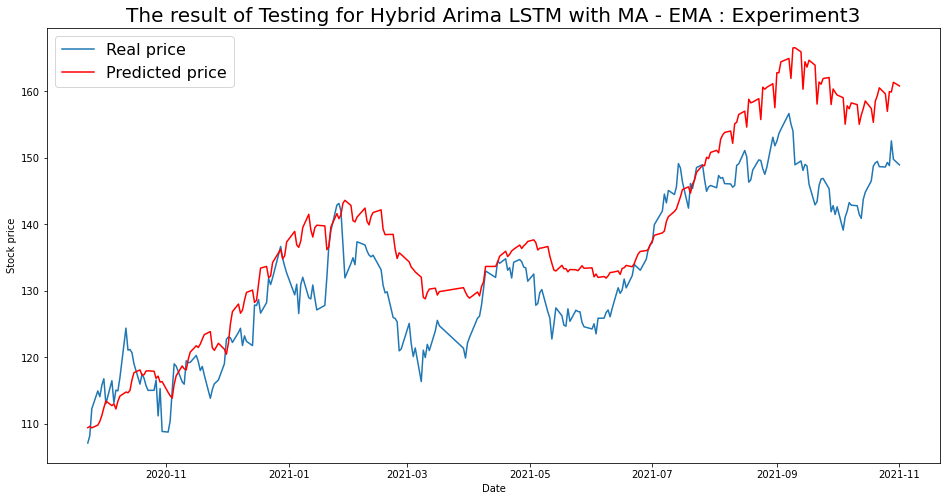

----- Test RMSE for EMA----- 7.994952284204596
----- Test_MSE_LSTM for EMA----- 63.919262026708296
----- Test_MAE_LSTM for EMA----- 6.479287961204322


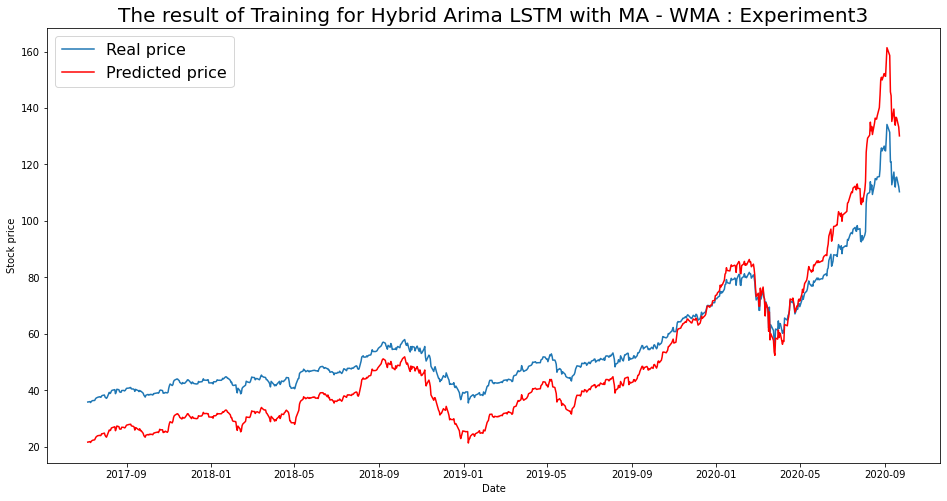

----- Train RMSE for WMA ----- 10.832264554488258
----- Train_MSE_LSTM for WMA ----- 117.3379553784227
----- Train MAE LSTM for WMA ----- 9.744005795817195


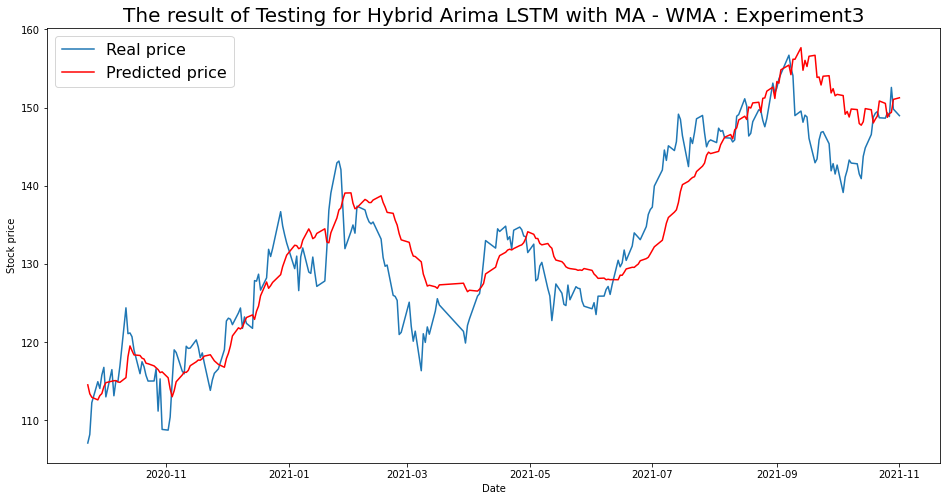

----- Test RMSE for WMA----- 4.9649832126431495
----- Test_MSE_LSTM for WMA----- 24.651058301828286
----- Test_MAE_LSTM for WMA----- 3.9308905500983484


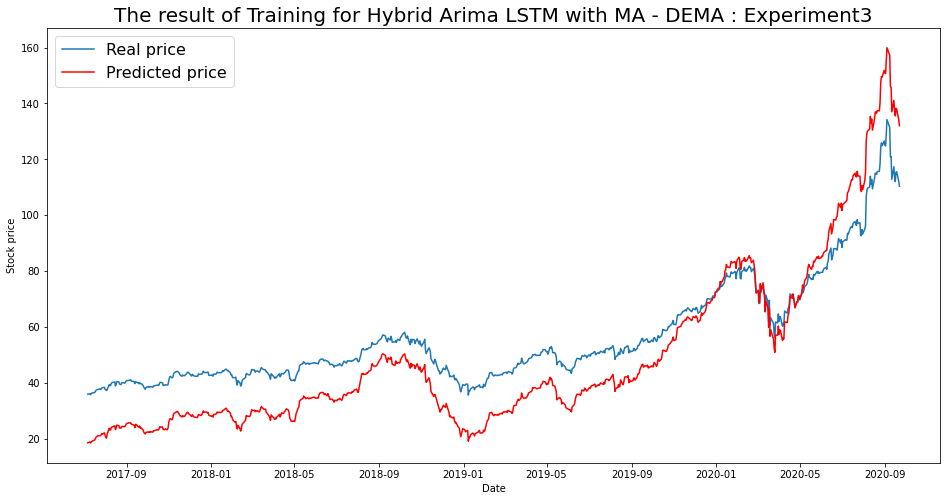

----- Train RMSE for DEMA ----- 12.56480336163703
----- Train_MSE_LSTM for DEMA ----- 157.8742835166052
----- Train MAE LSTM for DEMA ----- 11.433644929764755


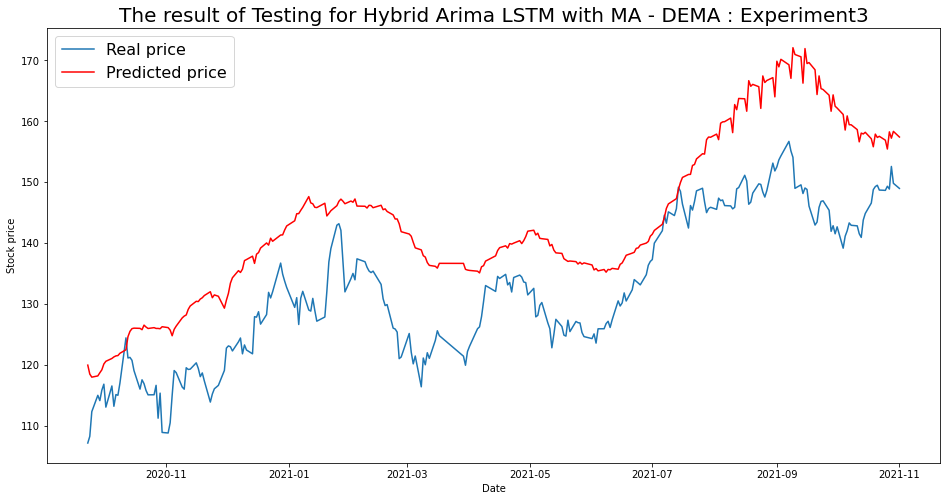

----- Test RMSE for DEMA----- 12.524518989134338
----- Test_MSE_LSTM for DEMA----- 156.8635759091866
----- Test_MAE_LSTM for DEMA----- 11.387412907589542


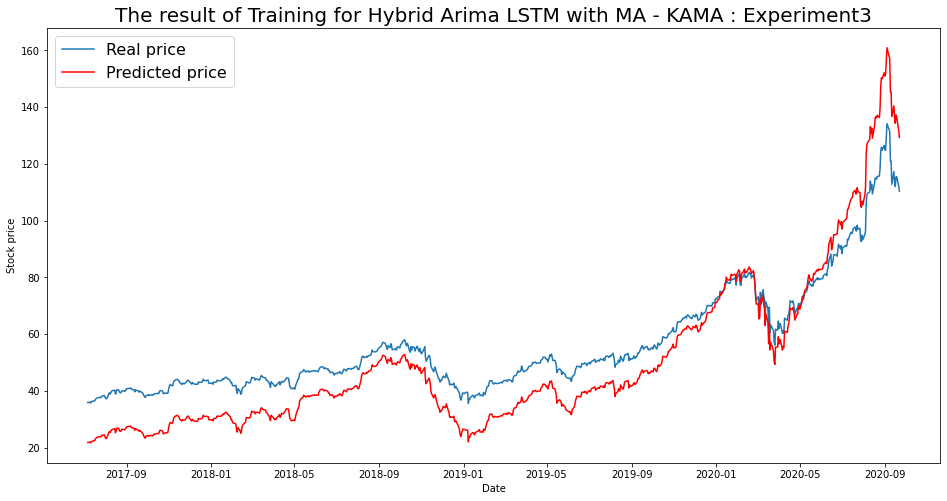

----- Train RMSE for KAMA ----- 10.593820426171298
----- Train_MSE_LSTM for KAMA ----- 112.22903122196423
----- Train MAE LSTM for KAMA ----- 9.500249049755386


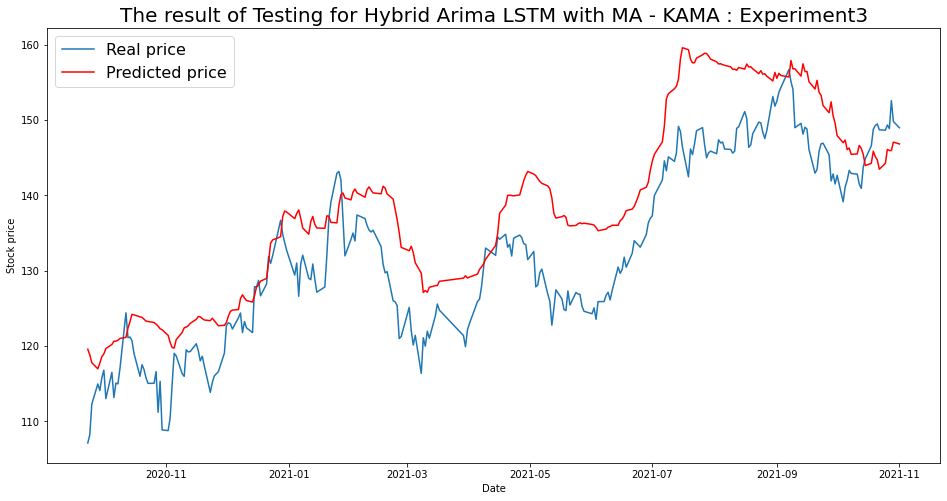

----- Test RMSE for KAMA----- 7.69398895899595
----- Test_MSE_LSTM for KAMA----- 59.19746610115158
----- Test_MAE_LSTM for KAMA----- 6.776737847872761


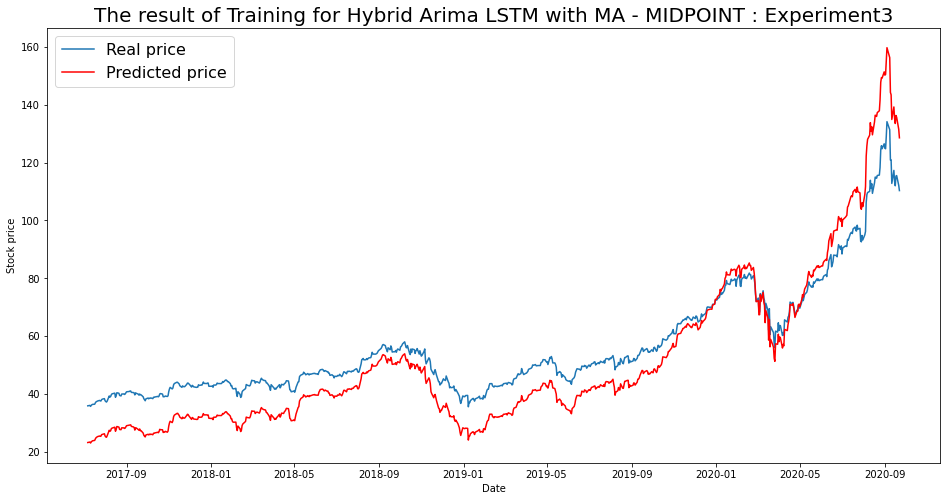

----- Train RMSE for MIDPOINT ----- 9.5736663214708
----- Train_MSE_LSTM for MIDPOINT ----- 91.65508683486424
----- Train MAE LSTM for MIDPOINT ----- 8.498581498536272


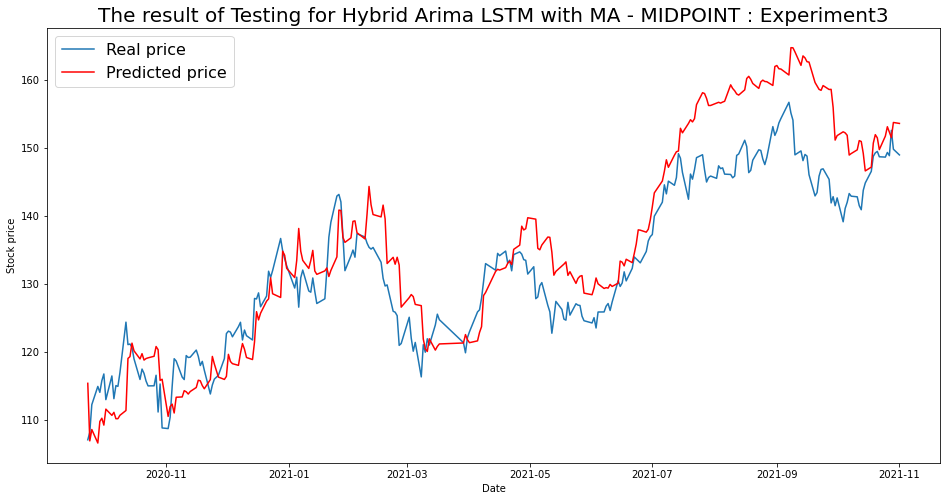

----- Test RMSE for MIDPOINT----- 6.818359303756166
----- Test_MSE_LSTM for MIDPOINT----- 46.490023595118274
----- Test_MAE_LSTM for MIDPOINT----- 5.538801606657957


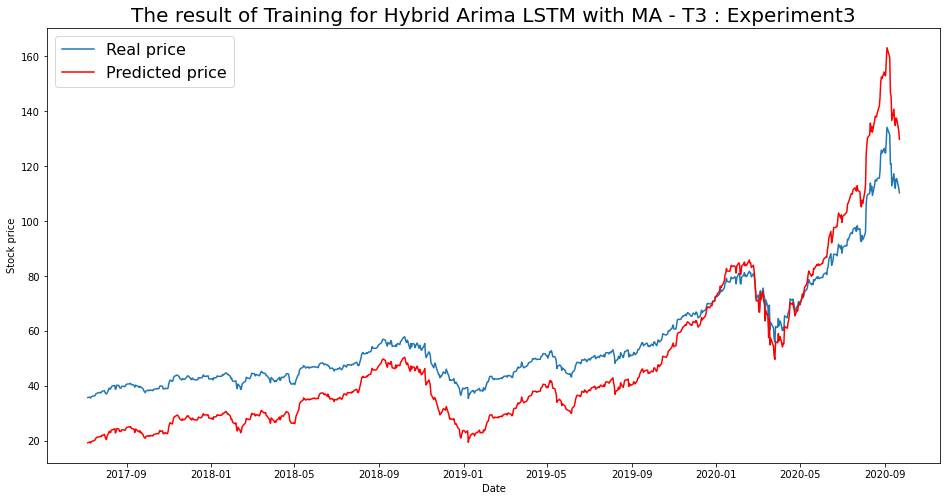

----- Train RMSE for T3 ----- 12.412205084380062
----- Train_MSE_LSTM for T3 ----- 154.06283505671027
----- Train MAE LSTM for T3 ----- 11.289339550955239


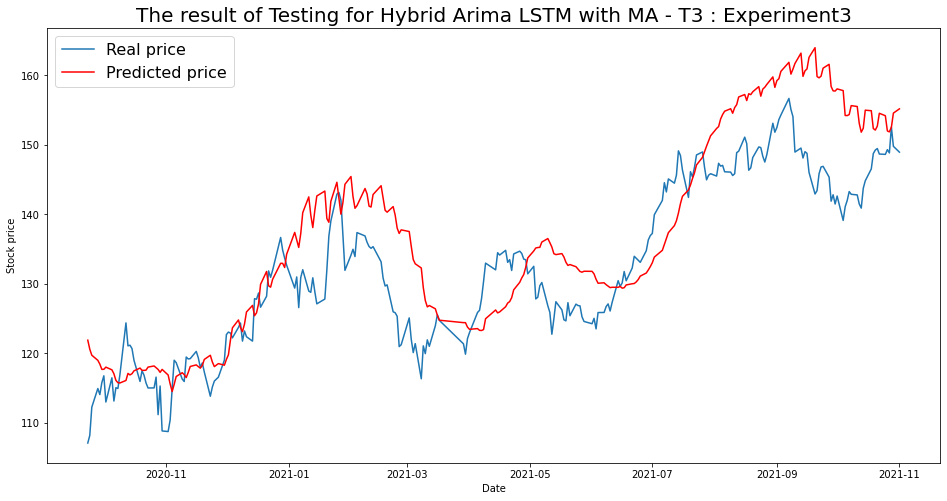

----- Test RMSE for T3----- 7.59985272224492
----- Test_MSE_LSTM for T3----- 57.75776139981352
----- Test_MAE_LSTM for T3----- 6.172107202063374


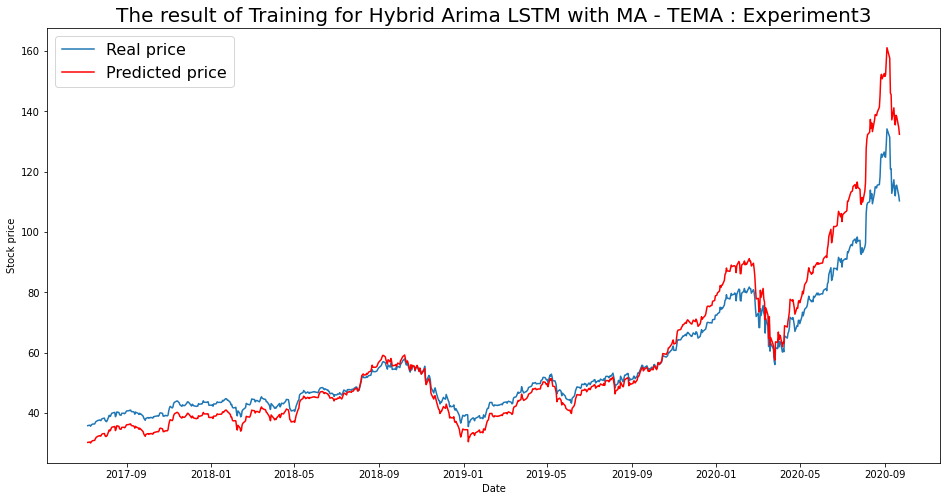

----- Train RMSE for TEMA ----- 7.318337811184663
----- Train_MSE_LSTM for TEMA ----- 53.55806831861513
----- Train MAE LSTM for TEMA ----- 4.992749833584864


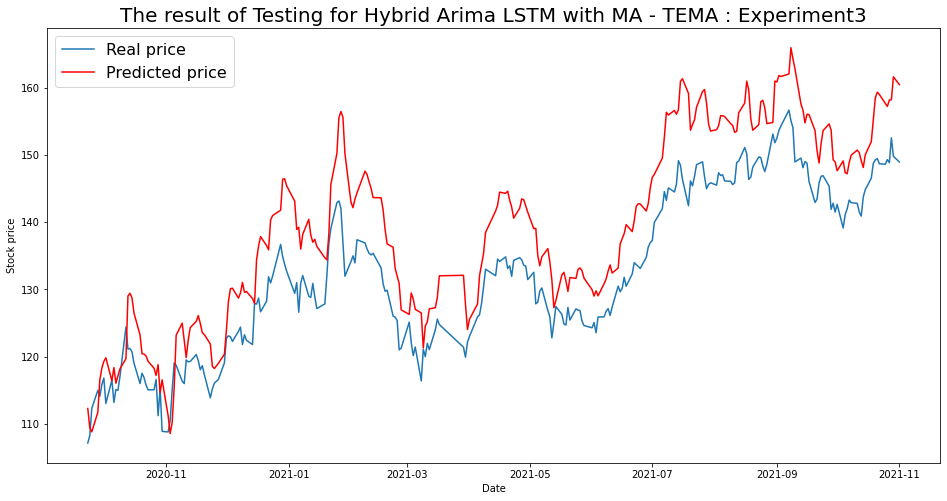

----- Test RMSE for TEMA----- 7.862339454684835
----- Test_MSE_LSTM for TEMA----- 61.81638170069383
----- Test_MAE_LSTM for TEMA----- 7.157520441443416


In [104]:
for i in range(len(list(simulation3.keys()))):
  SIM = list(simulation3.keys())[i]
  plot_train(simulation3,SIM)
  plot_test(simulation3,SIM)

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 4

From  the above experiments it is evident that with Higher moving averages the loss plots show unreoresented data and underfitting, hence keeping only the MA's that have smaller periods like T3 OR TRIMA. Going forward EMA, WMA & DEMA will be ignored.

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # # Option 1
    # # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()




    # # Option 3
    # # define custom activation
    # # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(input_dim, feature_size)))
    model.add(LSTM(units=int(lstm_len/2)))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='mean_squared_error', optimizer='adam')
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM4.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = (y_scaler.inverse_transform(predictiontr)-det).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte =( y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.02 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.15 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.05 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.06 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.56 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.58 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.17 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 2.034 seconds
                               SARIMAX Results                                
Dep.

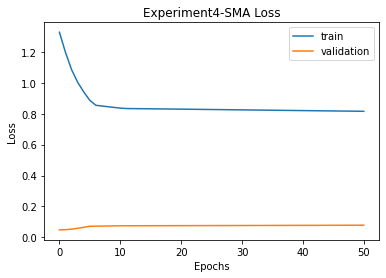


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 22.0961825771905 
RMSE:	 4.700657674963207 
MAPE:	 3.7488296078488137
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.02 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.03 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.05 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.11 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=1.02 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.52 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0.2

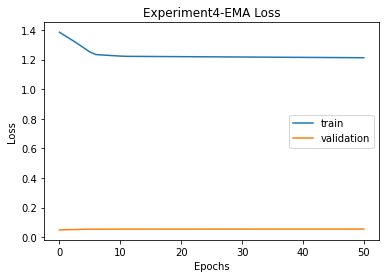


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 22.0961825771905 
RMSE:	 4.700657674963207 
MAPE:	 3.7488296078488137

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.69312385194829 
RMSE:	 6.057484944426053 
MAPE:	 4.755707959713801
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.02 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.05 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.10 sec
 ARIMA(3,3,1)(0,0,0)[0]  

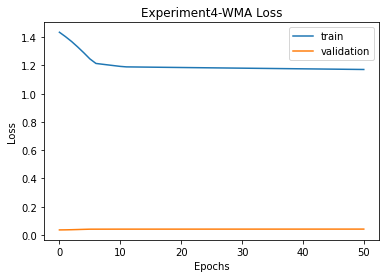


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 22.0961825771905 
RMSE:	 4.700657674963207 
MAPE:	 3.7488296078488137

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.69312385194829 
RMSE:	 6.057484944426053 
MAPE:	 4.755707959713801

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 61.47074835668693 
RMSE:	 7.8403283321992925 
MAPE:	 6.468176158698829
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.02 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=i

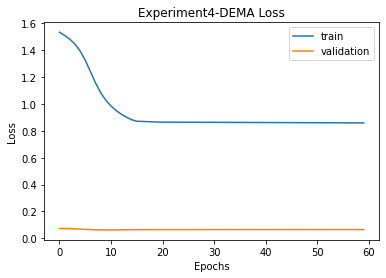


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 22.0961825771905 
RMSE:	 4.700657674963207 
MAPE:	 3.7488296078488137

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.69312385194829 
RMSE:	 6.057484944426053 
MAPE:	 4.755707959713801

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 61.47074835668693 
RMSE:	 7.8403283321992925 
MAPE:	 6.468176158698829

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 114.21230424130383 
RMSE:	 10.687015684525958 
MAPE:	 9.305044543155903
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(0,3,0)

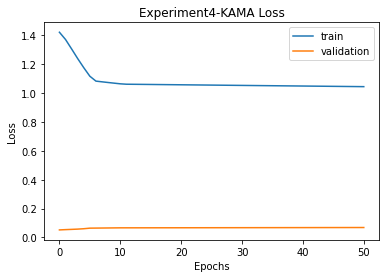


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 22.0961825771905 
RMSE:	 4.700657674963207 
MAPE:	 3.7488296078488137

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.69312385194829 
RMSE:	 6.057484944426053 
MAPE:	 4.755707959713801

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 61.47074835668693 
RMSE:	 7.8403283321992925 
MAPE:	 6.468176158698829

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 114.21230424130383 
RMSE:	 10.687015684525958 
MAPE:	 9.305044543155903

KAMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 21.57120658320832 
RMSE:	 4.6444813040002995 
MAPE:	 3.6837316829247877
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on 

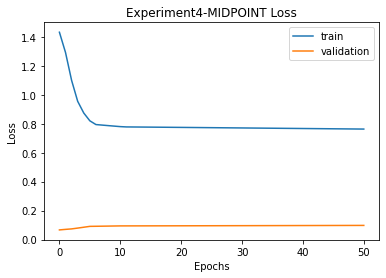


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 22.0961825771905 
RMSE:	 4.700657674963207 
MAPE:	 3.7488296078488137

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.69312385194829 
RMSE:	 6.057484944426053 
MAPE:	 4.755707959713801

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 61.47074835668693 
RMSE:	 7.8403283321992925 
MAPE:	 6.468176158698829

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 114.21230424130383 
RMSE:	 10.687015684525958 
MAPE:	 9.305044543155903

KAMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 21.57120658320832 
RMSE:	 4.6444813040002995 
MAPE:	 3.6837316829247877

MIDPOINT
Prediction vs Close:		50.37% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 17.38125304406819 
RMSE:	 4.169082997982673 
MAPE:	 3.3993243705608664
T3
T3([input_arrays], 

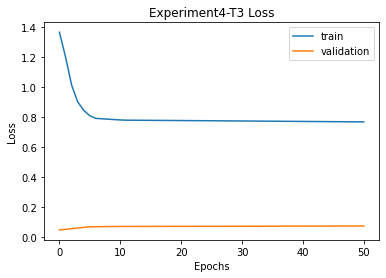


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 22.0961825771905 
RMSE:	 4.700657674963207 
MAPE:	 3.7488296078488137

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.69312385194829 
RMSE:	 6.057484944426053 
MAPE:	 4.755707959713801

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 61.47074835668693 
RMSE:	 7.8403283321992925 
MAPE:	 6.468176158698829

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 114.21230424130383 
RMSE:	 10.687015684525958 
MAPE:	 9.305044543155903

KAMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 21.57120658320832 
RMSE:	 4.6444813040002995 
MAPE:	 3.6837316829247877

MIDPOINT
Prediction vs Close:		50.37% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 17.38125304406819 
RMSE:	 4.169082997982673 
MAPE:	 3.3993243705608664

T3
Prediction vs Clos

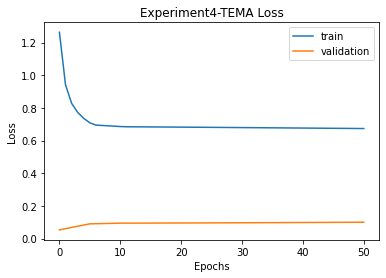


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 22.0961825771905 
RMSE:	 4.700657674963207 
MAPE:	 3.7488296078488137

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.69312385194829 
RMSE:	 6.057484944426053 
MAPE:	 4.755707959713801

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 61.47074835668693 
RMSE:	 7.8403283321992925 
MAPE:	 6.468176158698829

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 114.21230424130383 
RMSE:	 10.687015684525958 
MAPE:	 9.305044543155903

KAMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 21.57120658320832 
RMSE:	 4.6444813040002995 
MAPE:	 3.6837316829247877

MIDPOINT
Prediction vs Close:		50.37% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 17.38125304406819 
RMSE:	 4.169082997982673 
MAPE:	 3.3993243705608664

T3
Prediction vs Clos

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation4 = {}
    imgfile = 'Experiment4'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation4[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation4_data.json', 'w') as fp:
                  json.dump(simulation4, fp)

              for ma in simulation4.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation4[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation4[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation4[ma]['final']['mse'],
                        '\nRMSE:\t', simulation4[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation4[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

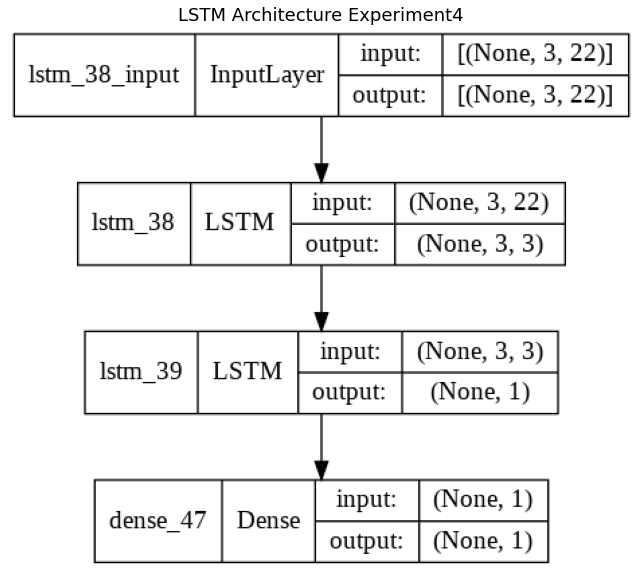

In [ ]:
img = cv2.imread('Experiment4.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [105]:
with open('simulation4_data.json') as json_file:
    simulation4 = json.load(json_file)
fileimg = 'Experiment4'

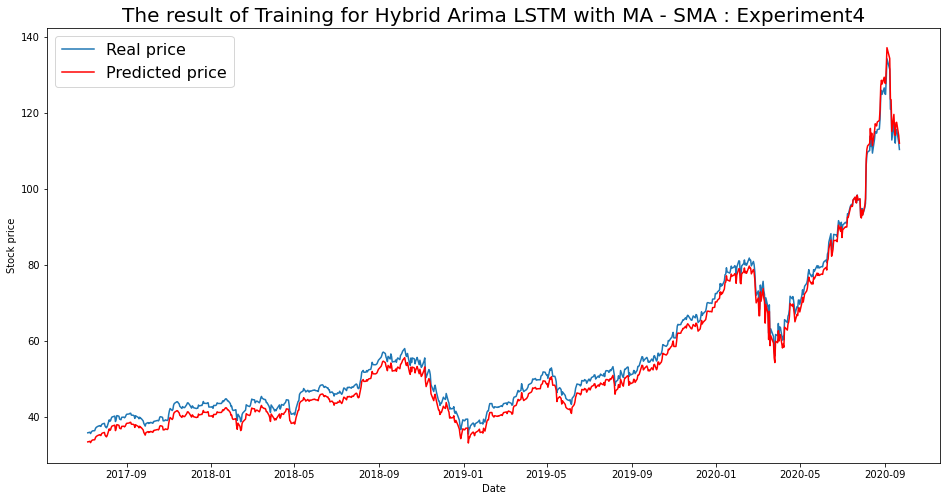

----- Train RMSE for SMA ----- 2.261242280864947
----- Train_MSE_LSTM for SMA ----- 5.113216652771308
----- Train MAE LSTM for SMA ----- 2.2305949702121244


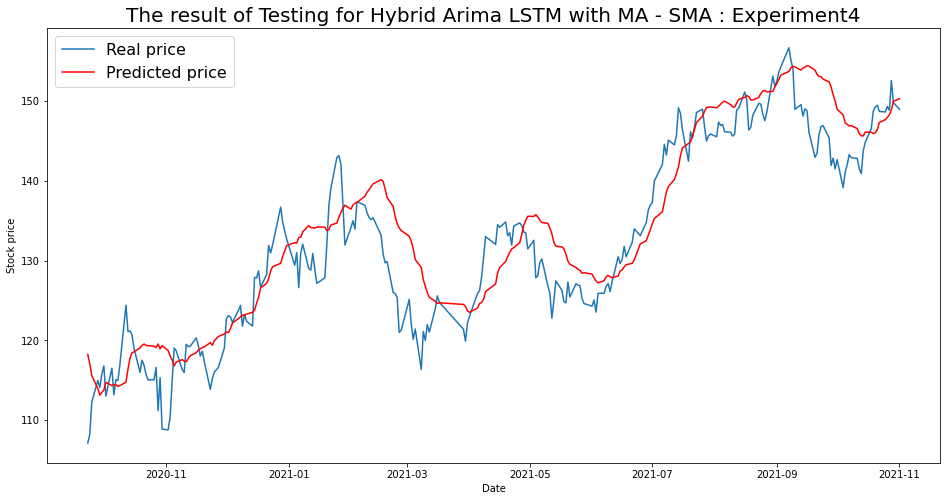

----- Test RMSE for SMA----- 4.700657674963207
----- Test_MSE_LSTM for SMA----- 22.0961825771905
----- Test_MAE_LSTM for SMA----- 3.7488296078488137


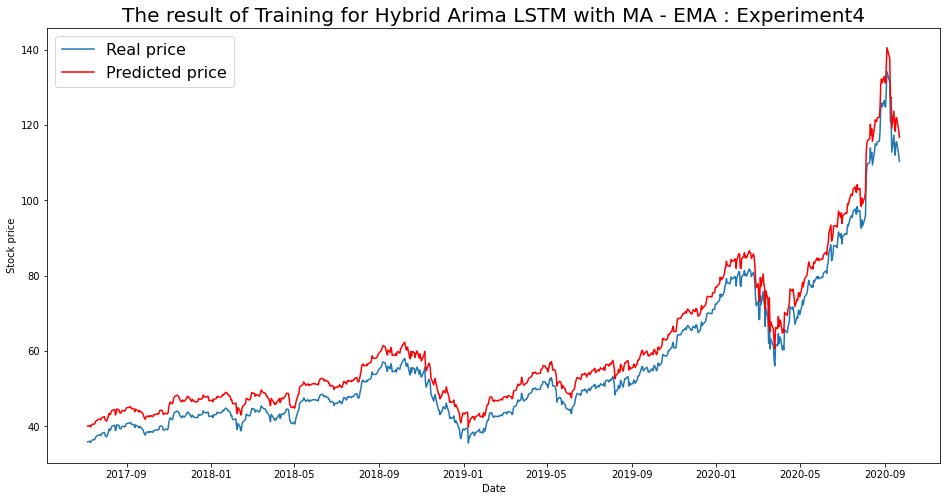

----- Train RMSE for EMA ----- 4.486578445228125
----- Train_MSE_LSTM for EMA ----- 20.12938614518562
----- Train MAE LSTM for EMA ----- 4.457049346206212


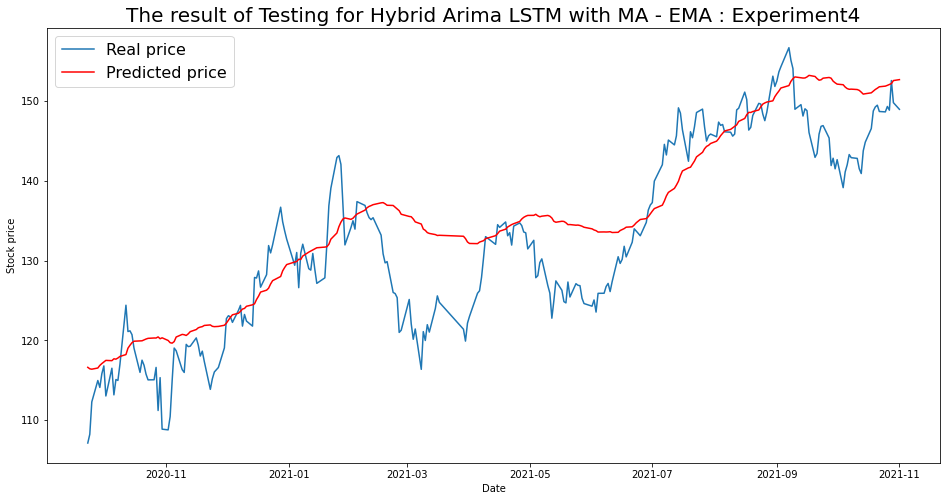

----- Test RMSE for EMA----- 6.057484944426053
----- Test_MSE_LSTM for EMA----- 36.69312385194829
----- Test_MAE_LSTM for EMA----- 4.755707959713801


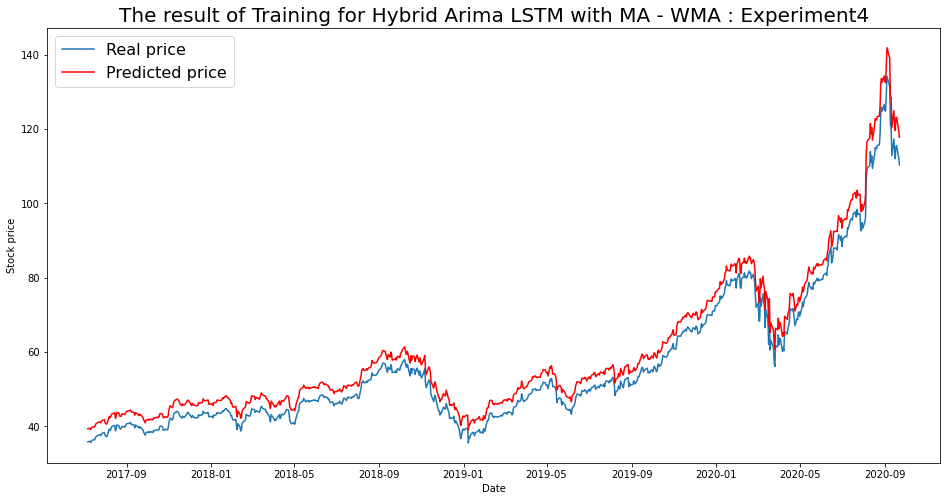

----- Train RMSE for WMA ----- 3.9111937815761815
----- Train_MSE_LSTM for WMA ----- 15.29743679704019
----- Train MAE LSTM for WMA ----- 3.8069788630646055


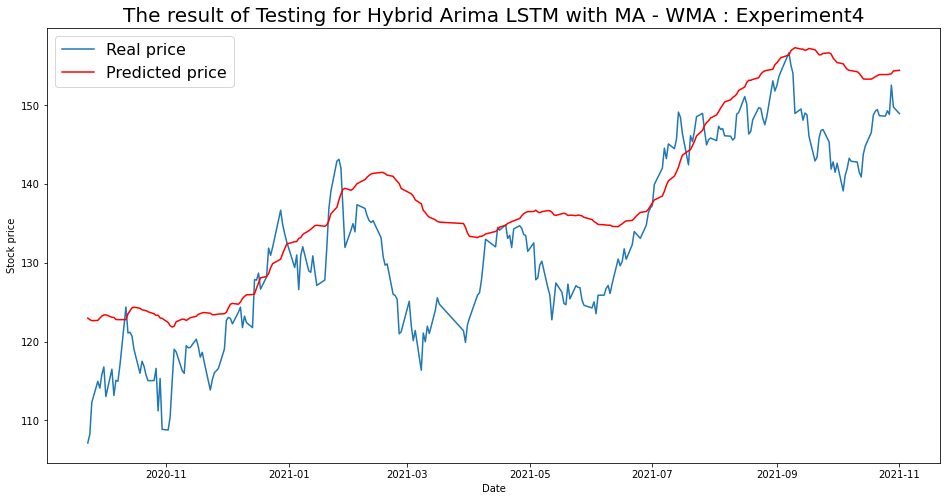

----- Test RMSE for WMA----- 7.8403283321992925
----- Test_MSE_LSTM for WMA----- 61.47074835668693
----- Test_MAE_LSTM for WMA----- 6.468176158698829


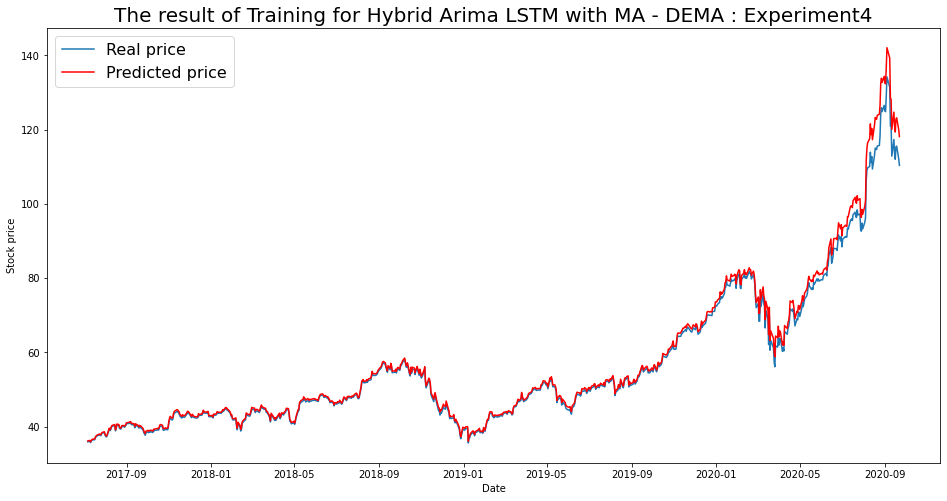

----- Train RMSE for DEMA ----- 1.8914967024294371
----- Train_MSE_LSTM for DEMA ----- 3.577759775301435
----- Train MAE LSTM for DEMA ----- 1.0511807545576946


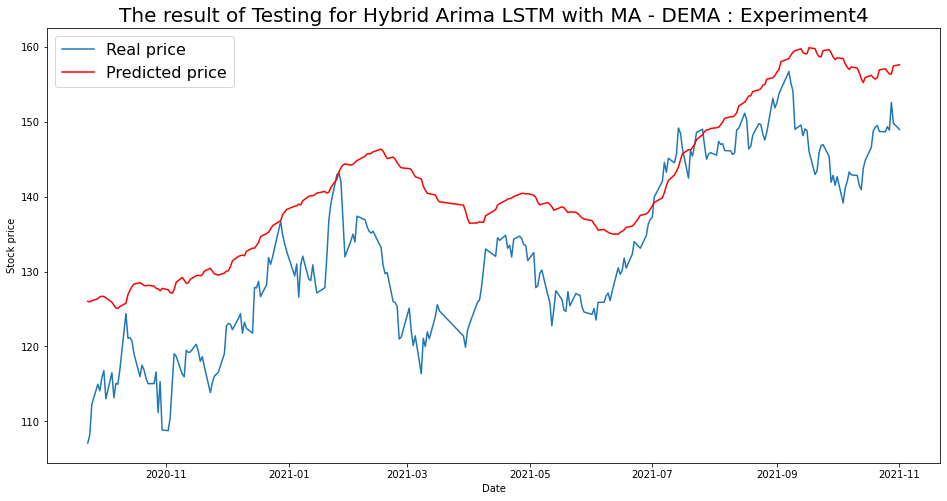

----- Test RMSE for DEMA----- 10.687015684525958
----- Test_MSE_LSTM for DEMA----- 114.21230424130383
----- Test_MAE_LSTM for DEMA----- 9.305044543155903


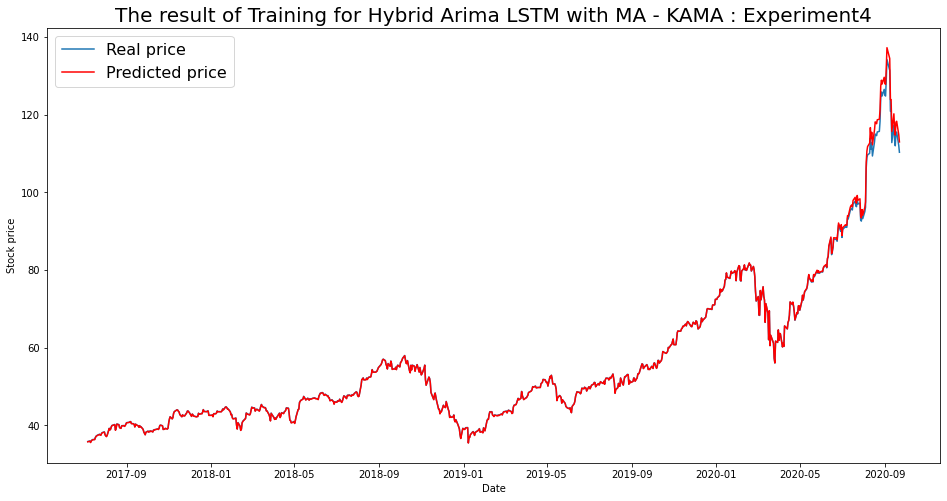

----- Train RMSE for KAMA ----- 0.6095271658293977
----- Train_MSE_LSTM for KAMA ----- 0.37152336588401813
----- Train MAE LSTM for KAMA ----- 0.1940257596497488


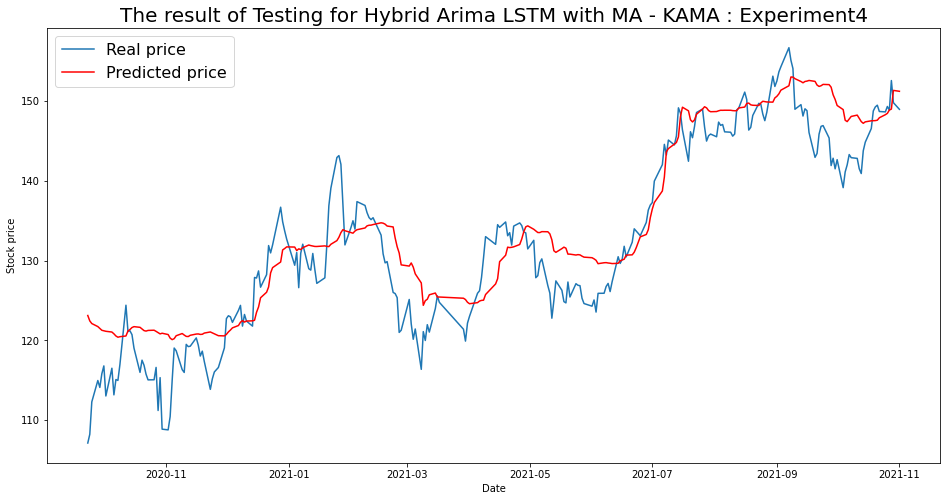

----- Test RMSE for KAMA----- 4.6444813040002995
----- Test_MSE_LSTM for KAMA----- 21.57120658320832
----- Test_MAE_LSTM for KAMA----- 3.6837316829247877


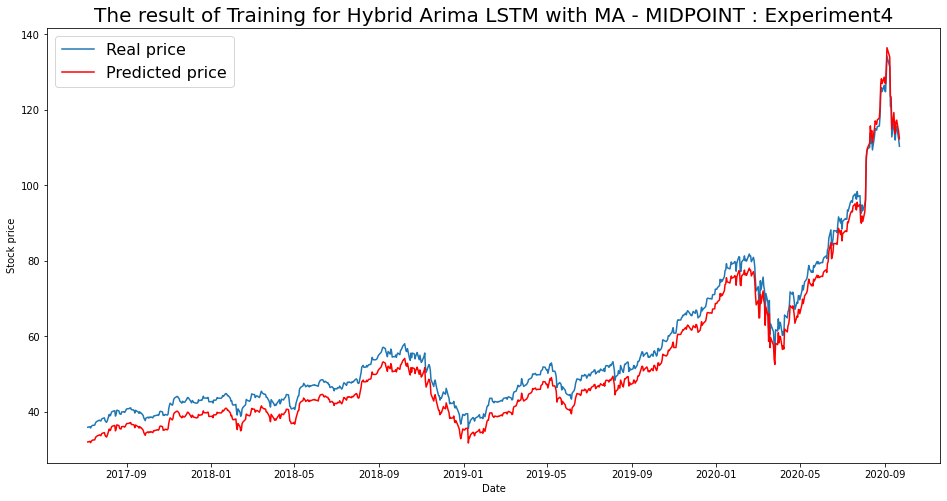

----- Train RMSE for MIDPOINT ----- 3.7511147201647144
----- Train_MSE_LSTM for MIDPOINT ----- 14.070861643836402
----- Train MAE LSTM for MIDPOINT ----- 3.721844446541059


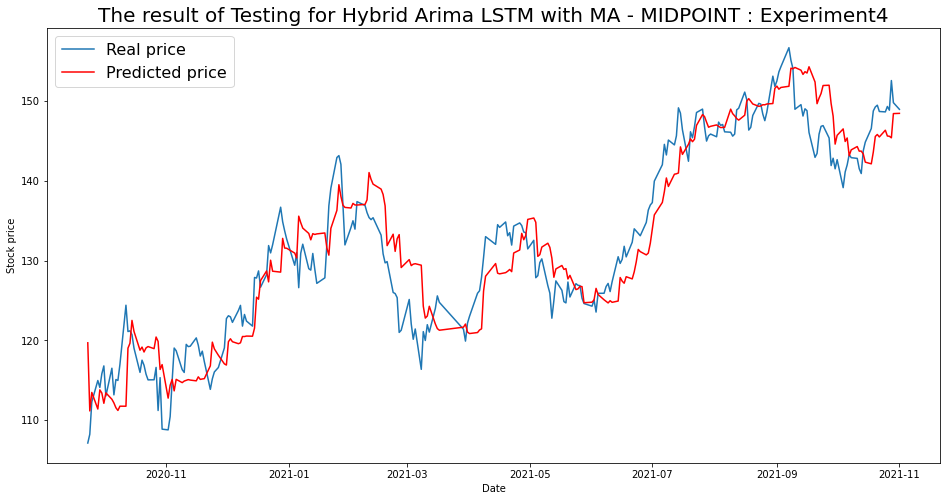

----- Test RMSE for MIDPOINT----- 4.169082997982673
----- Test_MSE_LSTM for MIDPOINT----- 17.38125304406819
----- Test_MAE_LSTM for MIDPOINT----- 3.3993243705608664


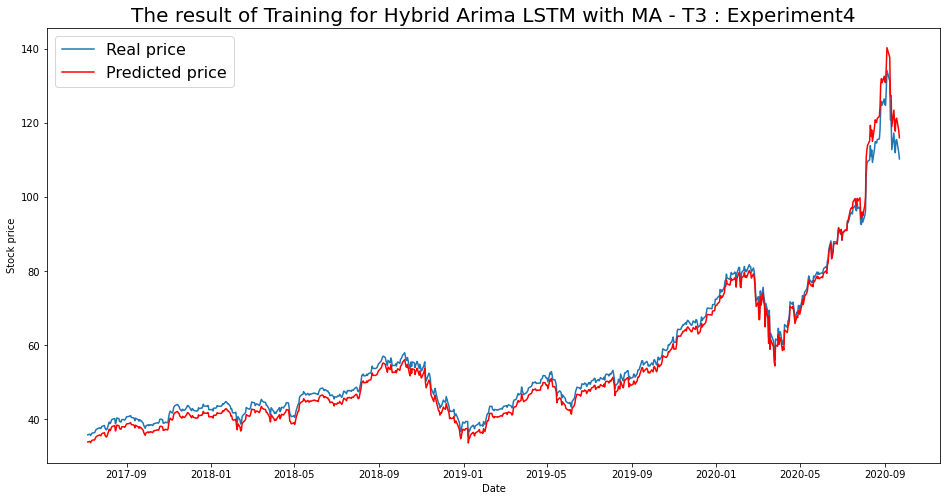

----- Train RMSE for T3 ----- 2.13408676739365
----- Train_MSE_LSTM for T3 ----- 4.5543263307646775
----- Train MAE LSTM for T3 ----- 1.9476125499989727


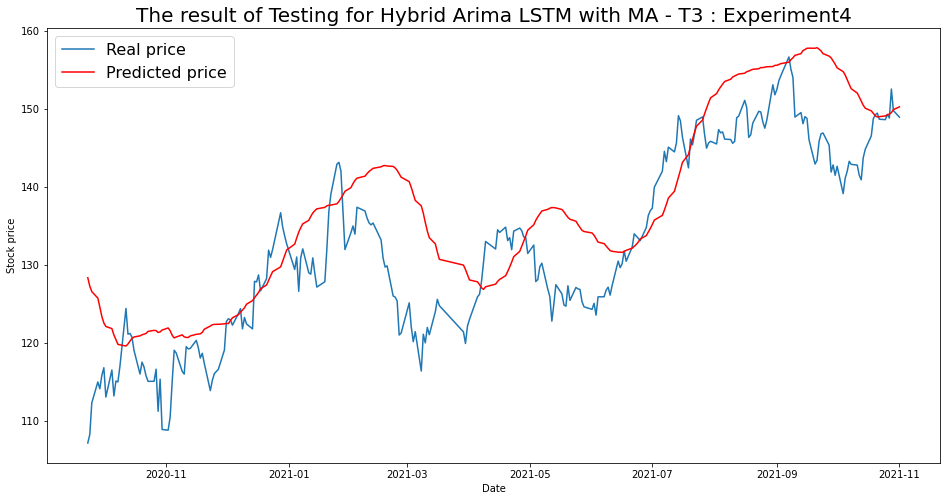

----- Test RMSE for T3----- 7.766718351029661
----- Test_MSE_LSTM for T3----- 60.321913944220896
----- Test_MAE_LSTM for T3----- 6.200911576902634


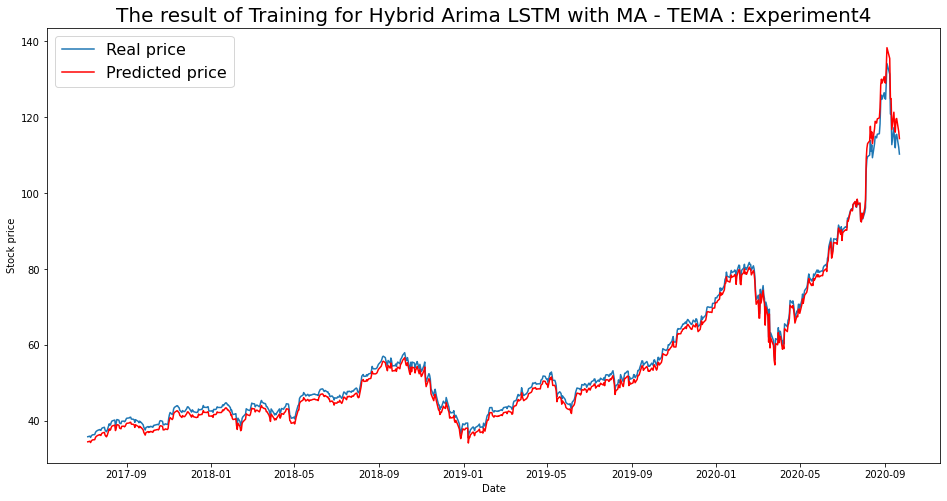

----- Train RMSE for TEMA ----- 1.5059206544231611
----- Train_MSE_LSTM for TEMA ----- 2.267797017418282
----- Train MAE LSTM for TEMA ----- 1.3943178417659041


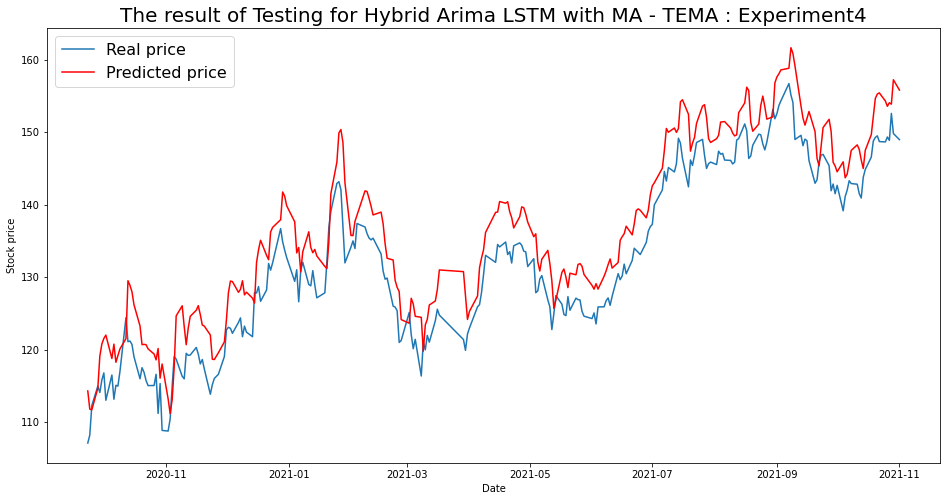

----- Test RMSE for TEMA----- 5.075528057513511
----- Test_MSE_LSTM for TEMA----- 25.760985062606874
----- Test_MAE_LSTM for TEMA----- 4.549137795705406


In [106]:
for i in range(len(list(simulation4.keys()))):
  SIM = list(simulation4.keys())[i]
  plot_train(simulation4,SIM)
  plot_test(simulation4,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 5

In [ ]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    model.add(Dense(units=64,activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    ## Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM5.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(input_dim, feature_size)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM5.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-14771.778, Time=16.11 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14135.387, Time=7.78 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15280.870, Time=12.96 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-15393.475, Time=10.89 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-14981.217, Time=5.56 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-14516.868, Time=17.01 sec
 ARIMA(0,3,1)(0,0,0)[0] intercept   : AIC=-15663.967, Time=12.26 sec
 ARIMA(0,3,0)(0,0,0)[0] intercept   : AIC=-13838.679, Time=6.48 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=-14734.479, Time=7.67 sec
 ARIMA(0,3,2)(0,0,0)[0] intercept   : AIC=-14866.409, Time=9.36 sec
 ARIMA(1,3,0)(0,0,0)[0] intercept   : AIC=-16157.

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.02955, saving model to LSTM5.h5
48/48 - 2s - loss: 0.2408 - val_loss: 0.0295 - lr: 0.0010 - 2s/epoch - 46ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.02955
48/48 - 1s - loss: 0.0824 - val_loss: 0.0477 - lr: 0.0010 - 505ms/epoch - 11ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.02955
48/48 - 1s - loss: 0.0504 - val_loss: 0.4546 - lr: 0.0010 - 527ms/epoch - 11ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.02955
48/48 - 0s - loss: 0.0515 - val_loss: 0.0322 - lr: 0.0010 - 497ms/epoch - 10ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.02955
48/48 - 1s - loss: 0.0495 - val_loss: 0.3863 - lr: 0.0010 - 521ms/epoch - 11ms/step
Epoch 6/500

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 00006: val_loss did not improve from 0.02955
48/48 - 0s - loss: 0.0330 - val_loss: 0.1281 - lr: 0.0010 - 470ms/epoch - 10ms/step
Epoch 7

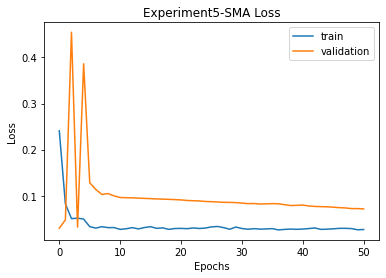


SMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 36.387272258848725 
RMSE:	 6.032186358100081 
MAPE:	 4.990569235256131
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17003.831, Time=3.16 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14572.593, Time=5.45 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16288.946, Time=9.11 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14570.593, Time=7.78 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16226.419, Time=14.02 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-13742.844, Time=10.40 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-16101.256, Time=25.43 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-17006.489, Time=3.19 sec
 ARIMA(3,3,0)(0,0,0)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17002.132, Time=4.87 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-17004.011, Time=4.58 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 121.313 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8570.327
Date:                Sun, 12 Dec 2021   AIC                         -17086.654
Time:                        14:28:05   BIC                         -16960.001
Sample:                             0   HQIC                        -17038.014
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.16777, saving model to LSTM5.h5
16/16 - 2s - loss: 0.2985 - val_loss: 0.1678 - lr: 0.0010 - 2s/epoch - 127ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.16777
16/16 - 0s - loss: 0.1674 - val_loss: 0.5109 - lr: 0.0010 - 194ms/epoch - 12ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.16777
16/16 - 0s - loss: 0.0656 - val_loss: 0.2042 - lr: 0.0010 - 193ms/epoch - 12ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.16777 to 0.02118, saving model to LSTM5.h5
16/16 - 0s - loss: 0.0593 - val_loss: 0.0212 - lr: 0.0010 - 244ms/epoch - 15ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.02118 to 0.00970, saving model to LSTM5.h5
16/16 - 0s - loss: 0.0429 - val_loss: 0.0097 - lr: 0.0010 - 244ms/epoch - 15ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.00970
16/16 - 0s - loss: 0.0431 - val_loss: 0.0181 - lr: 0.0010 - 199ms/epoch - 12ms/step
Epoch 7/500

Epoch 00007: va

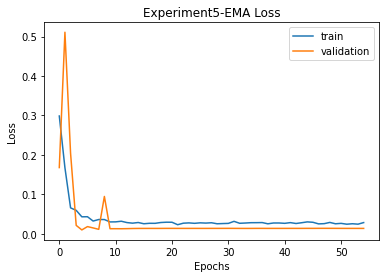


SMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 36.387272258848725 
RMSE:	 6.032186358100081 
MAPE:	 4.990569235256131

EMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 72.47565418845511 
RMSE:	 8.513263427643661 
MAPE:	 6.94585827976211
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16080.357, Time=14.46 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14973.799, Time=7.59 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15549.629, Time=2.20 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-15317.999, Time=10.66 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16061.924, Time=11.81 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15376.406, Time=18.25 se

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.13812, saving model to LSTM5.h5
17/17 - 2s - loss: 0.5416 - val_loss: 0.1381 - lr: 0.0010 - 2s/epoch - 115ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.13812
17/17 - 0s - loss: 0.2008 - val_loss: 0.5647 - lr: 0.0010 - 187ms/epoch - 11ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.13812
17/17 - 0s - loss: 0.0776 - val_loss: 0.5295 - lr: 0.0010 - 193ms/epoch - 11ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.13812
17/17 - 0s - loss: 0.0543 - val_loss: 0.4118 - lr: 0.0010 - 196ms/epoch - 12ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.13812
17/17 - 0s - loss: 0.0476 - val_loss: 0.1807 - lr: 0.0010 - 192ms/epoch - 11ms/step
Epoch 6/500

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 00006: val_loss did not improve from 0.13812
17/17 - 0s - loss: 0.0469 - val_loss: 0.1467 - lr: 0.0010 - 208ms/epoch - 12ms/step
Epoch 

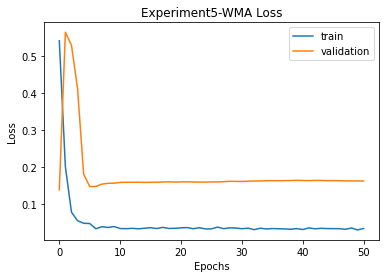


SMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 36.387272258848725 
RMSE:	 6.032186358100081 
MAPE:	 4.990569235256131

EMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 72.47565418845511 
RMSE:	 8.513263427643661 
MAPE:	 6.94585827976211

WMA
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 29.73090246364654 
RMSE:	 5.452605107987057 
MAPE:	 4.390044818690696
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17003.780, Time=3.04 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14572.593, Time=5.38 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15584.877, Time=10.31 sec
 ARIMA(0,3,1)(0,0,0)[0]        

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17001.997, Time=4.47 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16996.668, Time=4.81 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 118.849 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.723
Date:                Sun, 12 Dec 2021   AIC                         -17085.445
Time:                        14:45:55   BIC                         -16958.792
Sample:                             0   HQIC                        -17036.805
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.24371, saving model to LSTM5.h5
10/10 - 2s - loss: 1.3415 - val_loss: 0.2437 - lr: 0.0010 - 2s/epoch - 200ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.24371 to 0.11420, saving model to LSTM5.h5
10/10 - 0s - loss: 0.4349 - val_loss: 0.1142 - lr: 0.0010 - 148ms/epoch - 15ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.11420
10/10 - 0s - loss: 0.2272 - val_loss: 0.3306 - lr: 0.0010 - 123ms/epoch - 12ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.11420
10/10 - 0s - loss: 0.0828 - val_loss: 0.5140 - lr: 0.0010 - 127ms/epoch - 13ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.11420
10/10 - 0s - loss: 0.0789 - val_loss: 0.3226 - lr: 0.0010 - 130ms/epoch - 13ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.11420
10/10 - 0s - loss: 0.0541 - val_loss: 0.2154 - lr: 0.0010 - 132ms/epoch - 13ms/step
Epoch 7/500

Epoch 00007: ReduceLROnPlateau reducing learn

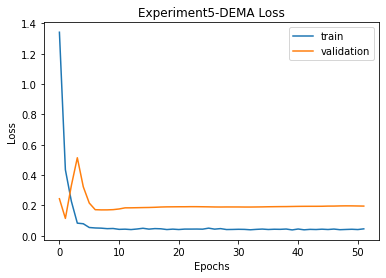


SMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 36.387272258848725 
RMSE:	 6.032186358100081 
MAPE:	 4.990569235256131

EMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 72.47565418845511 
RMSE:	 8.513263427643661 
MAPE:	 6.94585827976211

WMA
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 29.73090246364654 
RMSE:	 5.452605107987057 
MAPE:	 4.390044818690696

DEMA
Prediction vs Close:		50.37% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 39.142904723518775 
RMSE:	 6.256429071244936 
MAPE:	 4.920393911559133
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17059.325, Time=4.84 sec
 ARIMA(

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17000.917, Time=4.91 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=45.027, Time=6.75 sec

Best model:  ARIMA(1,3,1)(0,0,0)[0]          
Total fit time: 79.127 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(1, 3, 1)   Log Likelihood                8554.662
Date:                Sun, 12 Dec 2021   AIC                         -17059.325
Time:                        14:57:02   BIC                         -16942.054
Sample:                             0   HQIC                        -17014.288
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.28966, saving model to LSTM5.h5
45/45 - 2s - loss: 0.1649 - val_loss: 0.2897 - lr: 0.0010 - 2s/epoch - 52ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.28966 to 0.03060, saving model to LSTM5.h5
45/45 - 1s - loss: 0.0926 - val_loss: 0.0306 - lr: 0.0010 - 512ms/epoch - 11ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.03060
45/45 - 0s - loss: 0.0650 - val_loss: 0.5811 - lr: 0.0010 - 478ms/epoch - 11ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.03060
45/45 - 1s - loss: 0.0371 - val_loss: 0.1709 - lr: 0.0010 - 506ms/epoch - 11ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.03060
45/45 - 0s - loss: 0.0399 - val_loss: 0.0468 - lr: 0.0010 - 481ms/epoch - 11ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.03060
45/45 - 0s - loss: 0.0357 - val_loss: 0.4813 - lr: 0.0010 - 474ms/epoch - 11ms/step
Epoch 7/500

Epoch 00007: ReduceLROnPlateau reducing learni

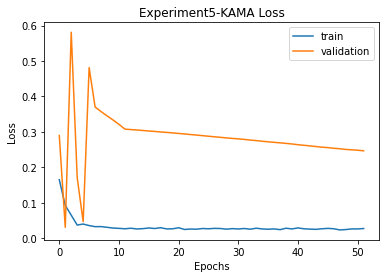


SMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 36.387272258848725 
RMSE:	 6.032186358100081 
MAPE:	 4.990569235256131

EMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 72.47565418845511 
RMSE:	 8.513263427643661 
MAPE:	 6.94585827976211

WMA
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 29.73090246364654 
RMSE:	 5.452605107987057 
MAPE:	 4.390044818690696

DEMA
Prediction vs Close:		50.37% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 39.142904723518775 
RMSE:	 6.256429071244936 
MAPE:	 4.920393911559133

KAMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 52.56428057408519 
RMSE:	 7.25012279717283 
MAPE:	 6.170488218753182
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MIDP

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.01891, saving model to LSTM5.h5
58/58 - 3s - loss: 0.2885 - val_loss: 0.0189 - lr: 0.0010 - 3s/epoch - 44ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.01891
58/58 - 1s - loss: 0.1129 - val_loss: 0.0733 - lr: 0.0010 - 622ms/epoch - 11ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.01891
58/58 - 1s - loss: 0.0862 - val_loss: 0.1839 - lr: 0.0010 - 610ms/epoch - 11ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.01891
58/58 - 1s - loss: 0.0526 - val_loss: 0.0454 - lr: 0.0010 - 637ms/epoch - 11ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.01891
58/58 - 1s - loss: 0.0452 - val_loss: 0.4101 - lr: 0.0010 - 627ms/epoch - 11ms/step
Epoch 6/500

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 00006: val_loss did not improve from 0.01891
58/58 - 1s - loss: 0.0457 - val_loss: 0.0734 - lr: 0.0010 - 614ms/epoch - 11ms/step
Epoch 7

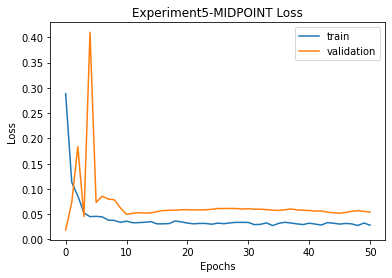


SMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 36.387272258848725 
RMSE:	 6.032186358100081 
MAPE:	 4.990569235256131

EMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 72.47565418845511 
RMSE:	 8.513263427643661 
MAPE:	 6.94585827976211

WMA
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 29.73090246364654 
RMSE:	 5.452605107987057 
MAPE:	 4.390044818690696

DEMA
Prediction vs Close:		50.37% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 39.142904723518775 
RMSE:	 6.256429071244936 
MAPE:	 4.920393911559133

KAMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 52.56428057408519 
RMSE:	 7.25012279717283 
MAPE:	 6.170488218753182

MIDPOINT
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 44.21016710593271 
RMSE:	 6.649072650071791 
MAPE:	 5.476790088019583
T3
T3([input_arrays], [timep

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16924.758, Time=4.73 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=-16952.347, Time=3.32 sec

Best model:  ARIMA(1,3,1)(0,0,0)[0]          
Total fit time: 76.633 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(1, 3, 1)   Log Likelihood                8502.173
Date:                Sun, 12 Dec 2021   AIC                         -16954.347
Time:                        15:06:52   BIC                         -16837.076
Sample:                             0   HQIC                        -16909.310
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.03368, saving model to LSTM5.h5
43/43 - 3s - loss: 0.4064 - val_loss: 0.0337 - lr: 0.0010 - 3s/epoch - 65ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.03368
43/43 - 1s - loss: 0.1522 - val_loss: 0.3929 - lr: 0.0010 - 523ms/epoch - 12ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.03368
43/43 - 0s - loss: 0.0562 - val_loss: 0.4695 - lr: 0.0010 - 500ms/epoch - 12ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.03368
43/43 - 1s - loss: 0.0455 - val_loss: 0.0957 - lr: 0.0010 - 504ms/epoch - 12ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.03368 to 0.01773, saving model to LSTM5.h5
43/43 - 0s - loss: 0.0346 - val_loss: 0.0177 - lr: 0.0010 - 494ms/epoch - 11ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.01773
43/43 - 0s - loss: 0.0339 - val_loss: 0.1766 - lr: 0.0010 - 473ms/epoch - 11ms/step
Epoch 7/500

Epoch 00007: val_loss did not improve from 0.0

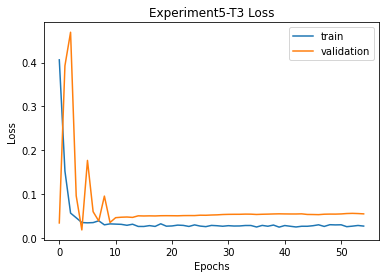


SMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 36.387272258848725 
RMSE:	 6.032186358100081 
MAPE:	 4.990569235256131

EMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 72.47565418845511 
RMSE:	 8.513263427643661 
MAPE:	 6.94585827976211

WMA
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 29.73090246364654 
RMSE:	 5.452605107987057 
MAPE:	 4.390044818690696

DEMA
Prediction vs Close:		50.37% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 39.142904723518775 
RMSE:	 6.256429071244936 
MAPE:	 4.920393911559133

KAMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 52.56428057408519 
RMSE:	 7.25012279717283 
MAPE:	 6.170488218753182

MIDPOINT
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 44.21016710593271 
RMSE:	 6.649072650071791 
MAPE:	 5.476790088019583

T3
Prediction vs Close:		54

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.07083, saving model to LSTM5.h5
90/90 - 3s - loss: 0.1074 - val_loss: 0.0708 - lr: 0.0010 - 3s/epoch - 32ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.07083
90/90 - 1s - loss: 0.0851 - val_loss: 0.2284 - lr: 0.0010 - 938ms/epoch - 10ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.07083
90/90 - 1s - loss: 0.0725 - val_loss: 1.2299 - lr: 0.0010 - 975ms/epoch - 11ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.07083
90/90 - 1s - loss: 0.0495 - val_loss: 0.5107 - lr: 0.0010 - 969ms/epoch - 11ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.07083
90/90 - 1s - loss: 0.0374 - val_loss: 0.2034 - lr: 0.0010 - 922ms/epoch - 10ms/step
Epoch 6/500

Epoch 00006: val_loss improved from 0.07083 to 0.02678, saving model to LSTM5.h5
90/90 - 1s - loss: 0.0358 - val_loss: 0.0268 - lr: 0.0010 - 968ms/epoch - 11ms/step
Epoch 7/500

Epoch 00007: val_loss did not improve from 0.0

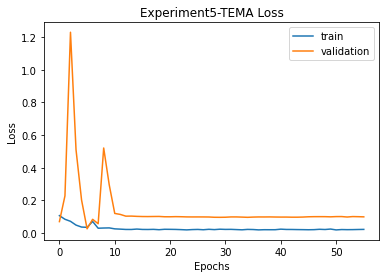


SMA
Prediction vs Close:		49.63% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 36.387272258848725 
RMSE:	 6.032186358100081 
MAPE:	 4.990569235256131

EMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 72.47565418845511 
RMSE:	 8.513263427643661 
MAPE:	 6.94585827976211

WMA
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 29.73090246364654 
RMSE:	 5.452605107987057 
MAPE:	 4.390044818690696

DEMA
Prediction vs Close:		50.37% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 39.142904723518775 
RMSE:	 6.256429071244936 
MAPE:	 4.920393911559133

KAMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 52.56428057408519 
RMSE:	 7.25012279717283 
MAPE:	 6.170488218753182

MIDPOINT
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 44.21016710593271 
RMSE:	 6.649072650071791 
MAPE:	 5.476790088019583

T3
Prediction vs Close:		54

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation5 = {}
    imgfile = 'Experiment5'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation5[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation5_data.json', 'w') as fp:
                    json.dump(simulation5, fp)

                for ma in simulation5.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation5[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation5[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation5[ma]['final']['mse'],
                          '\nRMSE:\t', simulation5[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation5[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

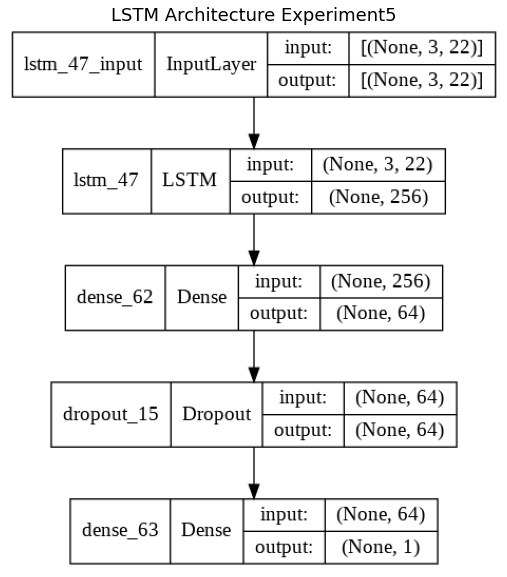

In [ ]:
img = cv2.imread('Experiment5.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [107]:
with open('simulation5_data.json') as json_file:
    simulation5 = json.load(json_file)
fileimg = 'Experiment5'

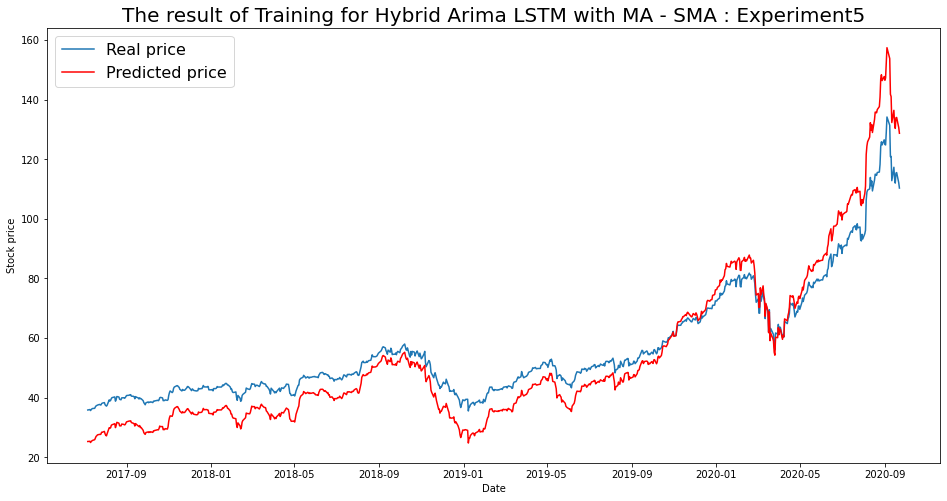

----- Train RMSE for SMA ----- 7.896795928299453
----- Train_MSE_LSTM for SMA ----- 62.35938593320682
----- Train MAE LSTM for SMA ----- 6.857639569537322


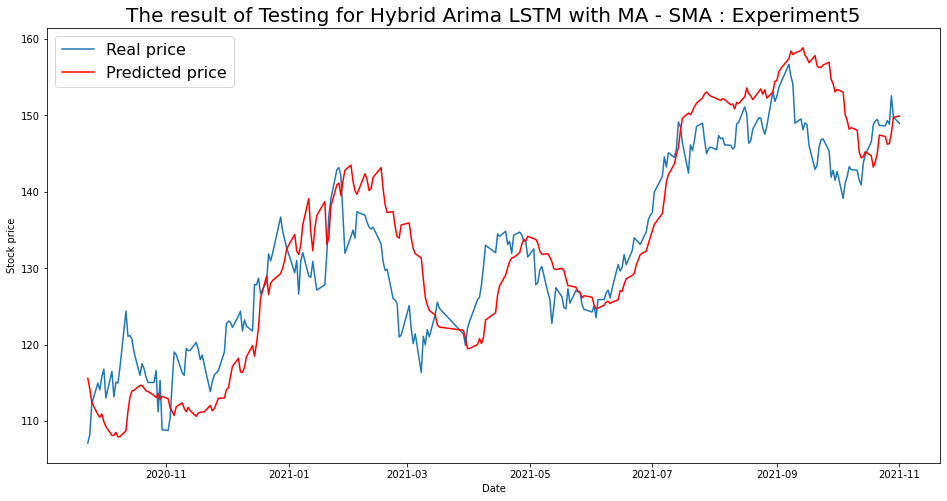

----- Test RMSE for SMA----- 6.032186358100081
----- Test_MSE_LSTM for SMA----- 36.387272258848725
----- Test_MAE_LSTM for SMA----- 4.990569235256131


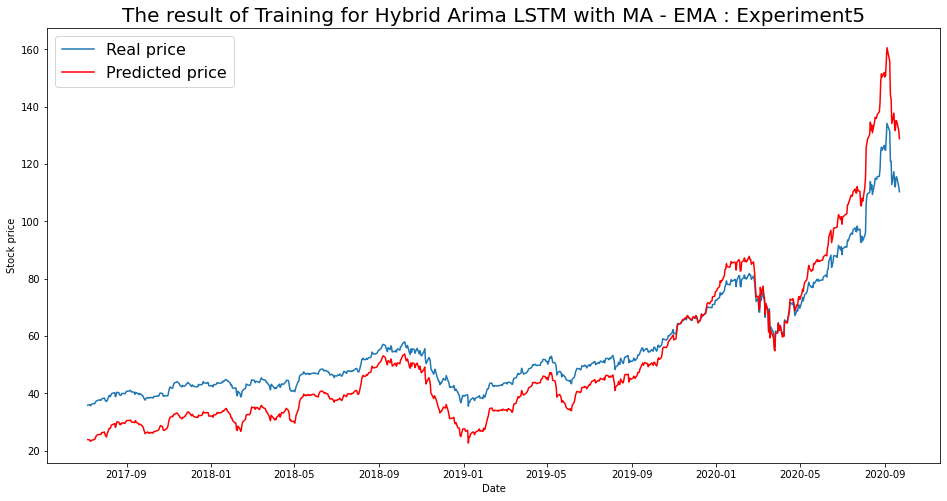

----- Train RMSE for EMA ----- 9.362436614173118
----- Train_MSE_LSTM for EMA ----- 87.65521935440941
----- Train MAE LSTM for EMA ----- 8.20909698434303


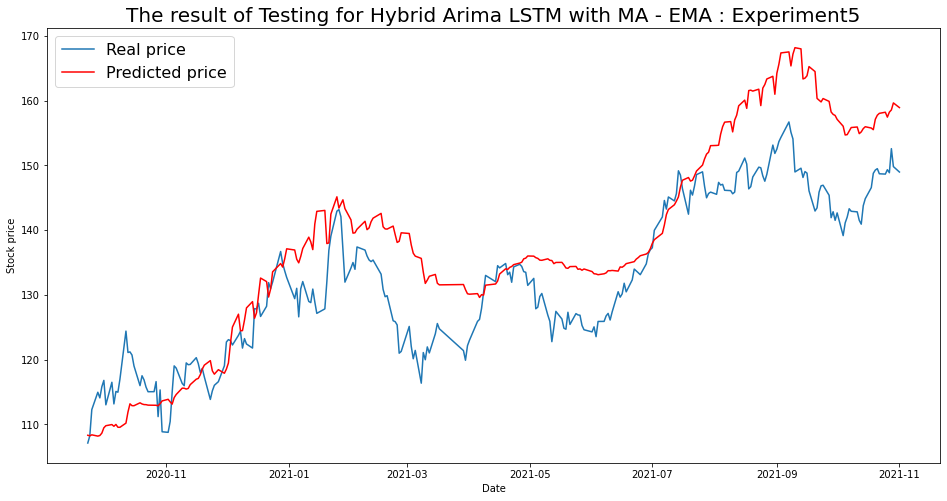

----- Test RMSE for EMA----- 8.513263427643661
----- Test_MSE_LSTM for EMA----- 72.47565418845511
----- Test_MAE_LSTM for EMA----- 6.94585827976211


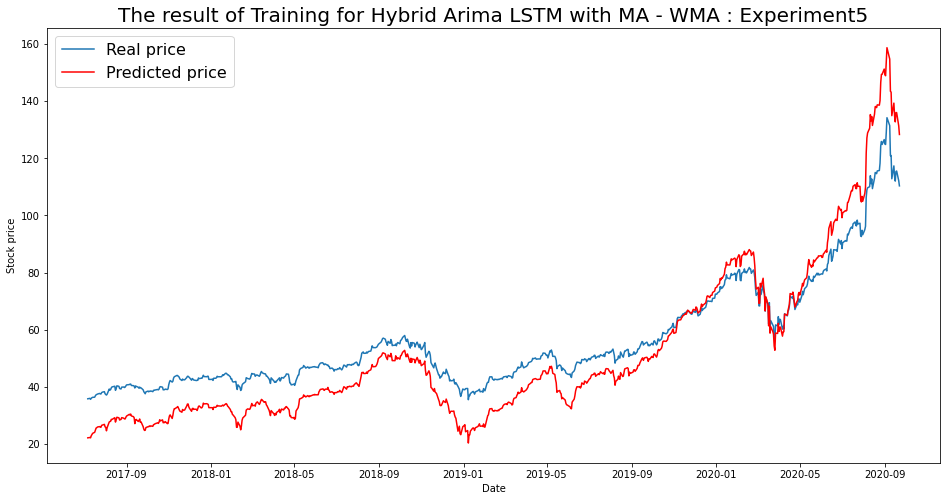

----- Train RMSE for WMA ----- 9.66038426972872
----- Train_MSE_LSTM for WMA ----- 93.3230242388221
----- Train MAE LSTM for WMA ----- 8.543432257543918


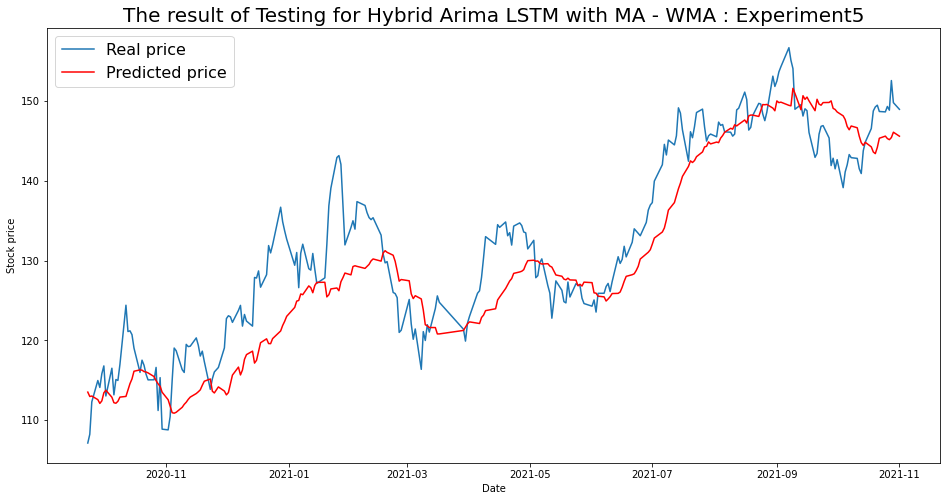

----- Test RMSE for WMA----- 5.452605107987057
----- Test_MSE_LSTM for WMA----- 29.73090246364654
----- Test_MAE_LSTM for WMA----- 4.390044818690696


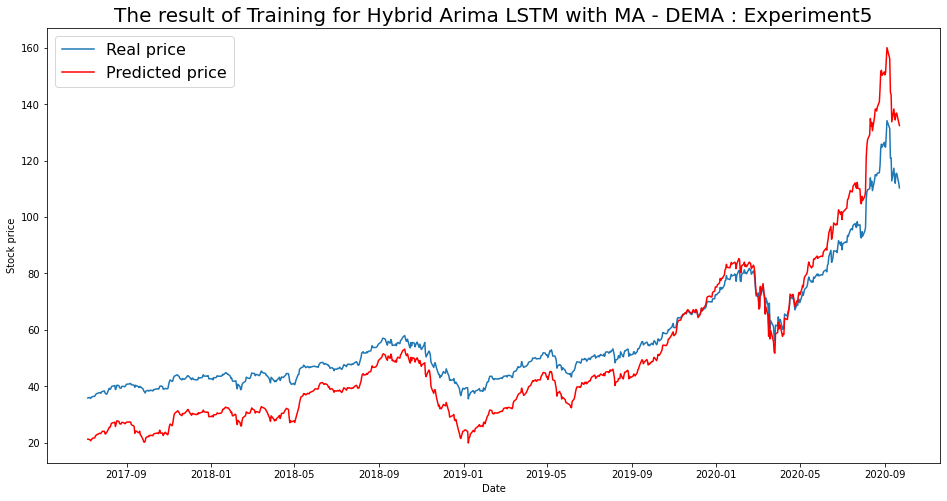

----- Train RMSE for DEMA ----- 10.778650785623652
----- Train_MSE_LSTM for DEMA ----- 116.17931275842537
----- Train MAE LSTM for DEMA ----- 9.483069223000225


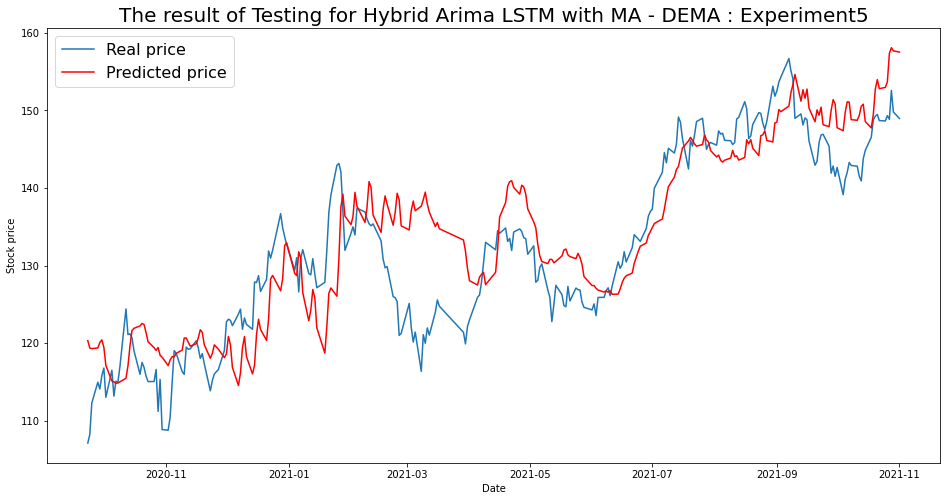

----- Test RMSE for DEMA----- 6.256429071244936
----- Test_MSE_LSTM for DEMA----- 39.142904723518775
----- Test_MAE_LSTM for DEMA----- 4.920393911559133


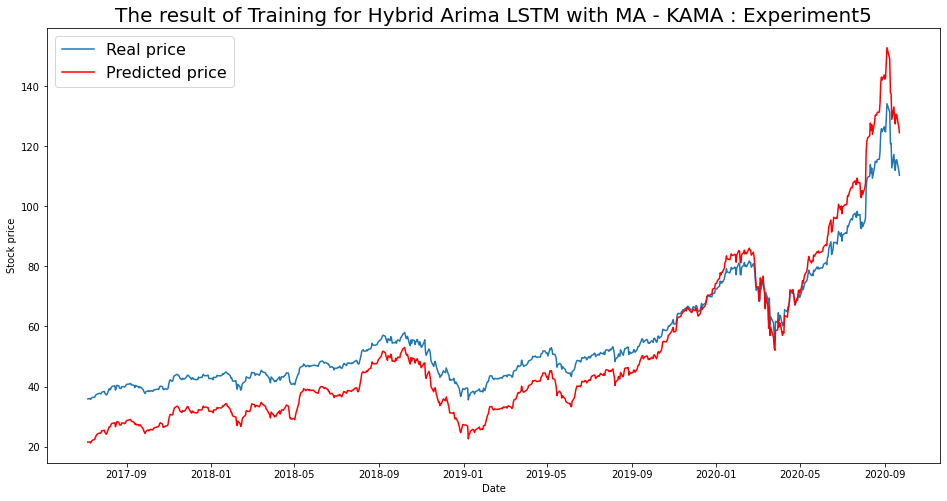

----- Train RMSE for KAMA ----- 9.224758606883512
----- Train_MSE_LSTM for KAMA ----- 85.09617135527144
----- Train MAE LSTM for KAMA ----- 8.391264192349656


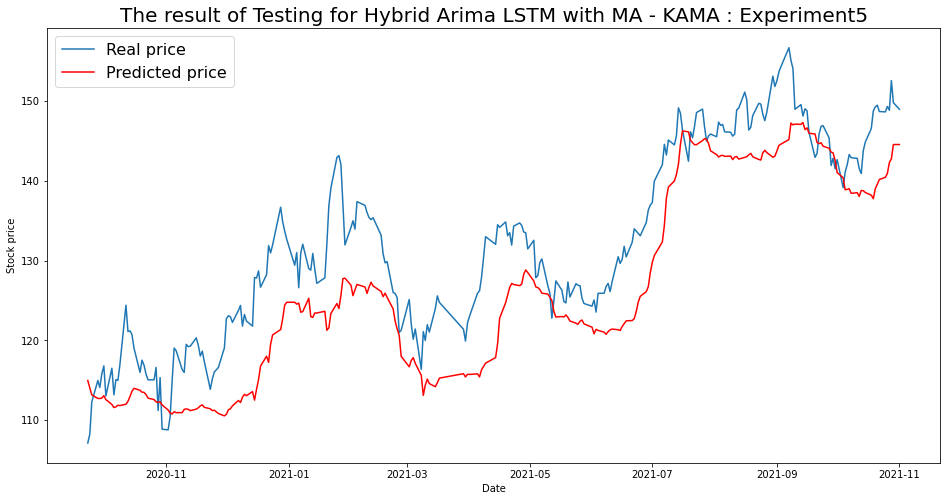

----- Test RMSE for KAMA----- 7.25012279717283
----- Test_MSE_LSTM for KAMA----- 52.56428057408519
----- Test_MAE_LSTM for KAMA----- 6.170488218753182


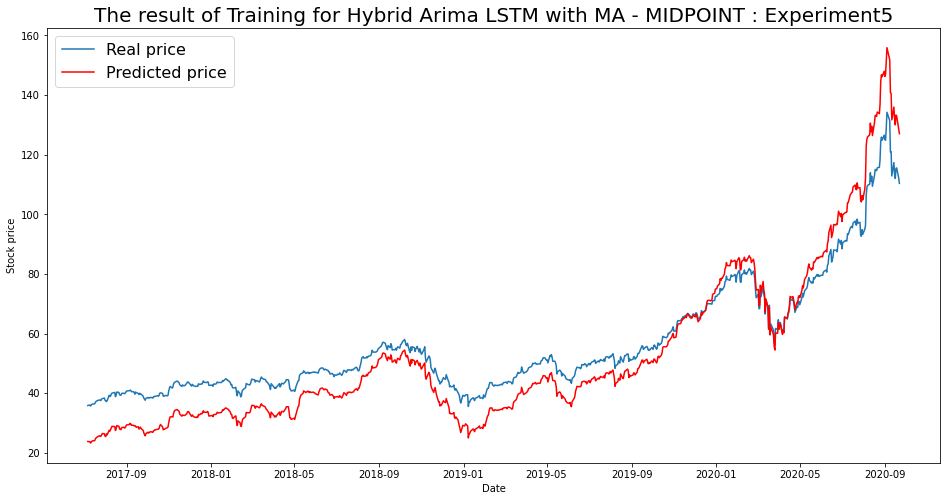

----- Train RMSE for MIDPOINT ----- 8.415583524174332
----- Train_MSE_LSTM for MIDPOINT ----- 70.82204605235448
----- Train MAE LSTM for MIDPOINT ----- 7.418297143134353


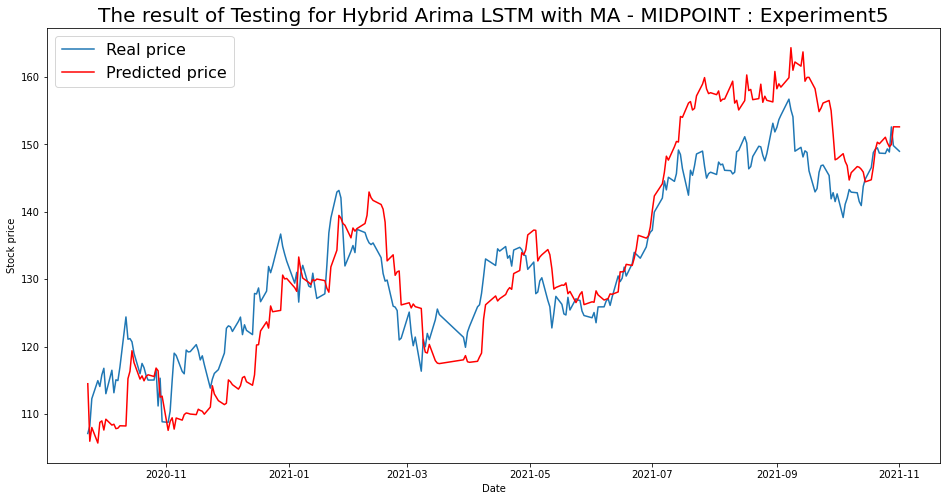

----- Test RMSE for MIDPOINT----- 6.649072650071791
----- Test_MSE_LSTM for MIDPOINT----- 44.21016710593271
----- Test_MAE_LSTM for MIDPOINT----- 5.476790088019583


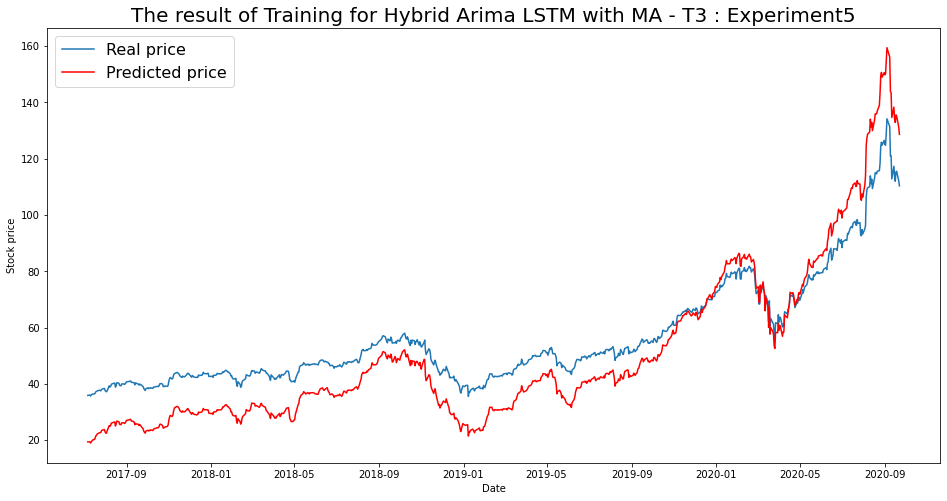

----- Train RMSE for T3 ----- 10.972513364419068
----- Train_MSE_LSTM for T3 ----- 120.39604953235508
----- Train MAE LSTM for T3 ----- 9.852330220934686


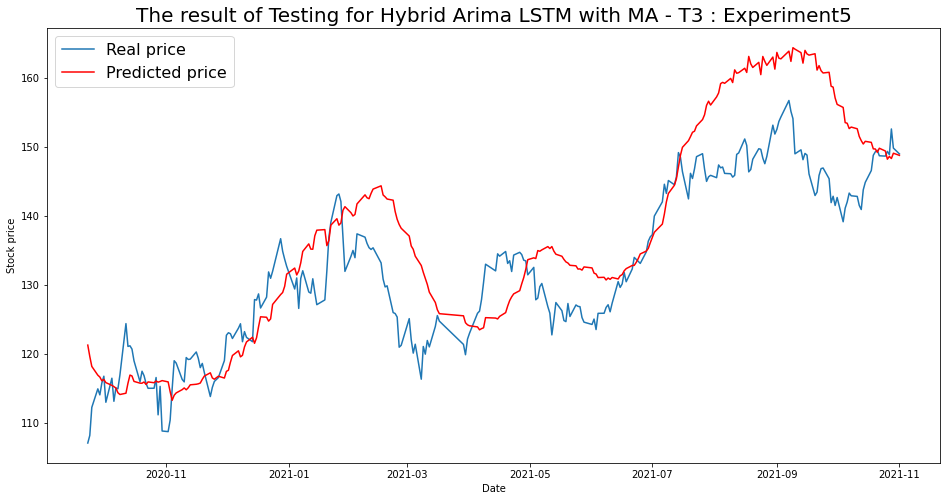

----- Test RMSE for T3----- 8.058934409725326
----- Test_MSE_LSTM for T3----- 64.94642382025489
----- Test_MAE_LSTM for T3----- 6.415762745110697


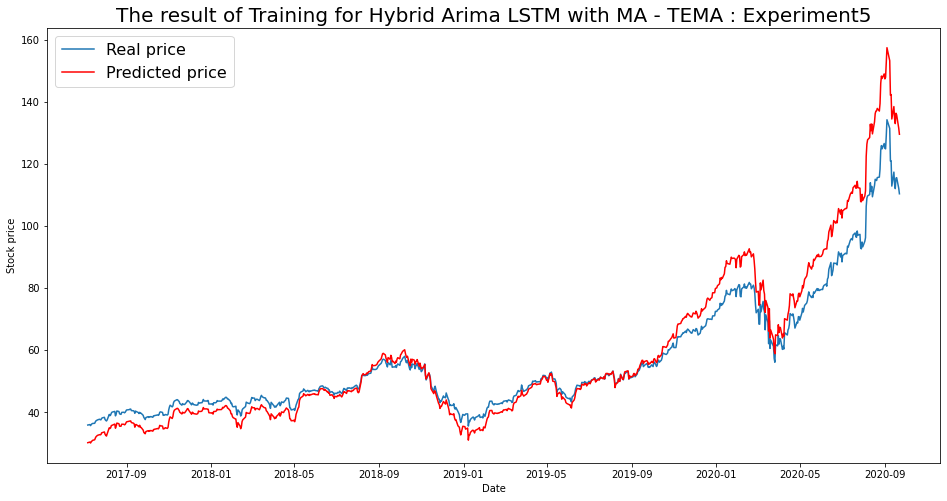

----- Train RMSE for TEMA ----- 6.651107172535585
----- Train_MSE_LSTM for TEMA ----- 44.237226620554296
----- Train MAE LSTM for TEMA ----- 4.542467270827089


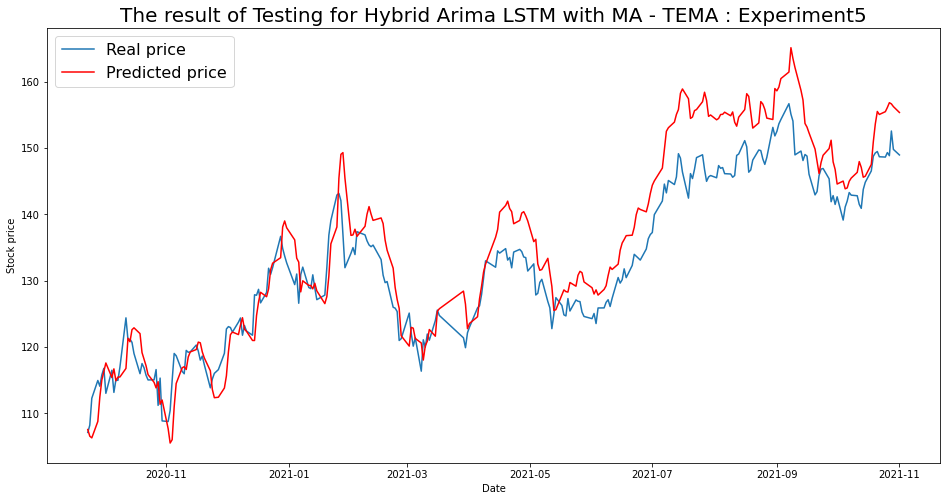

----- Test RMSE for TEMA----- 5.4050908906691895
----- Test_MSE_LSTM for TEMA----- 29.21500753639505
----- Test_MAE_LSTM for TEMA----- 4.44965723634719


In [108]:
for i in range(len(list(simulation5.keys()))):
  SIM = list(simulation5.keys())[i]
  plot_train(simulation5,SIM)
  plot_test(simulation5,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 6

In [ ]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det =20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()


    # # option 2
    model = Sequential()
    model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    model.add(Dense(64))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM6.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-14771.778, Time=13.25 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14135.387, Time=6.10 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15280.870, Time=10.58 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-15393.475, Time=9.00 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-14981.217, Time=4.97 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-14516.868, Time=13.91 sec
 ARIMA(0,3,1)(0,0,0)[0] intercept   : AIC=-15663.967, Time=10.04 sec
 ARIMA(0,3,0)(0,0,0)[0] intercept   : AIC=-13838.679, Time=5.35 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=-14734.479, Time=6.37 sec
 ARIMA(0,3,2)(0,0,0)[0] intercept   : AIC=-14866.409, Time=7.70 sec
 ARIMA(1,3,0)(0,0,0)[0] intercept   : AIC=-16157.4

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.01892, saving model to LSTM6.h5
48/48 - 7s - loss: 0.1326 - accuracy: 0.0000e+00 - val_loss: 0.0189 - val_accuracy: 0.0037 - lr: 0.0010 - 7s/epoch - 144ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.01892 to 0.00783, saving model to LSTM6.h5
48/48 - 0s - loss: 0.0203 - accuracy: 0.0000e+00 - val_loss: 0.0078 - val_accuracy: 0.0037 - lr: 0.0010 - 235ms/epoch - 5ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.00783
48/48 - 0s - loss: 0.0349 - accuracy: 0.0000e+00 - val_loss: 0.0144 - val_accuracy: 0.0037 - lr: 0.0010 - 219ms/epoch - 5ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.00783
48/48 - 0s - loss: 0.0187 - accuracy: 0.0000e+00 - val_loss: 0.0234 - val_accuracy: 0.0037 - lr: 0.0010 - 216ms/epoch - 4ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00783
48/48 - 0s - loss: 0.0109 - accuracy: 0.0000e+00 - val_loss: 0.1099 - val_accuracy: 0.0037 - lr: 0.0010 - 219

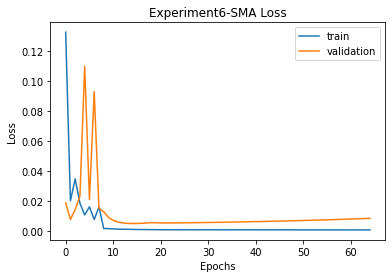


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 60.485697397526344 
RMSE:	 7.777255132598284 
MAPE:	 6.358945125308518
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17003.831, Time=2.77 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14572.593, Time=4.20 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16288.946, Time=6.92 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14570.593, Time=5.44 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16226.419, Time=9.82 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-13742.844, Time=8.63 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-16101.256, Time=19.83 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-17006.489, Time=2.65 sec
 ARIMA(3,3,0)(0,0,0)[0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17002.132, Time=3.36 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-17004.011, Time=4.11 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 94.420 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8570.327
Date:                Sun, 12 Dec 2021   AIC                         -17086.654
Time:                        18:06:47   BIC                         -16960.001
Sample:                             0   HQIC                        -17038.014
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.13086, saving model to LSTM6.h5
16/16 - 4s - loss: 0.1233 - accuracy: 0.0000e+00 - val_loss: 0.1309 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 4s/epoch - 222ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.13086 to 0.06494, saving model to LSTM6.h5
16/16 - 0s - loss: 0.0611 - accuracy: 0.0000e+00 - val_loss: 0.0649 - val_accuracy: 0.0037 - lr: 0.0010 - 104ms/epoch - 7ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.06494 to 0.00675, saving model to LSTM6.h5
16/16 - 0s - loss: 0.0231 - accuracy: 0.0000e+00 - val_loss: 0.0068 - val_accuracy: 0.0037 - lr: 0.0010 - 115ms/epoch - 7ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.00675 to 0.00578, saving model to LSTM6.h5
16/16 - 0s - loss: 0.0055 - accuracy: 0.0000e+00 - val_loss: 0.0058 - val_accuracy: 0.0037 - lr: 0.0010 - 114ms/epoch - 7ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00578
16/16 - 0s - loss: 0.0020 - accuracy: 0.0000e

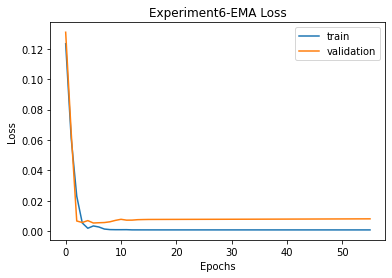


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 60.485697397526344 
RMSE:	 7.777255132598284 
MAPE:	 6.358945125308518

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 58.20305175219876 
RMSE:	 7.629092459277103 
MAPE:	 6.21442849961768
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16080.357, Time=11.59 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14973.799, Time=6.15 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15549.629, Time=1.82 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-15317.999, Time=8.46 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16061.924, Time=9.91 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15376.406, Time=14.46 sec


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.00724, saving model to LSTM6.h5
17/17 - 4s - loss: 0.0847 - accuracy: 0.0000e+00 - val_loss: 0.0072 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 234ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.00724 to 0.00667, saving model to LSTM6.h5
17/17 - 0s - loss: 0.0178 - accuracy: 0.0000e+00 - val_loss: 0.0067 - val_accuracy: 0.0037 - lr: 0.0010 - 110ms/epoch - 6ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.00667 to 0.00479, saving model to LSTM6.h5
17/17 - 0s - loss: 0.0044 - accuracy: 0.0000e+00 - val_loss: 0.0048 - val_accuracy: 0.0037 - lr: 0.0010 - 129ms/epoch - 8ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.00479
17/17 - 0s - loss: 0.0071 - accuracy: 0.0000e+00 - val_loss: 0.0116 - val_accuracy: 0.0037 - lr: 0.0010 - 95ms/epoch - 6ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.00479 to 0.00468, saving model to LSTM6.h5
17/17 - 0s - loss: 0.0029 - accuracy: 0.0000e+00 -

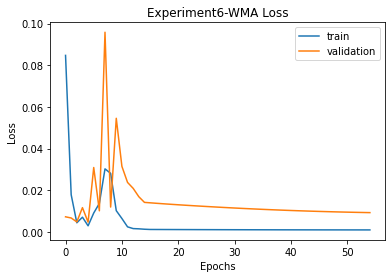


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 60.485697397526344 
RMSE:	 7.777255132598284 
MAPE:	 6.358945125308518

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 58.20305175219876 
RMSE:	 7.629092459277103 
MAPE:	 6.21442849961768

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 70.88350276857014 
RMSE:	 8.419234096316014 
MAPE:	 6.6789569931753
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17003.780, Time=3.03 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14572.593, Time=4.30 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15584.877, Time=8.29 sec
 ARIMA(0,3,1)(0,0,0)[0]           

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17001.997, Time=3.28 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16996.668, Time=4.00 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 94.368 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.723
Date:                Sun, 12 Dec 2021   AIC                         -17085.445
Time:                        18:22:36   BIC                         -16958.792
Sample:                             0   HQIC                        -17036.805
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.21665, saving model to LSTM6.h5
10/10 - 4s - loss: 0.1989 - accuracy: 0.0000e+00 - val_loss: 0.2167 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 4s/epoch - 390ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.21665 to 0.00898, saving model to LSTM6.h5
10/10 - 0s - loss: 0.1270 - accuracy: 0.0000e+00 - val_loss: 0.0090 - val_accuracy: 0.0037 - lr: 0.0010 - 78ms/epoch - 8ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.00898
10/10 - 0s - loss: 0.0819 - accuracy: 0.0000e+00 - val_loss: 0.1283 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 65ms/epoch - 7ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.00898
10/10 - 0s - loss: 0.0467 - accuracy: 0.0000e+00 - val_loss: 0.0334 - val_accuracy: 0.0037 - lr: 0.0010 - 66ms/epoch - 7ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00898
10/10 - 0s - loss: 0.0154 - accuracy: 0.0000e+00 - val_loss: 0.0434 - val_accuracy: 0.0037 - lr: 0.0010 

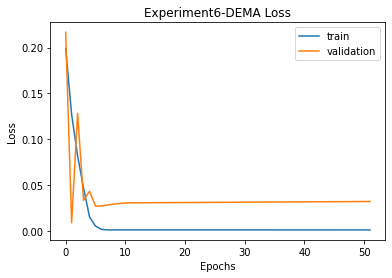


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 60.485697397526344 
RMSE:	 7.777255132598284 
MAPE:	 6.358945125308518

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 58.20305175219876 
RMSE:	 7.629092459277103 
MAPE:	 6.21442849961768

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 70.88350276857014 
RMSE:	 8.419234096316014 
MAPE:	 6.6789569931753

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 119.53246002468391 
RMSE:	 10.933090140700566 
MAPE:	 9.747683697911842
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17059.325, Time=3.67 sec
 ARIMA(0,

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17000.917, Time=3.48 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=45.027, Time=4.75 sec

Best model:  ARIMA(1,3,1)(0,0,0)[0]          
Total fit time: 61.075 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(1, 3, 1)   Log Likelihood                8554.662
Date:                Sun, 12 Dec 2021   AIC                         -17059.325
Time:                        18:32:29   BIC                         -16942.054
Sample:                             0   HQIC                        -17014.288
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.15069, saving model to LSTM6.h5
45/45 - 4s - loss: 0.1458 - accuracy: 0.0000e+00 - val_loss: 0.1507 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 4s/epoch - 82ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.15069 to 0.00809, saving model to LSTM6.h5
45/45 - 0s - loss: 0.0958 - accuracy: 0.0000e+00 - val_loss: 0.0081 - val_accuracy: 0.0037 - lr: 0.0010 - 220ms/epoch - 5ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.00809
45/45 - 0s - loss: 0.0271 - accuracy: 0.0000e+00 - val_loss: 0.1124 - val_accuracy: 0.0037 - lr: 0.0010 - 208ms/epoch - 5ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.00809
45/45 - 0s - loss: 0.0220 - accuracy: 0.0000e+00 - val_loss: 0.0164 - val_accuracy: 0.0037 - lr: 0.0010 - 209ms/epoch - 5ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00809
45/45 - 0s - loss: 0.0063 - accuracy: 0.0000e+00 - val_loss: 0.0540 - val_accuracy: 0.0037 - lr: 0.0010 - 

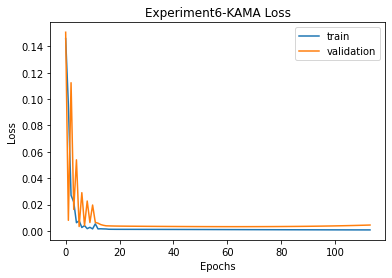


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 60.485697397526344 
RMSE:	 7.777255132598284 
MAPE:	 6.358945125308518

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 58.20305175219876 
RMSE:	 7.629092459277103 
MAPE:	 6.21442849961768

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 70.88350276857014 
RMSE:	 8.419234096316014 
MAPE:	 6.6789569931753

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 119.53246002468391 
RMSE:	 10.933090140700566 
MAPE:	 9.747683697911842

KAMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 61.13308833987969 
RMSE:	 7.818765141624327 
MAPE:	 6.461585168646619
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MIDPO

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.12328, saving model to LSTM6.h5
58/58 - 4s - loss: 0.1831 - accuracy: 0.0000e+00 - val_loss: 0.1233 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 4s/epoch - 65ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.12328 to 0.00640, saving model to LSTM6.h5
58/58 - 0s - loss: 0.0502 - accuracy: 0.0000e+00 - val_loss: 0.0064 - val_accuracy: 0.0037 - lr: 0.0010 - 284ms/epoch - 5ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.00640
58/58 - 0s - loss: 0.0100 - accuracy: 0.0000e+00 - val_loss: 0.0400 - val_accuracy: 0.0037 - lr: 0.0010 - 255ms/epoch - 4ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.00640
58/58 - 0s - loss: 0.0156 - accuracy: 0.0000e+00 - val_loss: 0.0123 - val_accuracy: 0.0037 - lr: 0.0010 - 270ms/epoch - 5ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00640
58/58 - 0s - loss: 0.0069 - accuracy: 0.0000e+00 - val_loss: 0.0534 - val_accuracy: 0.0037 - lr: 0.0010 - 

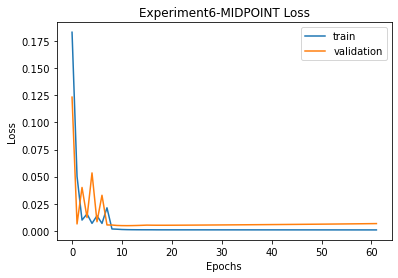


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 60.485697397526344 
RMSE:	 7.777255132598284 
MAPE:	 6.358945125308518

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 58.20305175219876 
RMSE:	 7.629092459277103 
MAPE:	 6.21442849961768

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 70.88350276857014 
RMSE:	 8.419234096316014 
MAPE:	 6.6789569931753

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 119.53246002468391 
RMSE:	 10.933090140700566 
MAPE:	 9.747683697911842

KAMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 61.13308833987969 
RMSE:	 7.818765141624327 
MAPE:	 6.461585168646619

MIDPOINT
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 61.5384692642518 
RMSE:	 7.8446458979517875 
MAPE:	 6.407298993379305
T3
T3([input_arrays], [timepe

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16924.758, Time=3.64 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=-16952.347, Time=2.30 sec

Best model:  ARIMA(1,3,1)(0,0,0)[0]          
Total fit time: 57.183 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(1, 3, 1)   Log Likelihood                8502.173
Date:                Sun, 12 Dec 2021   AIC                         -16954.347
Time:                        18:40:27   BIC                         -16837.076
Sample:                             0   HQIC                        -16909.310
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.09054, saving model to LSTM6.h5
43/43 - 4s - loss: 0.1402 - accuracy: 0.0000e+00 - val_loss: 0.0905 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 4s/epoch - 86ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.09054 to 0.00550, saving model to LSTM6.h5
43/43 - 0s - loss: 0.0382 - accuracy: 0.0000e+00 - val_loss: 0.0055 - val_accuracy: 0.0037 - lr: 0.0010 - 232ms/epoch - 5ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.00550
43/43 - 0s - loss: 0.0291 - accuracy: 0.0000e+00 - val_loss: 0.1315 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 206ms/epoch - 5ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.00550
43/43 - 0s - loss: 0.0341 - accuracy: 0.0000e+00 - val_loss: 0.0183 - val_accuracy: 0.0037 - lr: 0.0010 - 212ms/epoch - 5ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00550
43/43 - 0s - loss: 0.0166 - accuracy: 0.0000e+00 - val_loss: 0.1407 - val_accuracy: 0.0000e+00 - lr: 0

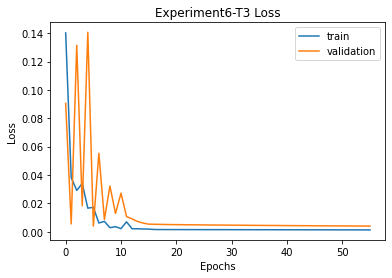


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 60.485697397526344 
RMSE:	 7.777255132598284 
MAPE:	 6.358945125308518

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 58.20305175219876 
RMSE:	 7.629092459277103 
MAPE:	 6.21442849961768

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 70.88350276857014 
RMSE:	 8.419234096316014 
MAPE:	 6.6789569931753

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 119.53246002468391 
RMSE:	 10.933090140700566 
MAPE:	 9.747683697911842

KAMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 61.13308833987969 
RMSE:	 7.818765141624327 
MAPE:	 6.461585168646619

MIDPOINT
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 61.5384692642518 
RMSE:	 7.8446458979517875 
MAPE:	 6.407298993379305

T3
Prediction vs Close:		54.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.10823, saving model to LSTM6.h5
90/90 - 4s - loss: 0.1248 - accuracy: 0.0000e+00 - val_loss: 0.1082 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 46ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.10823 to 0.01063, saving model to LSTM6.h5
90/90 - 0s - loss: 0.0325 - accuracy: 0.0000e+00 - val_loss: 0.0106 - val_accuracy: 0.0037 - lr: 0.0010 - 409ms/epoch - 5ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.01063
90/90 - 0s - loss: 0.0327 - accuracy: 0.0000e+00 - val_loss: 0.0371 - val_accuracy: 0.0037 - lr: 0.0010 - 397ms/epoch - 4ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.01063 to 0.00919, saving model to LSTM6.h5
90/90 - 0s - loss: 0.0261 - accuracy: 0.0000e+00 - val_loss: 0.0092 - val_accuracy: 0.0037 - lr: 0.0010 - 413ms/epoch - 5ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00919
90/90 - 0s - loss: 0.0209 - accuracy: 0.0000e+00 - val_loss: 0.0125 - val_accura

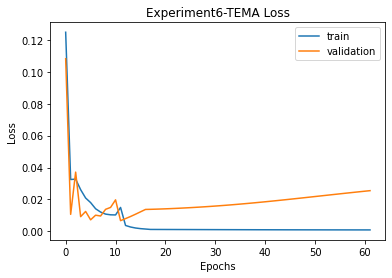


SMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 60.485697397526344 
RMSE:	 7.777255132598284 
MAPE:	 6.358945125308518

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 58.20305175219876 
RMSE:	 7.629092459277103 
MAPE:	 6.21442849961768

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 70.88350276857014 
RMSE:	 8.419234096316014 
MAPE:	 6.6789569931753

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 119.53246002468391 
RMSE:	 10.933090140700566 
MAPE:	 9.747683697911842

KAMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 61.13308833987969 
RMSE:	 7.818765141624327 
MAPE:	 6.461585168646619

MIDPOINT
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 61.5384692642518 
RMSE:	 7.8446458979517875 
MAPE:	 6.407298993379305

T3
Prediction vs Close:		54.

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation6 = {}
    imgfile = 'Experiment6'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation6[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation6_data.json', 'w') as fp:
                    json.dump(simulation6, fp)

                for ma in simulation6.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation6[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation6[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation6[ma]['final']['mse'],
                          '\nRMSE:\t', simulation6[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation6[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment6.png to Experiment6 (2).png


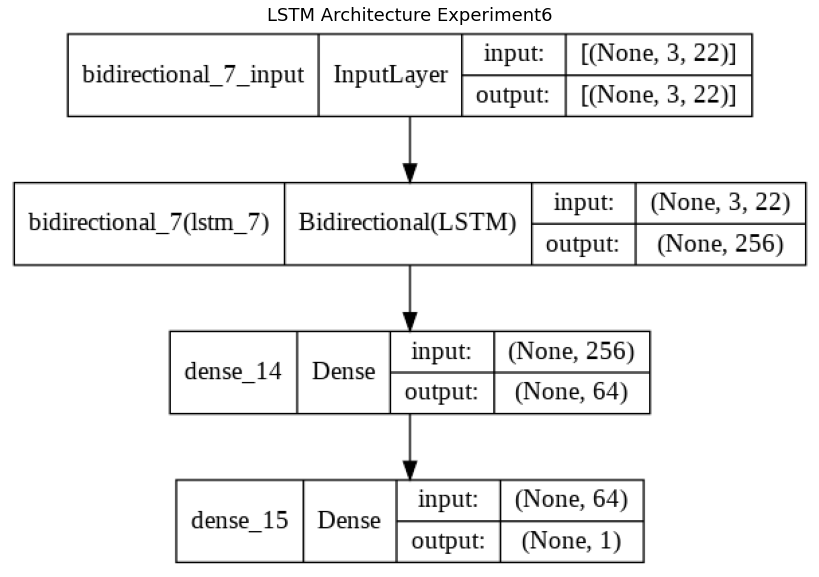

In [ ]:
img = cv2.imread('Experiment6.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [109]:
with open('simulation6_data.json') as json_file:
    simulation6 = json.load(json_file)
fileimg = 'Experiment6'

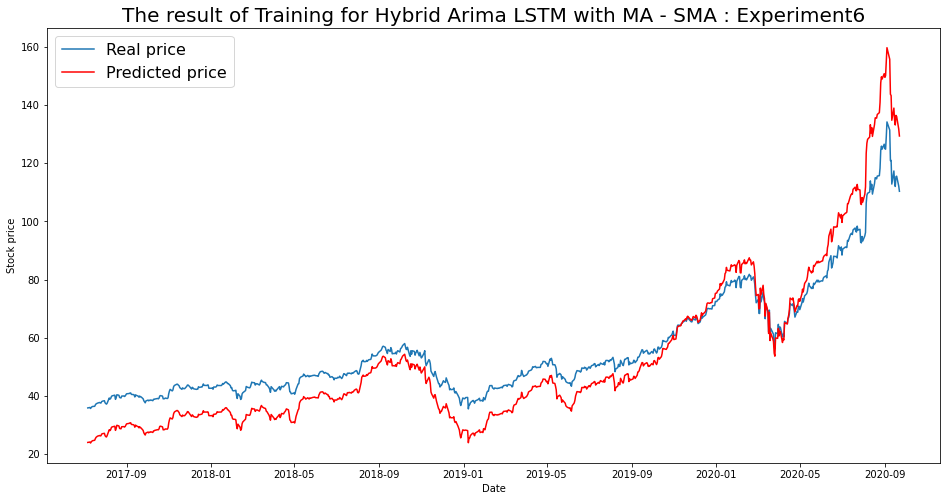

----- Train RMSE for SMA ----- 8.82965892571068
----- Train_MSE_LSTM for SMA ----- 77.96287674438227
----- Train MAE LSTM for SMA ----- 7.7139597657818975


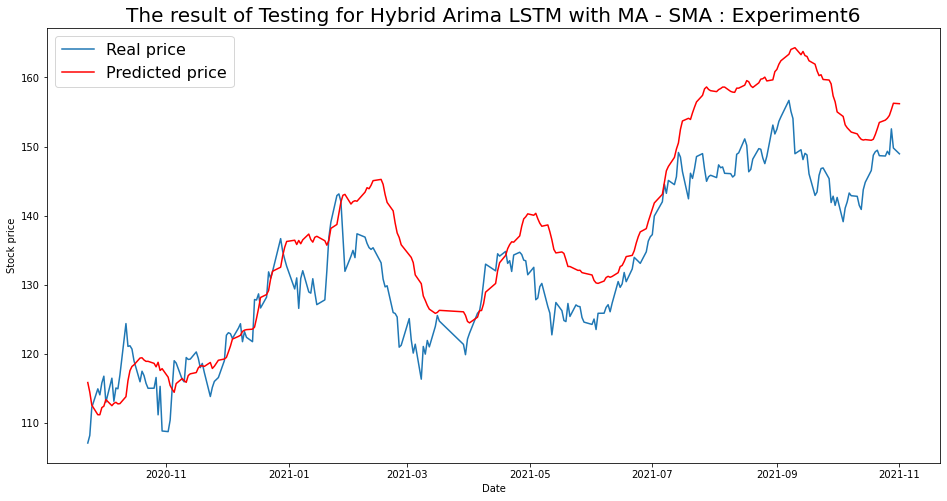

----- Test RMSE for SMA----- 7.777255132598284
----- Test_MSE_LSTM for SMA----- 60.485697397526344
----- Test_MAE_LSTM for SMA----- 6.358945125308518


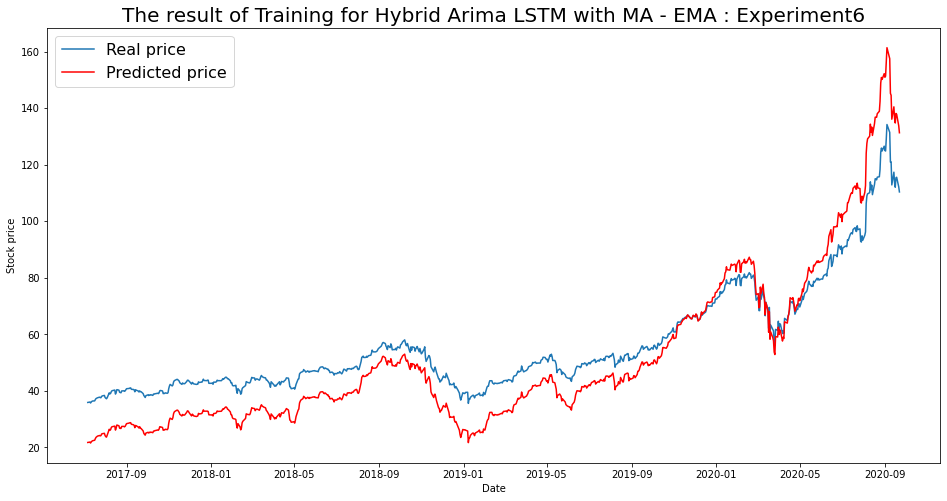

----- Train RMSE for EMA ----- 10.171315551915972
----- Train_MSE_LSTM for EMA ----- 103.45566005664772
----- Train MAE LSTM for EMA ----- 8.993942033814147


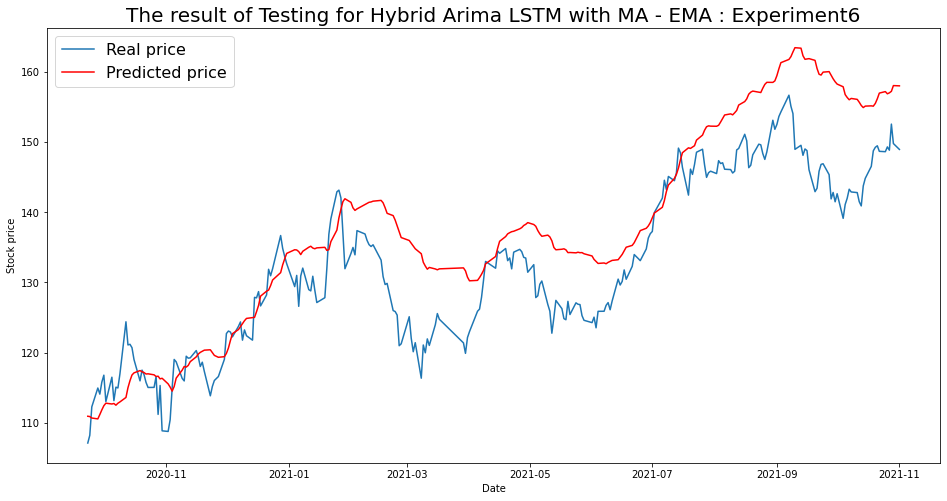

----- Test RMSE for EMA----- 7.629092459277103
----- Test_MSE_LSTM for EMA----- 58.20305175219876
----- Test_MAE_LSTM for EMA----- 6.21442849961768


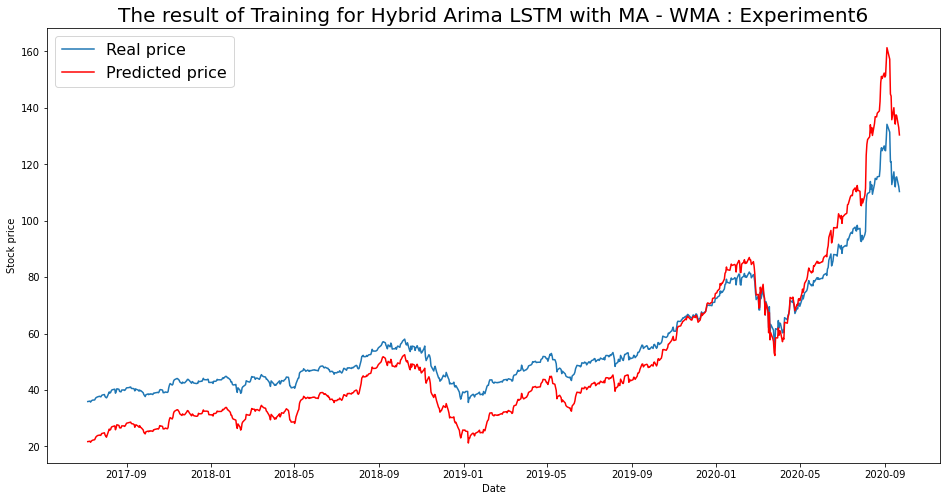

----- Train RMSE for WMA ----- 10.41897039644979
----- Train_MSE_LSTM for WMA ----- 108.5549441220971
----- Train MAE LSTM for WMA ----- 9.308931496257705


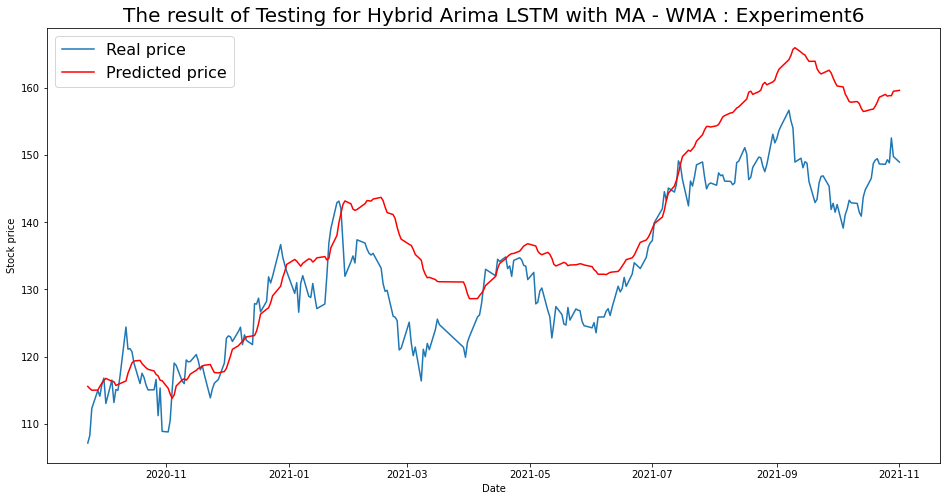

----- Test RMSE for WMA----- 8.419234096316014
----- Test_MSE_LSTM for WMA----- 70.88350276857014
----- Test_MAE_LSTM for WMA----- 6.6789569931753


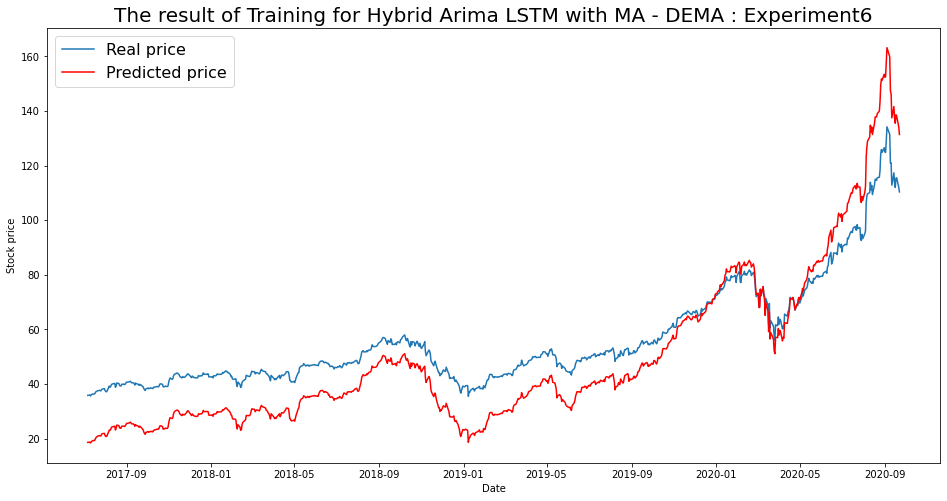

----- Train RMSE for DEMA ----- 12.03541858653864
----- Train_MSE_LSTM for DEMA ----- 144.85130055319976
----- Train MAE LSTM for DEMA ----- 10.796683445353278


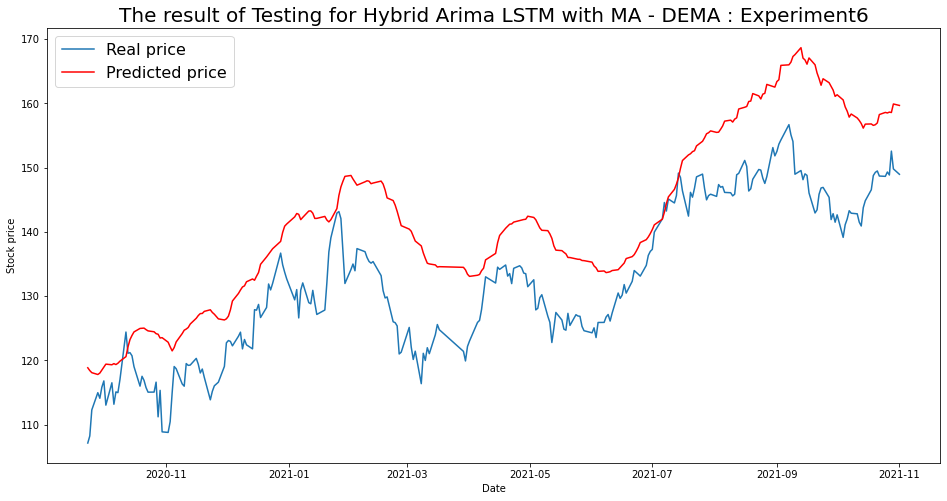

----- Test RMSE for DEMA----- 10.933090140700566
----- Test_MSE_LSTM for DEMA----- 119.53246002468391
----- Test_MAE_LSTM for DEMA----- 9.747683697911842


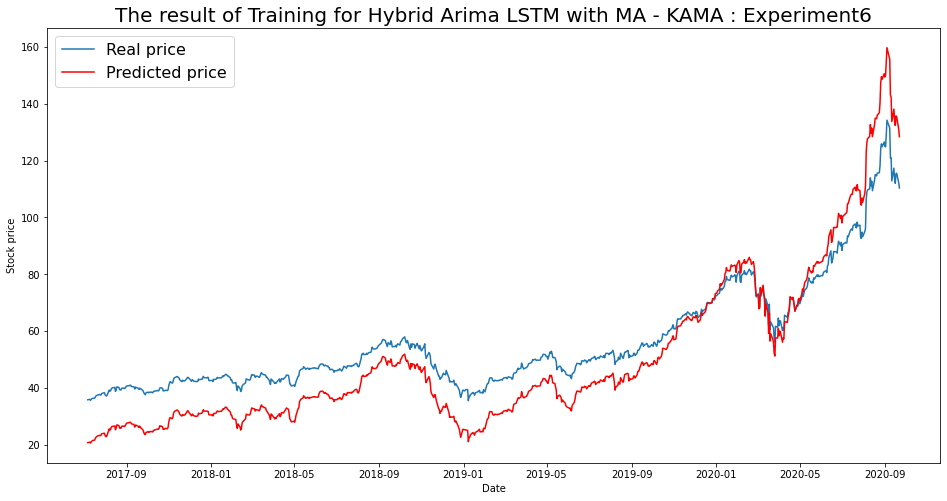

----- Train RMSE for KAMA ----- 10.508593318849396
----- Train_MSE_LSTM for KAMA ----- 110.43053354096617
----- Train MAE LSTM for KAMA ----- 9.452300205135183


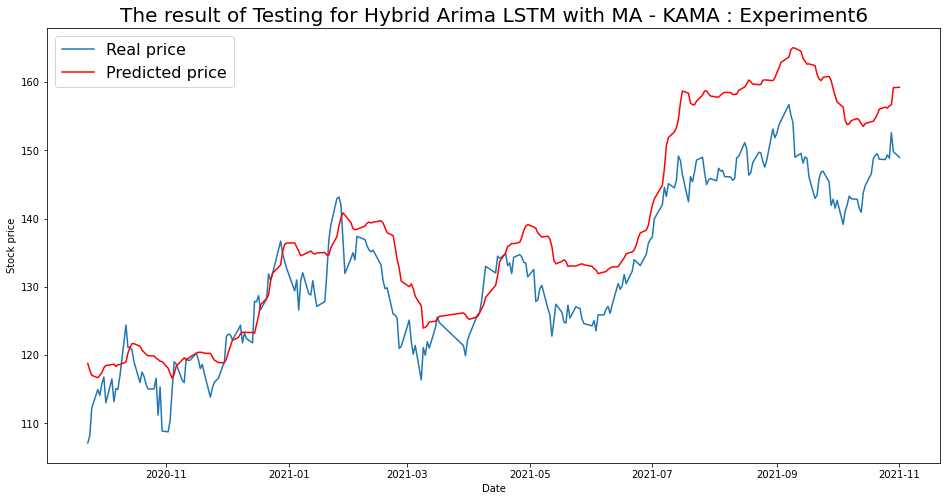

----- Test RMSE for KAMA----- 7.818765141624327
----- Test_MSE_LSTM for KAMA----- 61.13308833987969
----- Test_MAE_LSTM for KAMA----- 6.461585168646619


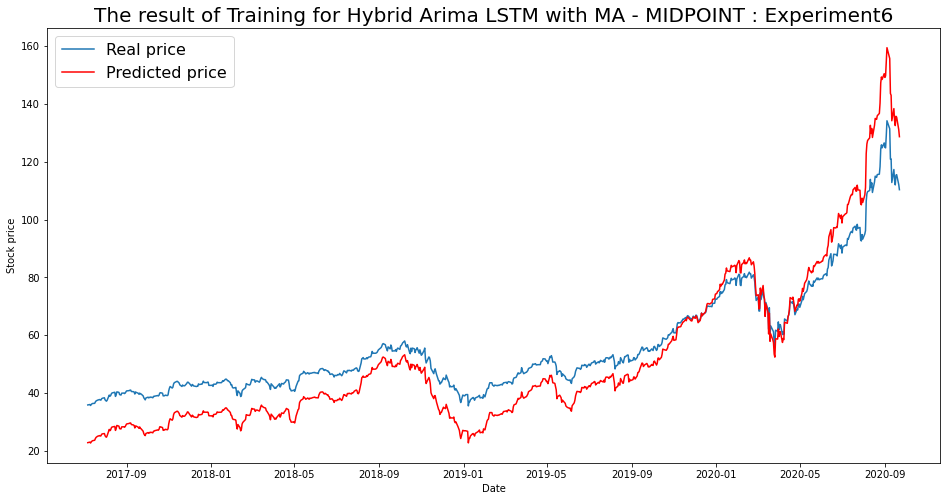

----- Train RMSE for MIDPOINT ----- 9.440601010764405
----- Train_MSE_LSTM for MIDPOINT ----- 89.12494744444592
----- Train MAE LSTM for MIDPOINT ----- 8.391389348327055


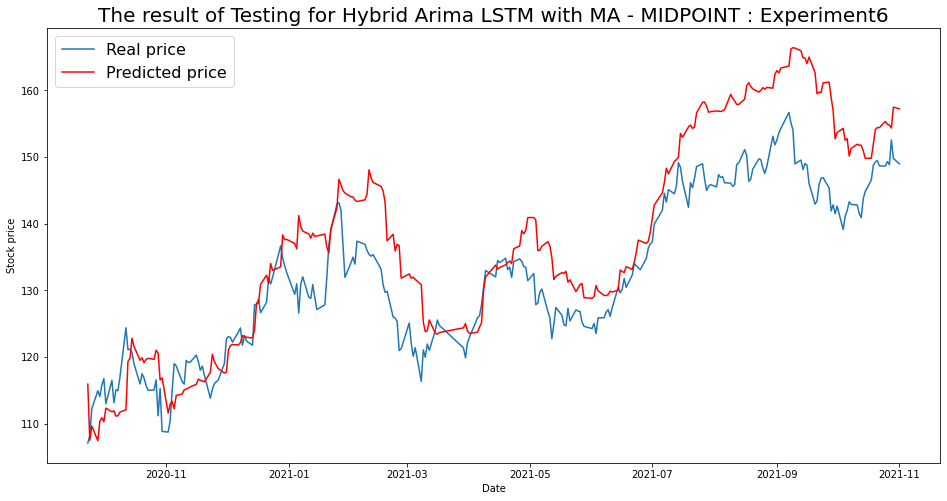

----- Test RMSE for MIDPOINT----- 7.8446458979517875
----- Test_MSE_LSTM for MIDPOINT----- 61.5384692642518
----- Test_MAE_LSTM for MIDPOINT----- 6.407298993379305


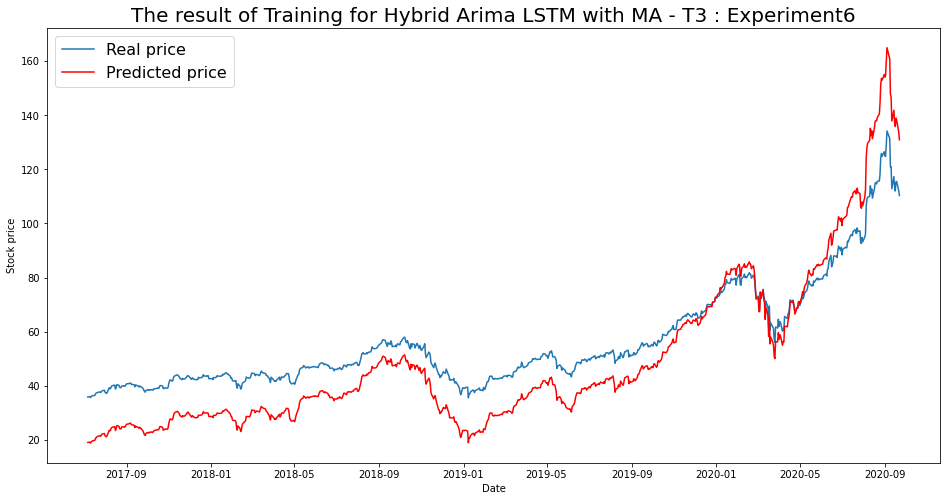

----- Train RMSE for T3 ----- 11.992355702371695
----- Train_MSE_LSTM for T3 ----- 143.81659529220693
----- Train MAE LSTM for T3 ----- 10.767362229981385


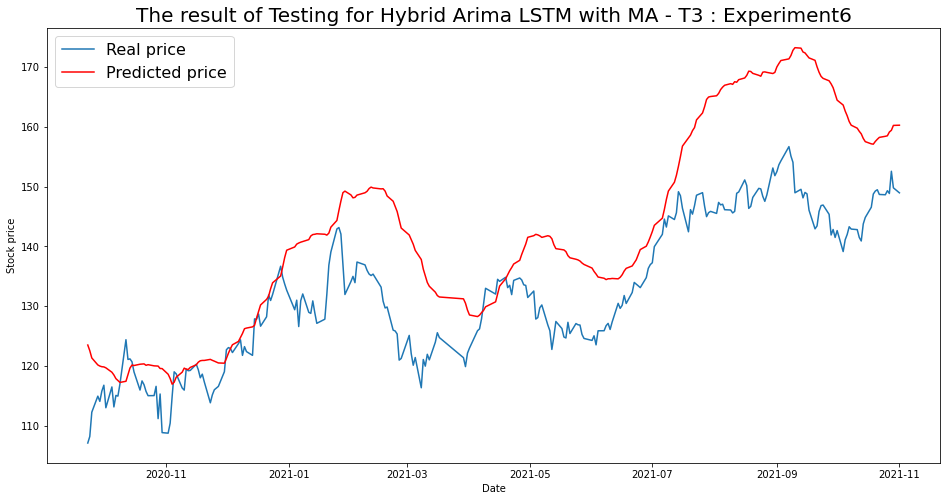

----- Test RMSE for T3----- 12.768162361214932
----- Test_MSE_LSTM for T3----- 163.02597008234568
----- Test_MAE_LSTM for T3----- 10.498544939048504


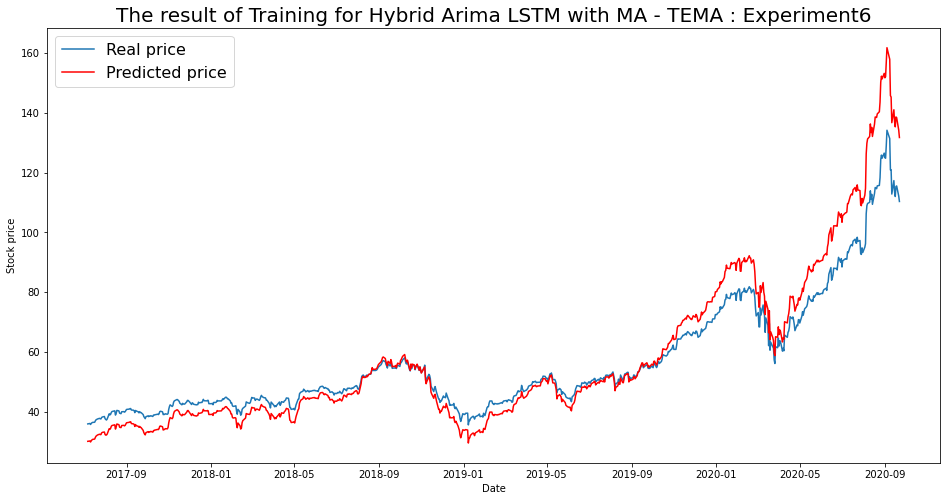

----- Train RMSE for TEMA ----- 7.421204593553642
----- Train_MSE_LSTM for TEMA ----- 55.07427761938168
----- Train MAE LSTM for TEMA ----- 5.137645379344801


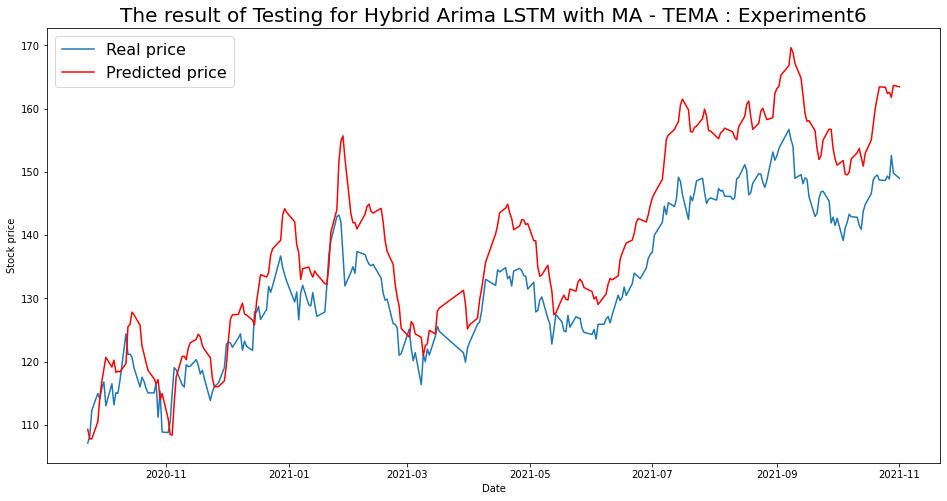

----- Test RMSE for TEMA----- 8.132790090811067
----- Test_MSE_LSTM for TEMA----- 66.14227466119469
----- Test_MAE_LSTM for TEMA----- 7.1170786919128775


In [110]:
for i in range(len(list(simulation6.keys()))):
  SIM = list(simulation6.keys())[i]
  plot_train(simulation6,SIM)
  plot_test(simulation6,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 7

In [ ]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det =20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma+' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # 
    class Double_Tanh(Activation):
        def __init__(self, activation, **kwargs):
            super(Double_Tanh, self).__init__(activation, **kwargs)
            self.__name__ = 'double_tanh'

    def double_tanh(x):
        return (K.tanh(x) * 2)

    get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
        # Model Generation
    model = Sequential()
    #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    model.add(Dense(1))
    model.add(Activation(double_tanh))
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-14771.778, Time=12.60 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14135.387, Time=6.27 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15280.870, Time=10.58 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-15393.475, Time=8.23 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-14981.217, Time=5.02 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-14516.868, Time=13.87 sec
 ARIMA(0,3,1)(0,0,0)[0] intercept   : AIC=-15663.967, Time=10.19 sec
 ARIMA(0,3,0)(0,0,0)[0] intercept   : AIC=-13838.679, Time=5.27 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=-14734.479, Time=6.54 sec
 ARIMA(0,3,2)(0,0,0)[0] intercept   : AIC=-14866.409, Time=7.59 sec
 ARIMA(1,3,0)(0,0,0)[0] intercept   : AIC=-16157.4

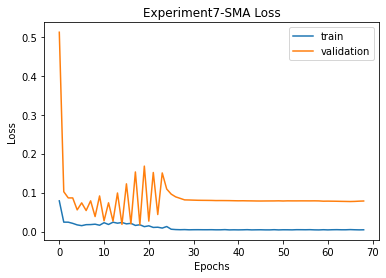


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 23.38002191723926 
RMSE:	 4.835289227878645 
MAPE:	 3.8675720673818827
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17003.831, Time=2.51 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14572.593, Time=4.39 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16288.946, Time=7.13 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14570.593, Time=5.85 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16226.419, Time=11.51 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-13742.844, Time=8.75 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-16101.256, Time=19.30 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-17006.489, Time=2.83 sec
 ARIMA(3,3,0)(0,0,0)[0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17002.132, Time=3.74 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-17004.011, Time=4.35 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 96.817 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8570.327
Date:                Sun, 12 Dec 2021   AIC                         -17086.654
Time:                        18:57:07   BIC                         -16960.001
Sample:                             0   HQIC                        -17038.014
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

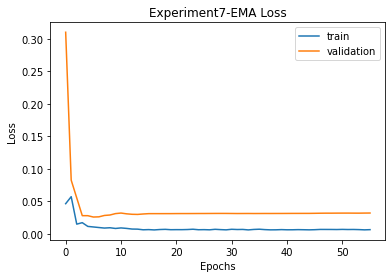


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 23.38002191723926 
RMSE:	 4.835289227878645 
MAPE:	 3.8675720673818827

EMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	51.49% Accuracy
MSE:	 35.056668726825066 
RMSE:	 5.920867227596399 
MAPE:	 4.704877912816018
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16080.357, Time=11.01 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14973.799, Time=5.84 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15549.629, Time=1.74 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-15317.999, Time=8.07 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16061.924, Time=9.28 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15376.406, Time=14.58 sec


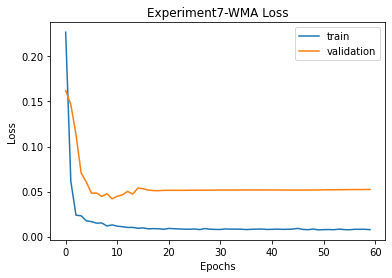


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 23.38002191723926 
RMSE:	 4.835289227878645 
MAPE:	 3.8675720673818827

EMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	51.49% Accuracy
MSE:	 35.056668726825066 
RMSE:	 5.920867227596399 
MAPE:	 4.704877912816018

WMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 44.87192646385527 
RMSE:	 6.698651092858566 
MAPE:	 5.33068935026581
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17003.780, Time=2.53 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14572.593, Time=4.33 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15584.877, Time=8.18 sec
 ARIMA(0,3,1)(0,0,0)[0]          

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17001.997, Time=3.29 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16996.668, Time=4.26 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 92.506 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.723
Date:                Sun, 12 Dec 2021   AIC                         -17085.445
Time:                        19:12:20   BIC                         -16958.792
Sample:                             0   HQIC                        -17036.805
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

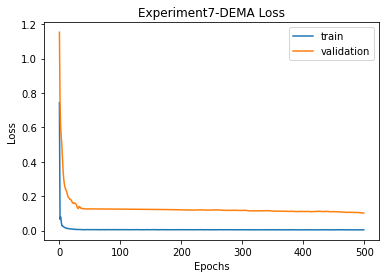


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 23.38002191723926 
RMSE:	 4.835289227878645 
MAPE:	 3.8675720673818827

EMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	51.49% Accuracy
MSE:	 35.056668726825066 
RMSE:	 5.920867227596399 
MAPE:	 4.704877912816018

WMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 44.87192646385527 
RMSE:	 6.698651092858566 
MAPE:	 5.33068935026581

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 53.079656203261706 
RMSE:	 7.285578645739933 
MAPE:	 5.726487515550782
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17059.325, Time=4.32 sec
 ARIMA(0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17000.917, Time=3.16 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=45.027, Time=4.20 sec

Best model:  ARIMA(1,3,1)(0,0,0)[0]          
Total fit time: 60.041 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(1, 3, 1)   Log Likelihood                8554.662
Date:                Sun, 12 Dec 2021   AIC                         -17059.325
Time:                        19:21:45   BIC                         -16942.054
Sample:                             0   HQIC                        -17014.288
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------


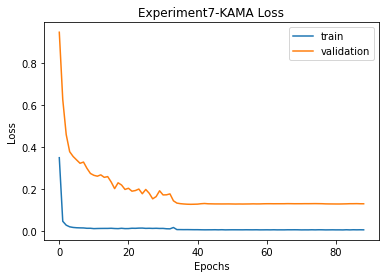


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 23.38002191723926 
RMSE:	 4.835289227878645 
MAPE:	 3.8675720673818827

EMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	51.49% Accuracy
MSE:	 35.056668726825066 
RMSE:	 5.920867227596399 
MAPE:	 4.704877912816018

WMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 44.87192646385527 
RMSE:	 6.698651092858566 
MAPE:	 5.33068935026581

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 53.079656203261706 
RMSE:	 7.285578645739933 
MAPE:	 5.726487515550782

KAMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 30.678794294842323 
RMSE:	 5.5388441298561855 
MAPE:	 4.336649130448084
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MI

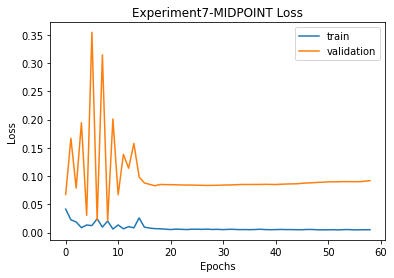


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 23.38002191723926 
RMSE:	 4.835289227878645 
MAPE:	 3.8675720673818827

EMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	51.49% Accuracy
MSE:	 35.056668726825066 
RMSE:	 5.920867227596399 
MAPE:	 4.704877912816018

WMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 44.87192646385527 
RMSE:	 6.698651092858566 
MAPE:	 5.33068935026581

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 53.079656203261706 
RMSE:	 7.285578645739933 
MAPE:	 5.726487515550782

KAMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 30.678794294842323 
RMSE:	 5.5388441298561855 
MAPE:	 4.336649130448084

MIDPOINT
Prediction vs Close:		47.39% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 19.38951232132957 
RMSE:	 4.4033523957695655 
MAPE:	 3.5042510250586574
T3
T3([input_arrays], [

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16924.758, Time=3.21 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=-16952.347, Time=2.17 sec

Best model:  ARIMA(1,3,1)(0,0,0)[0]          
Total fit time: 57.809 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(1, 3, 1)   Log Likelihood                8502.173
Date:                Sun, 12 Dec 2021   AIC                         -16954.347
Time:                        19:29:15   BIC                         -16837.076
Sample:                             0   HQIC                        -16909.310
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

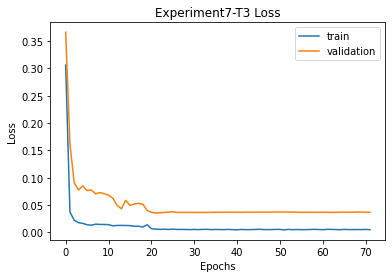


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 23.38002191723926 
RMSE:	 4.835289227878645 
MAPE:	 3.8675720673818827

EMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	51.49% Accuracy
MSE:	 35.056668726825066 
RMSE:	 5.920867227596399 
MAPE:	 4.704877912816018

WMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 44.87192646385527 
RMSE:	 6.698651092858566 
MAPE:	 5.33068935026581

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 53.079656203261706 
RMSE:	 7.285578645739933 
MAPE:	 5.726487515550782

KAMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 30.678794294842323 
RMSE:	 5.5388441298561855 
MAPE:	 4.336649130448084

MIDPOINT
Prediction vs Close:		47.39% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 19.38951232132957 
RMSE:	 4.4033523957695655 
MAPE:	 3.5042510250586574

T3
Prediction vs Close

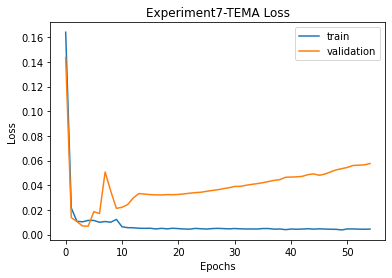


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	52.24% Accuracy
MSE:	 23.38002191723926 
RMSE:	 4.835289227878645 
MAPE:	 3.8675720673818827

EMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	51.49% Accuracy
MSE:	 35.056668726825066 
RMSE:	 5.920867227596399 
MAPE:	 4.704877912816018

WMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 44.87192646385527 
RMSE:	 6.698651092858566 
MAPE:	 5.33068935026581

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 53.079656203261706 
RMSE:	 7.285578645739933 
MAPE:	 5.726487515550782

KAMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 30.678794294842323 
RMSE:	 5.5388441298561855 
MAPE:	 4.336649130448084

MIDPOINT
Prediction vs Close:		47.39% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 19.38951232132957 
RMSE:	 4.4033523957695655 
MAPE:	 3.5042510250586574

T3
Prediction vs Close

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation7 = {}
    imgfile = 'Experiment7'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation7[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation7_data.json', 'w') as fp:
                    json.dump(simulation7, fp)

                for ma in simulation7.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation7[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation7[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation7[ma]['final']['mse'],
                          '\nRMSE:\t', simulation7[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation7[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment7.png to Experiment7 (2).png


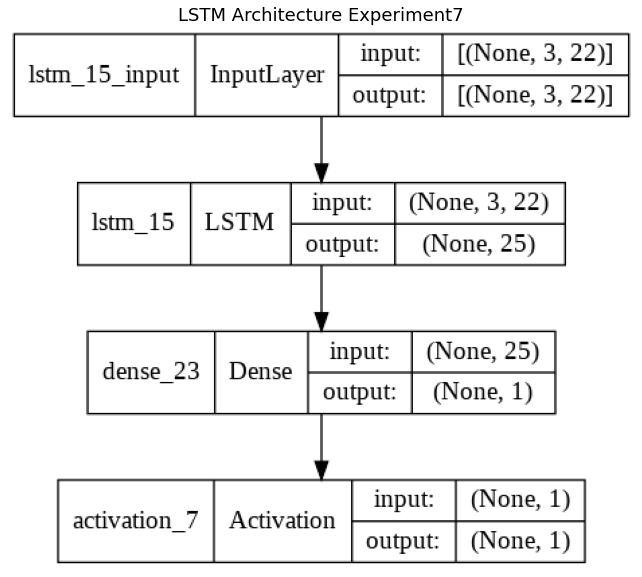

In [ ]:
img = cv2.imread('Experiment7.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [111]:
with open('simulation7_data.json') as json_file:
    simulation7 = json.load(json_file)
fileimg = 'Experiment7'

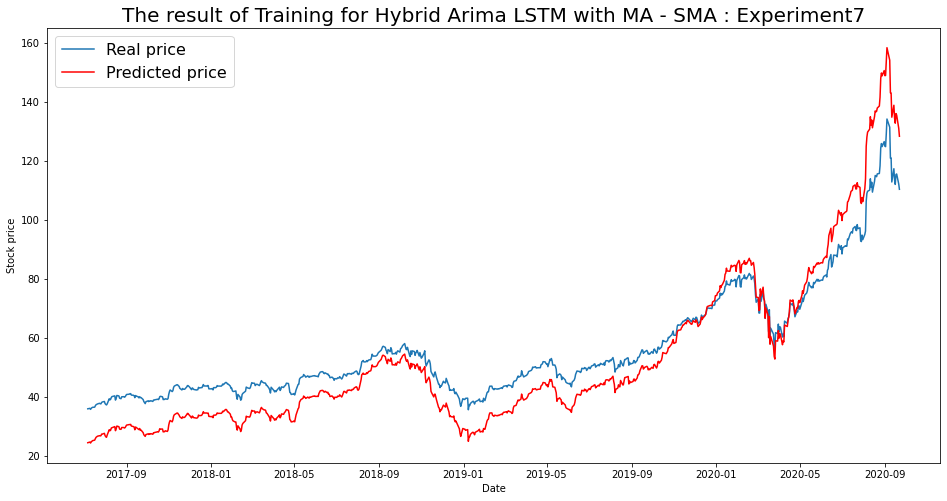

----- Train RMSE for SMA ----- 8.83785474825473
----- Train_MSE_LSTM for SMA ----- 78.10767655124866
----- Train MAE LSTM for SMA ----- 7.7078387567054225


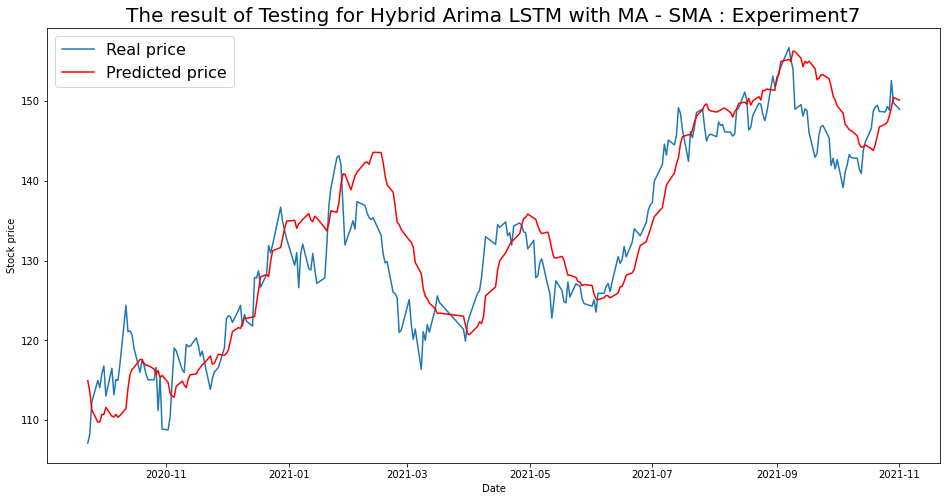

----- Test RMSE for SMA----- 4.835289227878645
----- Test_MSE_LSTM for SMA----- 23.38002191723926
----- Test_MAE_LSTM for SMA----- 3.8675720673818827


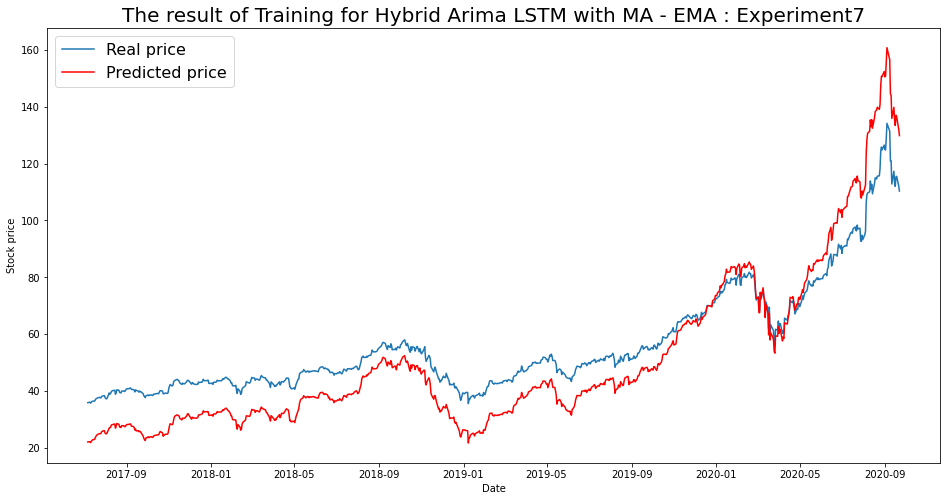

----- Train RMSE for EMA ----- 10.650301459792807
----- Train_MSE_LSTM for EMA ----- 113.4289211844648
----- Train MAE LSTM for EMA ----- 9.515306107312588


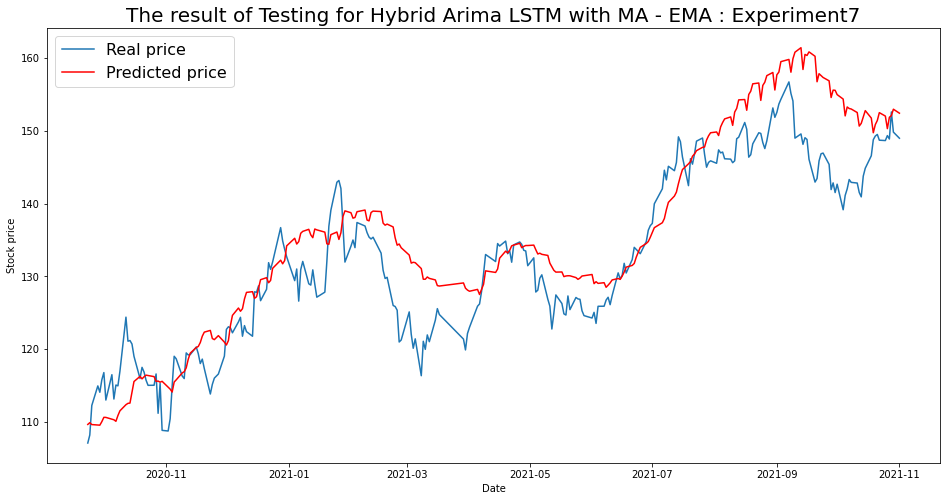

----- Test RMSE for EMA----- 5.920867227596399
----- Test_MSE_LSTM for EMA----- 35.056668726825066
----- Test_MAE_LSTM for EMA----- 4.704877912816018


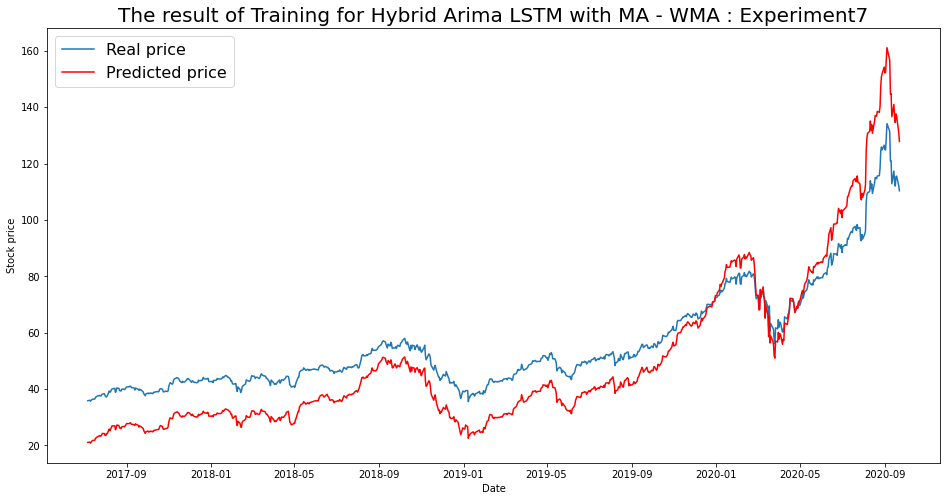

----- Train RMSE for WMA ----- 11.243993898135981
----- Train_MSE_LSTM for WMA ----- 126.4273987813192
----- Train MAE LSTM for WMA ----- 10.26125688382452


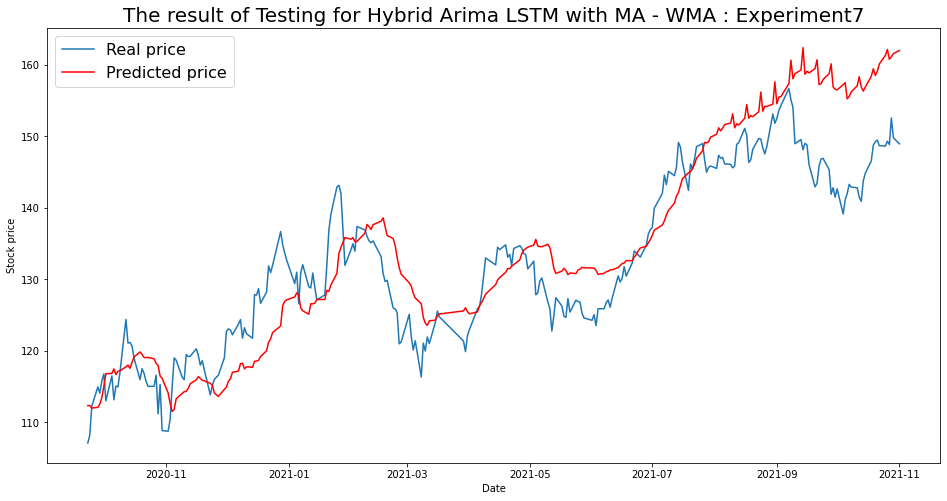

----- Test RMSE for WMA----- 6.698651092858566
----- Test_MSE_LSTM for WMA----- 44.87192646385527
----- Test_MAE_LSTM for WMA----- 5.33068935026581


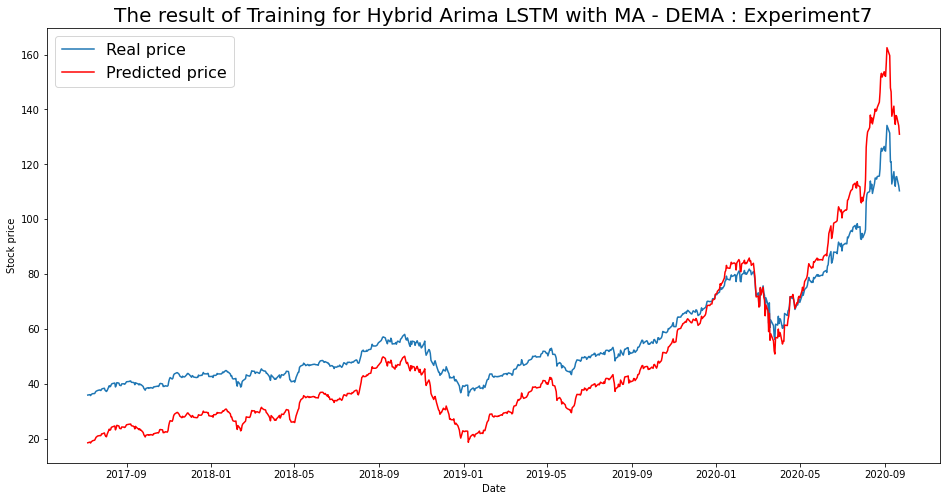

----- Train RMSE for DEMA ----- 12.733126101758637
----- Train_MSE_LSTM for DEMA ----- 162.1325003232871
----- Train MAE LSTM for DEMA ----- 11.568946368623488


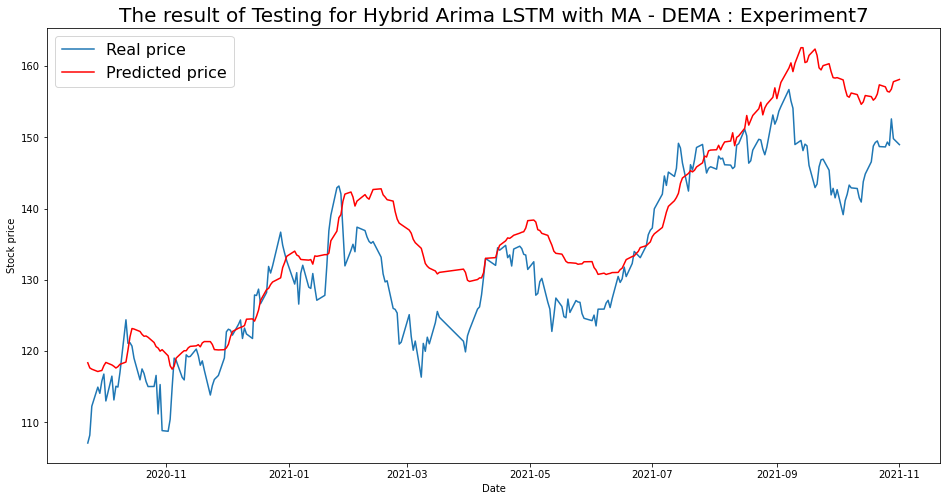

----- Test RMSE for DEMA----- 7.285578645739933
----- Test_MSE_LSTM for DEMA----- 53.079656203261706
----- Test_MAE_LSTM for DEMA----- 5.726487515550782


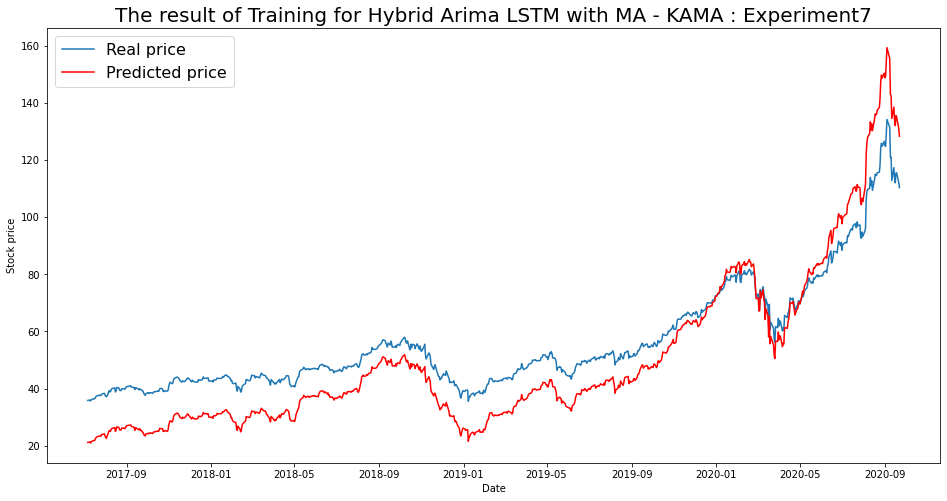

----- Train RMSE for KAMA ----- 10.74346361354885
----- Train_MSE_LSTM for KAMA ----- 115.42201041564812
----- Train MAE LSTM for KAMA ----- 9.724765787837049


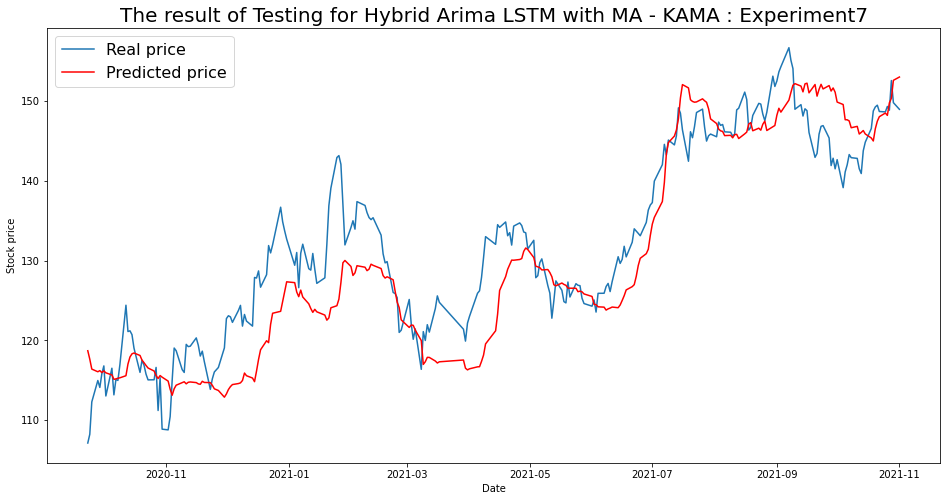

----- Test RMSE for KAMA----- 5.5388441298561855
----- Test_MSE_LSTM for KAMA----- 30.678794294842323
----- Test_MAE_LSTM for KAMA----- 4.336649130448084


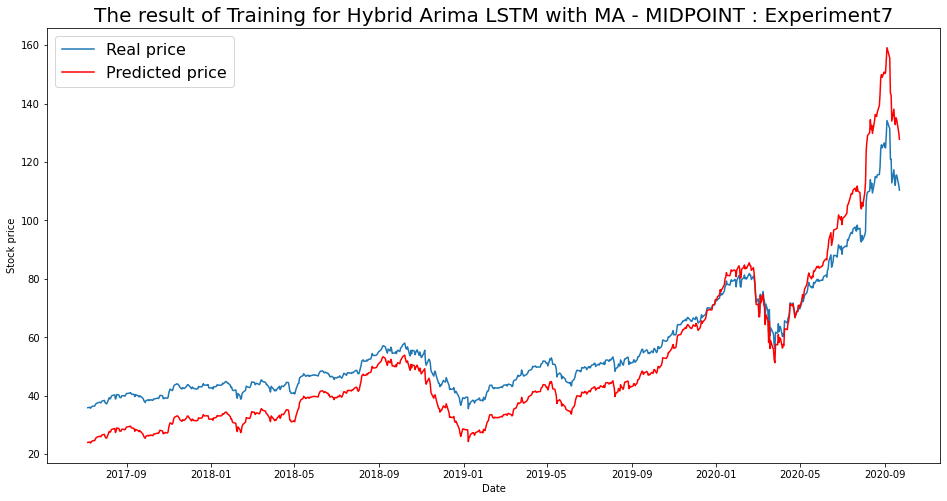

----- Train RMSE for MIDPOINT ----- 9.390036890135665
----- Train_MSE_LSTM for MIDPOINT ----- 88.17279279810867
----- Train MAE LSTM for MIDPOINT ----- 8.334413877029046


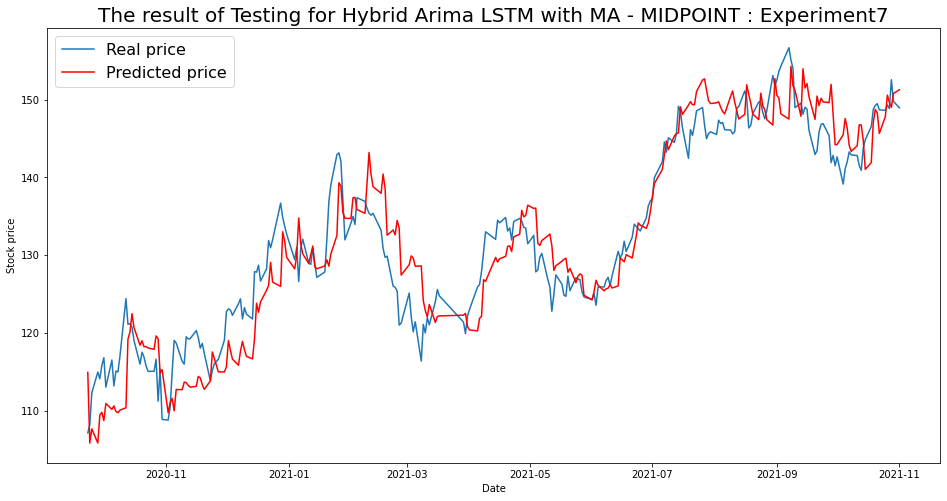

----- Test RMSE for MIDPOINT----- 4.4033523957695655
----- Test_MSE_LSTM for MIDPOINT----- 19.38951232132957
----- Test_MAE_LSTM for MIDPOINT----- 3.5042510250586574


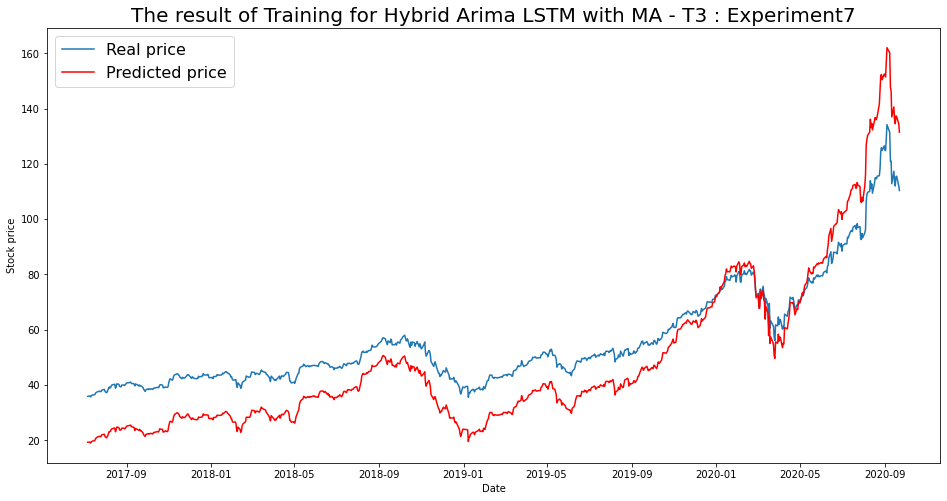

----- Train RMSE for T3 ----- 12.38034945262767
----- Train_MSE_LSTM for T3 ----- 153.27305256917825
----- Train MAE LSTM for T3 ----- 11.240396228217806


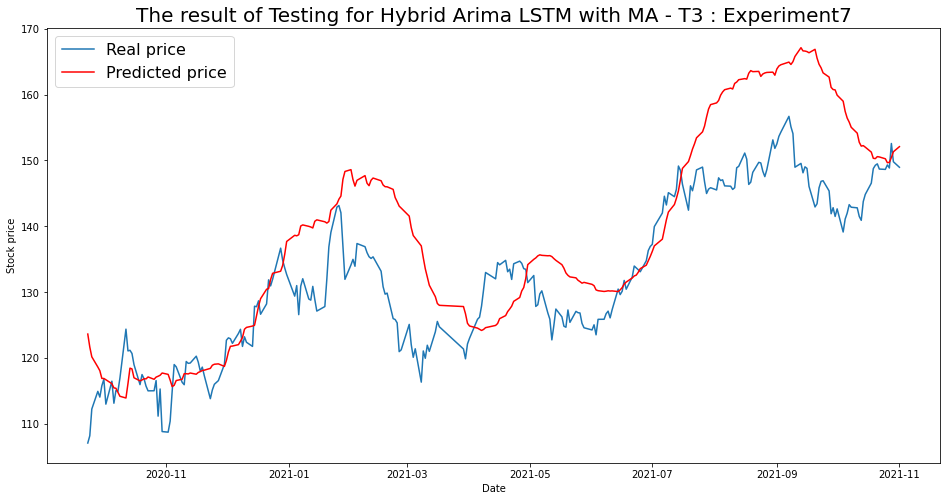

----- Test RMSE for T3----- 9.524858325505727
----- Test_MSE_LSTM for T3----- 90.72292612095576
----- Test_MAE_LSTM for T3----- 7.398189805001564


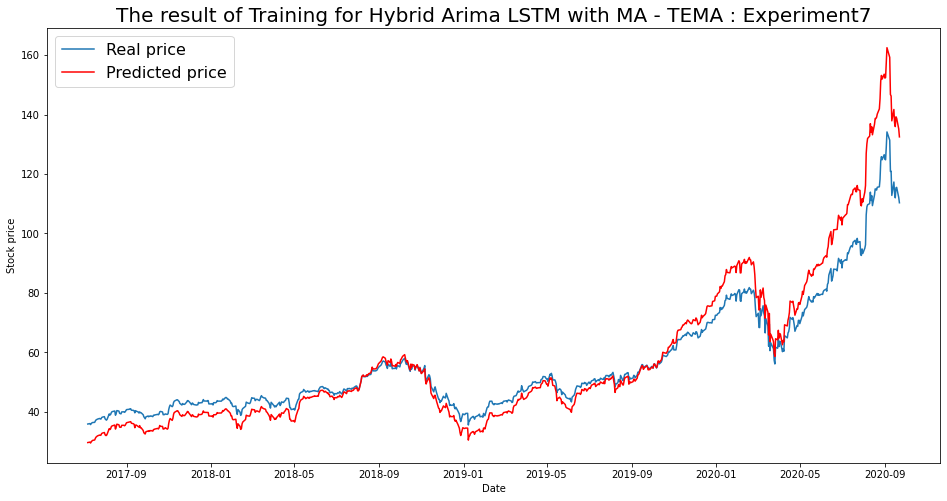

----- Train RMSE for TEMA ----- 7.385672398559769
----- Train_MSE_LSTM for TEMA ----- 54.548156778847606
----- Train MAE LSTM for TEMA ----- 5.039816631869549


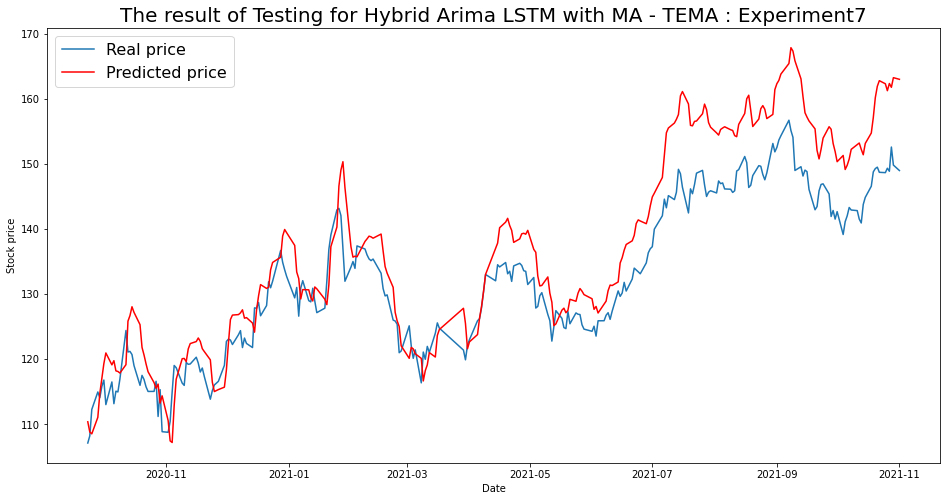

----- Test RMSE for TEMA----- 6.850219380402268
----- Test_MSE_LSTM for TEMA----- 46.925505559638836
----- Test_MAE_LSTM for TEMA----- 5.67920042842036


In [112]:
for i in range(len(list(simulation7.keys()))):
  SIM = list(simulation7.keys())[i]
  plot_train(simulation7,SIM)
  plot_test(simulation7,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 8

In [ ]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det =20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma+' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma+' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # #Option 4
    # # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(input_dim, feature_size)))
    model.add(LSTM(units=int(lstm_len/2)))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='mean_squared_error', optimizer='adam')
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM8.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-14771.778, Time=11.98 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14135.387, Time=5.95 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15280.870, Time=10.09 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-15393.475, Time=8.27 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-14981.217, Time=4.96 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-14516.868, Time=13.65 sec
 ARIMA(0,3,1)(0,0,0)[0] intercept   : AIC=-15663.967, Time=10.14 sec
 ARIMA(0,3,0)(0,0,0)[0] intercept   : AIC=-13838.679, Time=5.14 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=-14734.479, Time=6.22 sec
 ARIMA(0,3,2)(0,0,0)[0] intercept   : AIC=-14866.409, Time=8.20 sec
 ARIMA(1,3,0)(0,0,0)[0] intercept   : AIC=-16157.4

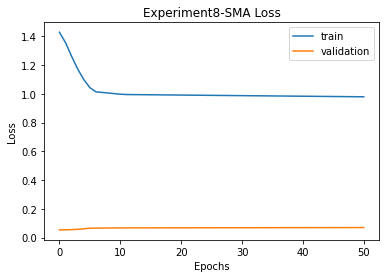


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 24.12057947793772 
RMSE:	 4.911270658183859 
MAPE:	 3.8711068958774497
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17003.831, Time=2.39 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14572.593, Time=4.29 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16288.946, Time=7.13 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14570.593, Time=6.21 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16226.419, Time=11.44 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-13742.844, Time=8.55 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-16101.256, Time=19.59 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-17006.489, Time=2.86 sec
 ARIMA(3,3,0)(0,0,0)[

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17002.132, Time=3.66 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-17004.011, Time=3.85 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 94.752 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8570.327
Date:                Sun, 12 Dec 2021   AIC                         -17086.654
Time:                        19:44:27   BIC                         -16960.001
Sample:                             0   HQIC                        -17038.014
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

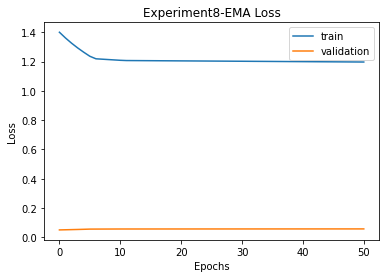


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 24.12057947793772 
RMSE:	 4.911270658183859 
MAPE:	 3.8711068958774497

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.227409389726965 
RMSE:	 6.018920948951479 
MAPE:	 4.70810831106621
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16080.357, Time=11.09 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14973.799, Time=6.43 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15549.629, Time=1.91 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-15317.999, Time=8.51 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16061.924, Time=9.72 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15376.406, Time=14.43 sec

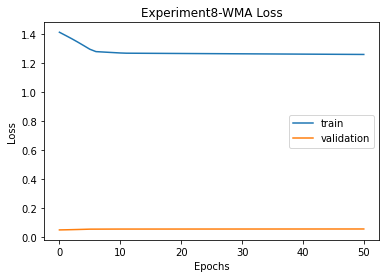


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 24.12057947793772 
RMSE:	 4.911270658183859 
MAPE:	 3.8711068958774497

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.227409389726965 
RMSE:	 6.018920948951479 
MAPE:	 4.70810831106621

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 47.6040579193988 
RMSE:	 6.8995694010132835 
MAPE:	 5.522605601178568
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17003.780, Time=2.79 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14572.593, Time=4.30 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15584.877, Time=8.35 sec
 ARIMA(0,3,1)(0,0,0)[0]         

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17001.997, Time=3.96 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16996.668, Time=4.14 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 95.868 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.723
Date:                Sun, 12 Dec 2021   AIC                         -17085.445
Time:                        19:59:36   BIC                         -16958.792
Sample:                             0   HQIC                        -17036.805
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

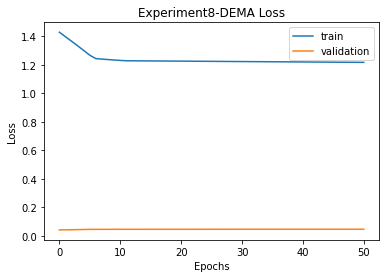


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 24.12057947793772 
RMSE:	 4.911270658183859 
MAPE:	 3.8711068958774497

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.227409389726965 
RMSE:	 6.018920948951479 
MAPE:	 4.70810831106621

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 47.6040579193988 
RMSE:	 6.8995694010132835 
MAPE:	 5.522605601178568

DEMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 155.67335739769726 
RMSE:	 12.476912975479843 
MAPE:	 11.236116903479964
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17059.325, Time=4.12 sec
 ARIM

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17000.917, Time=4.00 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=45.027, Time=4.74 sec

Best model:  ARIMA(1,3,1)(0,0,0)[0]          
Total fit time: 64.246 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(1, 3, 1)   Log Likelihood                8554.662
Date:                Sun, 12 Dec 2021   AIC                         -17059.325
Time:                        20:08:53   BIC                         -16942.054
Sample:                             0   HQIC                        -17014.288
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------


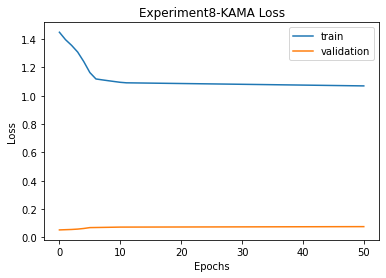


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 24.12057947793772 
RMSE:	 4.911270658183859 
MAPE:	 3.8711068958774497

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.227409389726965 
RMSE:	 6.018920948951479 
MAPE:	 4.70810831106621

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 47.6040579193988 
RMSE:	 6.8995694010132835 
MAPE:	 5.522605601178568

DEMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 155.67335739769726 
RMSE:	 12.476912975479843 
MAPE:	 11.236116903479964

KAMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 19.84916238053282 
RMSE:	 4.45523987912355 
MAPE:	 3.572304554405335
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MID

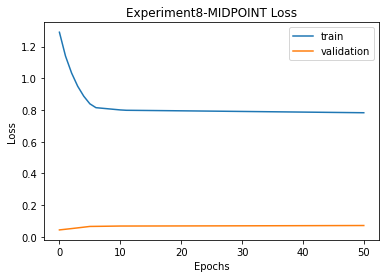


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 24.12057947793772 
RMSE:	 4.911270658183859 
MAPE:	 3.8711068958774497

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.227409389726965 
RMSE:	 6.018920948951479 
MAPE:	 4.70810831106621

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 47.6040579193988 
RMSE:	 6.8995694010132835 
MAPE:	 5.522605601178568

DEMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 155.67335739769726 
RMSE:	 12.476912975479843 
MAPE:	 11.236116903479964

KAMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 19.84916238053282 
RMSE:	 4.45523987912355 
MAPE:	 3.572304554405335

MIDPOINT
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 21.813261360012138 
RMSE:	 4.67046693169025 
MAPE:	 3.6223152079979295
T3
T3([input_arrays], [ti

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16924.758, Time=3.47 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=-16952.347, Time=2.52 sec

Best model:  ARIMA(1,3,1)(0,0,0)[0]          
Total fit time: 59.502 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(1, 3, 1)   Log Likelihood                8502.173
Date:                Sun, 12 Dec 2021   AIC                         -16954.347
Time:                        20:16:27   BIC                         -16837.076
Sample:                             0   HQIC                        -16909.310
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

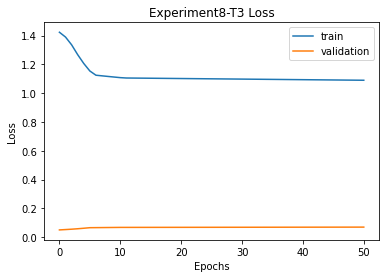


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 24.12057947793772 
RMSE:	 4.911270658183859 
MAPE:	 3.8711068958774497

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.227409389726965 
RMSE:	 6.018920948951479 
MAPE:	 4.70810831106621

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 47.6040579193988 
RMSE:	 6.8995694010132835 
MAPE:	 5.522605601178568

DEMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 155.67335739769726 
RMSE:	 12.476912975479843 
MAPE:	 11.236116903479964

KAMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 19.84916238053282 
RMSE:	 4.45523987912355 
MAPE:	 3.572304554405335

MIDPOINT
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 21.813261360012138 
RMSE:	 4.67046693169025 
MAPE:	 3.6223152079979295

T3
Prediction vs Close:	

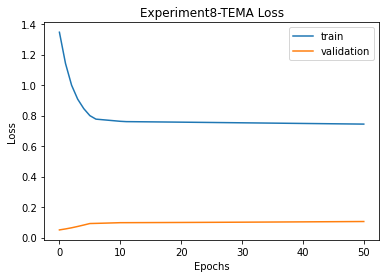


SMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 24.12057947793772 
RMSE:	 4.911270658183859 
MAPE:	 3.8711068958774497

EMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.227409389726965 
RMSE:	 6.018920948951479 
MAPE:	 4.70810831106621

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 47.6040579193988 
RMSE:	 6.8995694010132835 
MAPE:	 5.522605601178568

DEMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 155.67335739769726 
RMSE:	 12.476912975479843 
MAPE:	 11.236116903479964

KAMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 19.84916238053282 
RMSE:	 4.45523987912355 
MAPE:	 3.572304554405335

MIDPOINT
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 21.813261360012138 
RMSE:	 4.67046693169025 
MAPE:	 3.6223152079979295

T3
Prediction vs Close:	

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation8 = {}
    imgfile = 'Experiment8'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation8[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation8_data.json', 'w') as fp:
                    json.dump(simulation8, fp)

                for ma in simulation8.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation8[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation8[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation8[ma]['final']['mse'],
                          '\nRMSE:\t', simulation8[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation8[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment8.png to Experiment8 (1).png


In [ ]:
img = cv2.imread('Experiment8.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [113]:
with open('simulation8_data.json') as json_file:
    simulation8 = json.load(json_file)
fileimg = 'Experiment8'

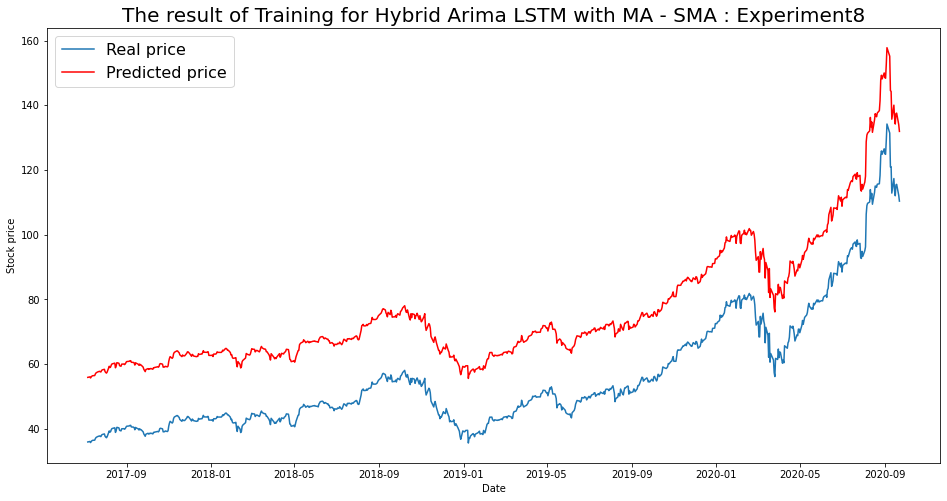

----- Train RMSE for SMA ----- 20.144952693145125
----- Train_MSE_LSTM for SMA ----- 405.81911900905504
----- Train MAE LSTM for SMA ----- 20.137185568856722


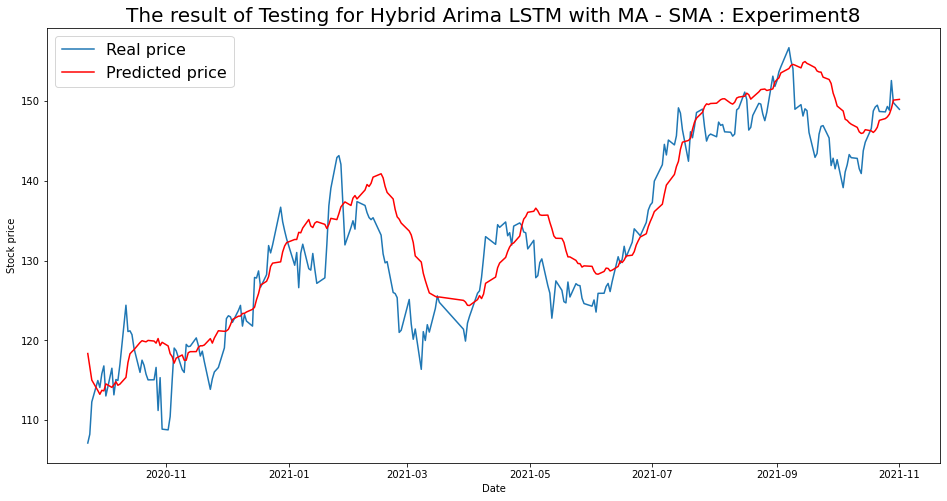

----- Test RMSE for SMA----- 4.911270658183859
----- Test_MSE_LSTM for SMA----- 24.12057947793772
----- Test_MAE_LSTM for SMA----- 3.8711068958774497


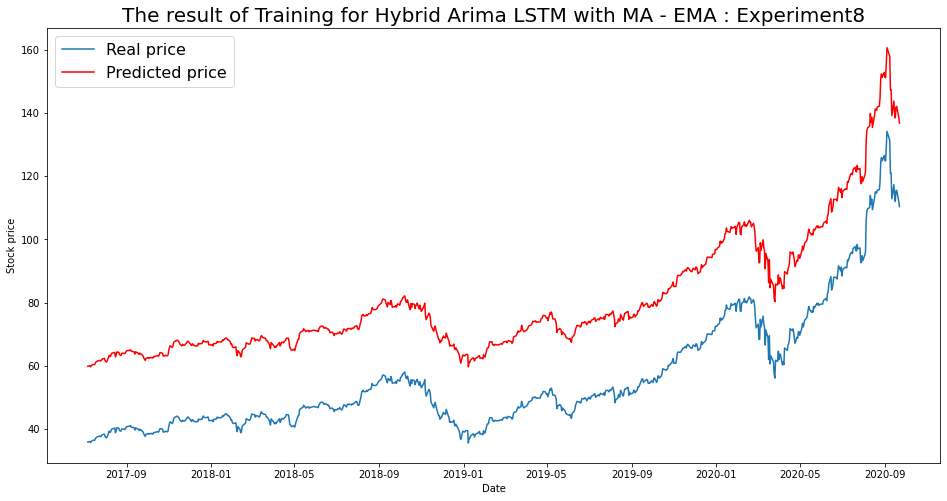

----- Train RMSE for EMA ----- 24.237983942165165
----- Train_MSE_LSTM for EMA ----- 587.4798655806565
----- Train MAE LSTM for EMA ----- 24.233408446359164


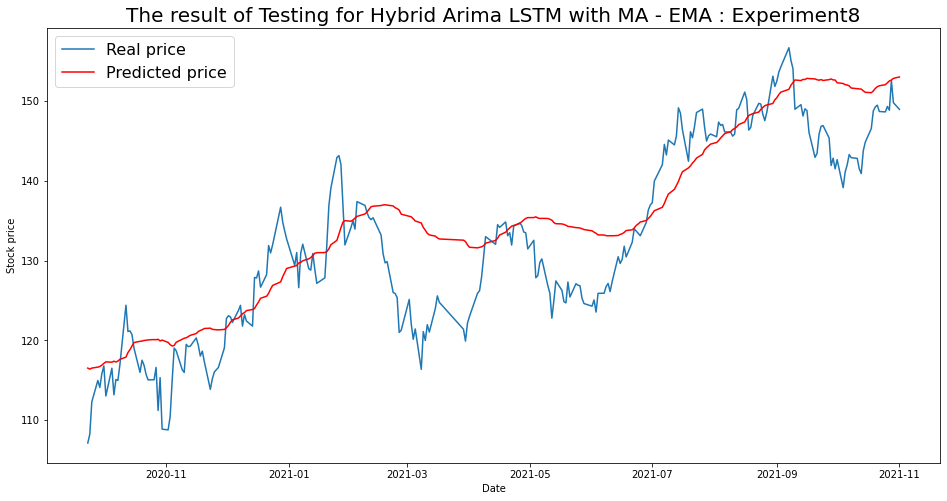

----- Test RMSE for EMA----- 6.018920948951479
----- Test_MSE_LSTM for EMA----- 36.227409389726965
----- Test_MAE_LSTM for EMA----- 4.70810831106621


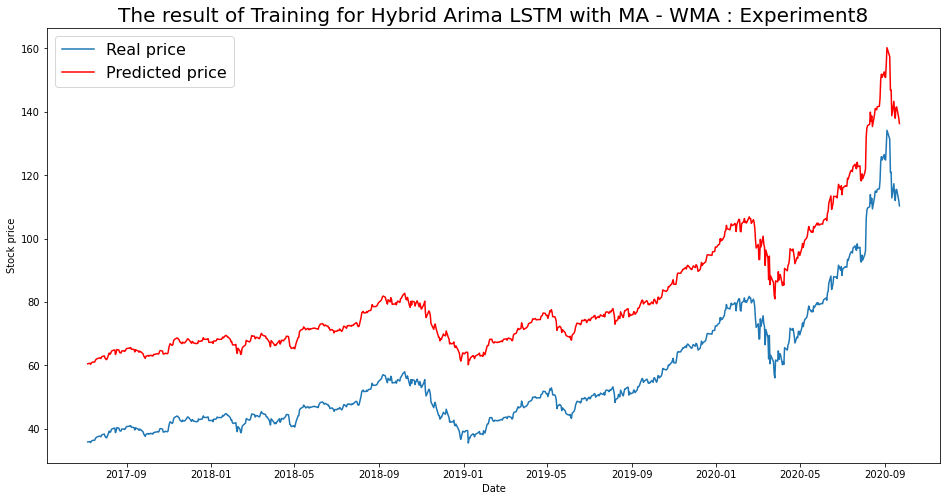

----- Train RMSE for WMA ----- 24.839096992968393
----- Train_MSE_LSTM for WMA ----- 616.9807394260914
----- Train MAE LSTM for WMA ----- 24.837005199772296


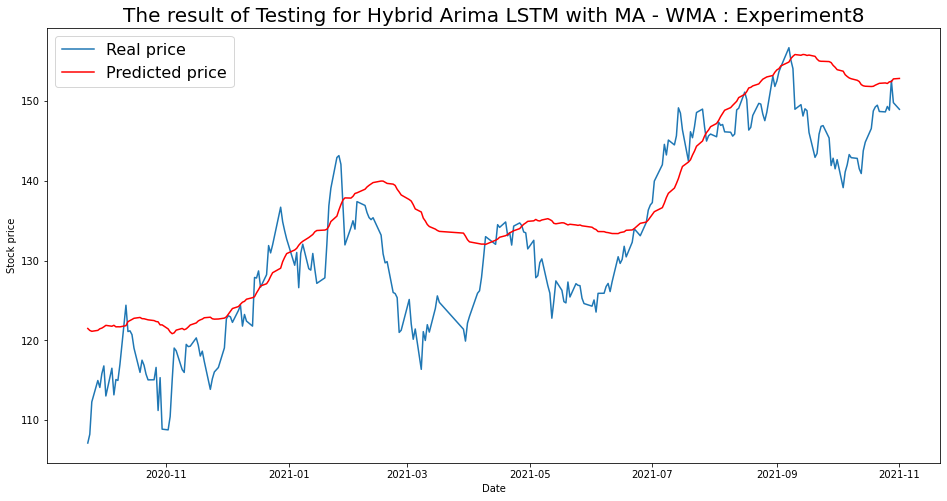

----- Test RMSE for WMA----- 6.8995694010132835
----- Test_MSE_LSTM for WMA----- 47.6040579193988
----- Test_MAE_LSTM for WMA----- 5.522605601178568


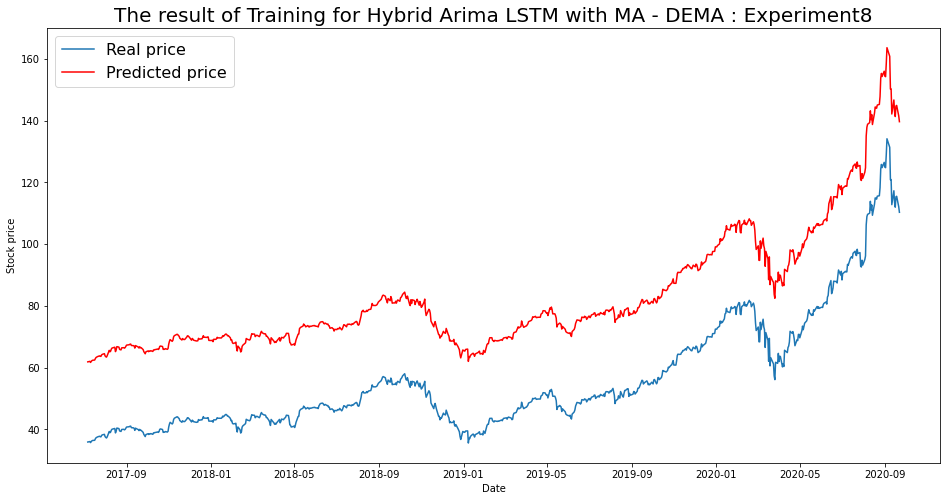

----- Train RMSE for DEMA ----- 26.637746302738936
----- Train_MSE_LSTM for DEMA ----- 709.5695280890818
----- Train MAE LSTM for DEMA ----- 26.62872602916


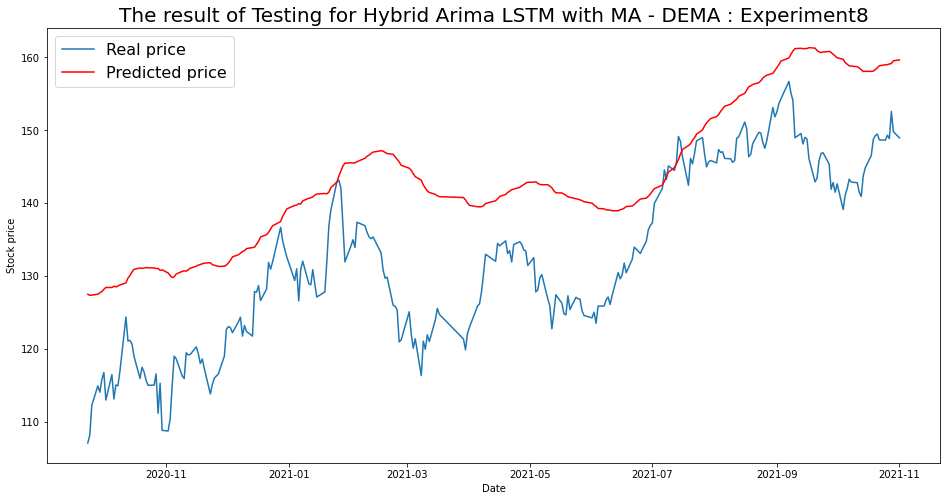

----- Test RMSE for DEMA----- 12.476912975479843
----- Test_MSE_LSTM for DEMA----- 155.67335739769726
----- Test_MAE_LSTM for DEMA----- 11.236116903479964


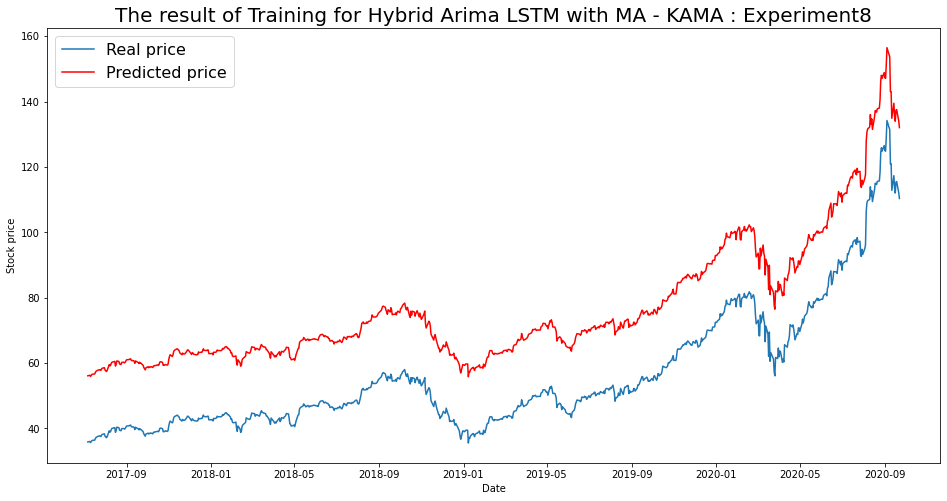

----- Train RMSE for KAMA ----- 20.429213713281705
----- Train_MSE_LSTM for KAMA ----- 417.35277294293724
----- Train MAE LSTM for KAMA ----- 20.425471756717947


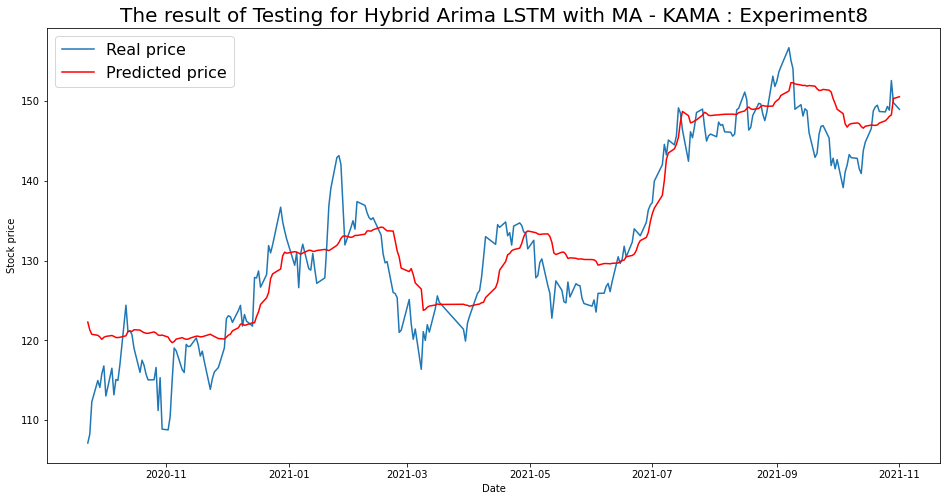

----- Test RMSE for KAMA----- 4.45523987912355
----- Test_MSE_LSTM for KAMA----- 19.84916238053282
----- Test_MAE_LSTM for KAMA----- 3.572304554405335


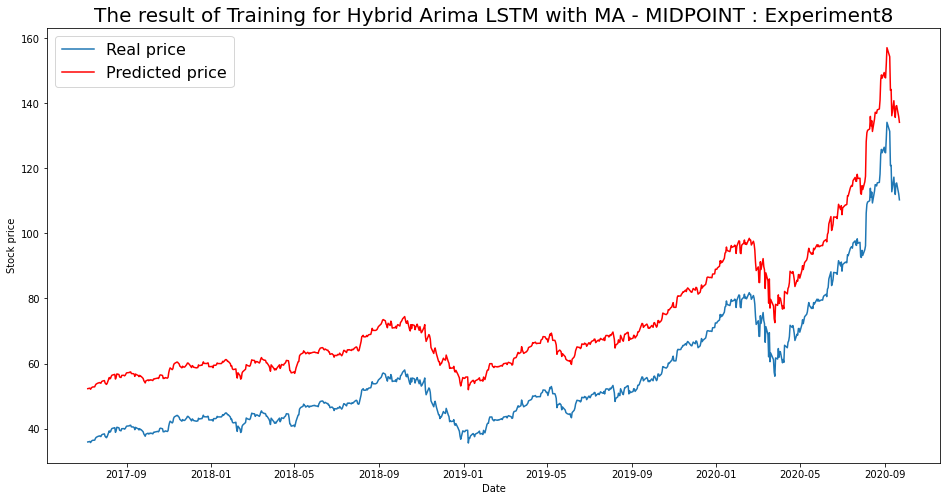

----- Train RMSE for MIDPOINT ----- 16.856157067120407
----- Train_MSE_LSTM for MIDPOINT ----- 284.1300310714332
----- Train MAE LSTM for MIDPOINT ----- 16.801196841910333


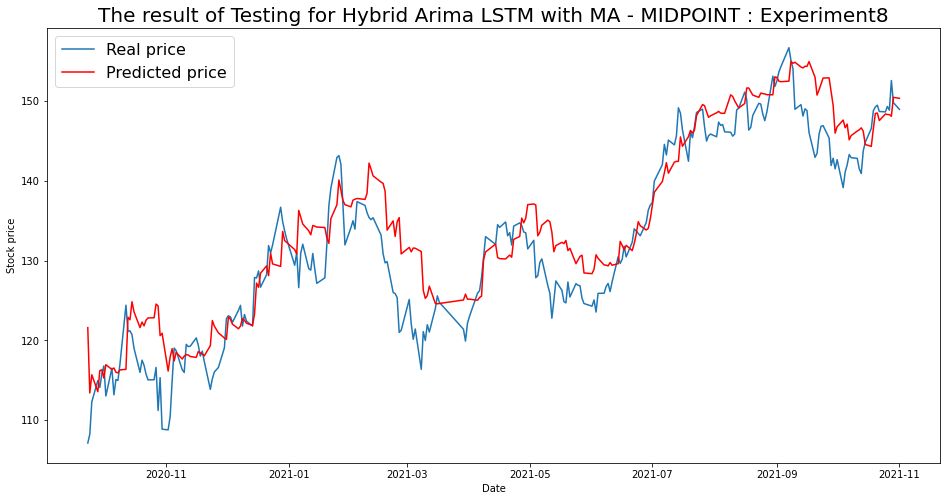

----- Test RMSE for MIDPOINT----- 4.67046693169025
----- Test_MSE_LSTM for MIDPOINT----- 21.813261360012138
----- Test_MAE_LSTM for MIDPOINT----- 3.6223152079979295


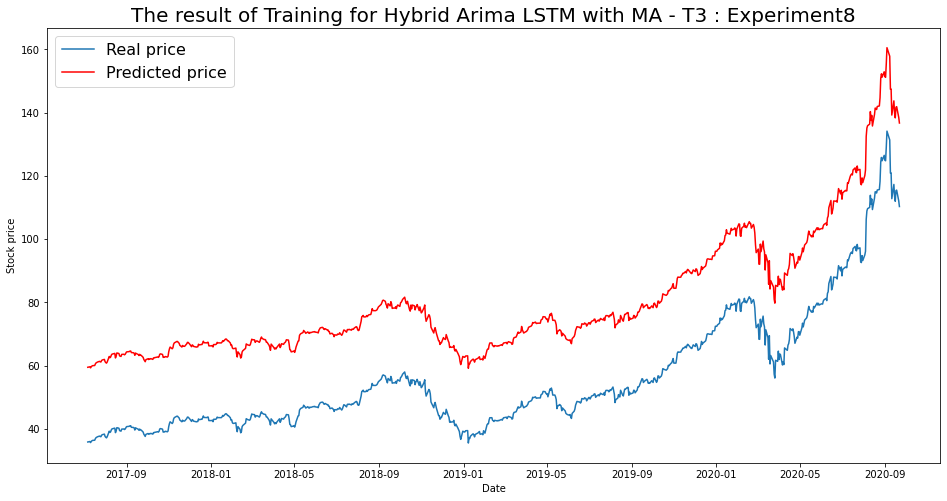

----- Train RMSE for T3 ----- 23.819539505216678
----- Train_MSE_LSTM for T3 ----- 567.370462240578
----- Train MAE LSTM for T3 ----- 23.812523622323972


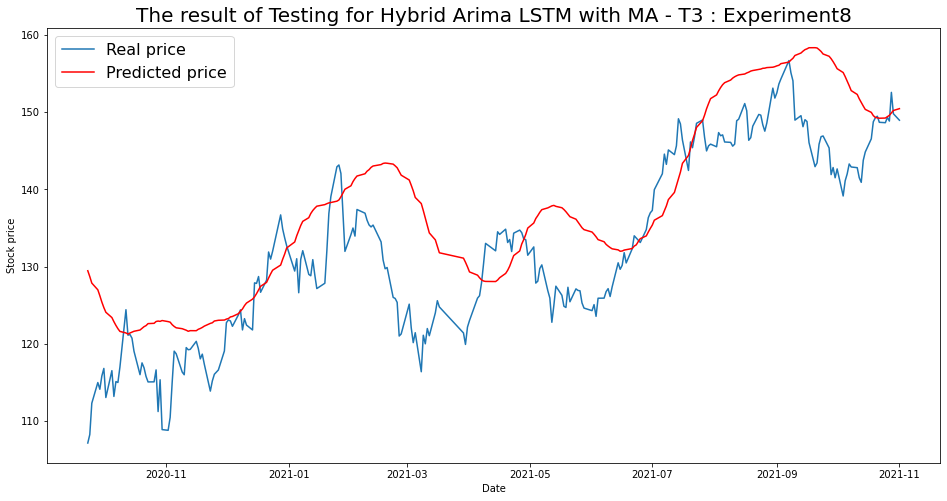

----- Test RMSE for T3----- 8.221925320571591
----- Test_MSE_LSTM for T3----- 67.60005597705626
----- Test_MAE_LSTM for T3----- 6.604025072859764


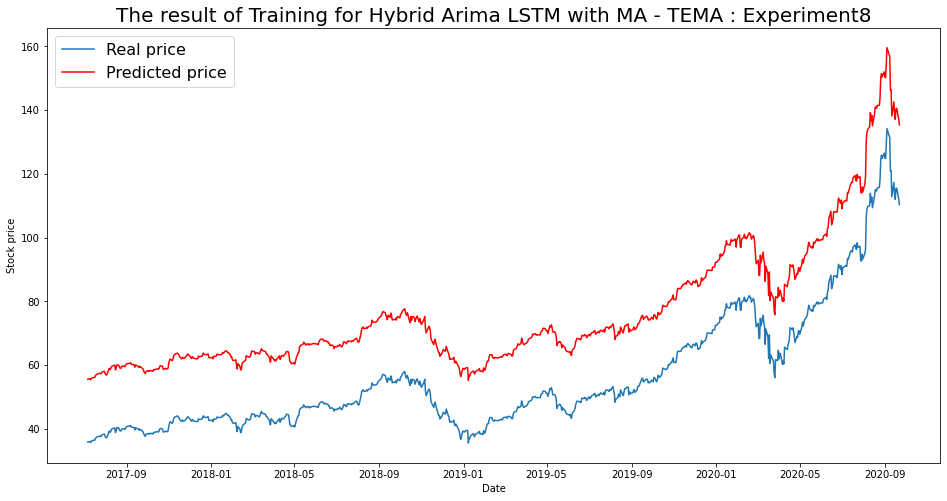

----- Train RMSE for TEMA ----- 20.0322994797993
----- Train_MSE_LSTM for TEMA ----- 401.2930224483673
----- Train MAE LSTM for TEMA ----- 19.998681748267447


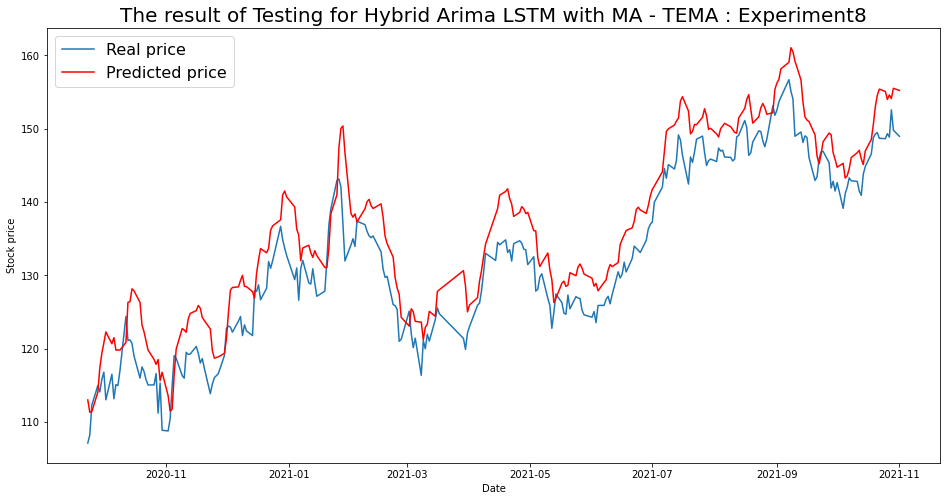

----- Test RMSE for TEMA----- 4.923731808079425
----- Test_MSE_LSTM for TEMA----- 24.243134917893084
----- Test_MAE_LSTM for TEMA----- 4.330583242877685


In [114]:
for i in range(len(list(simulation8.keys()))):
  SIM = list(simulation8.keys())[i]
  plot_train(simulation8,SIM)
  plot_test(simulation8,SIM)

## List of RMSE, MSE & MAE scores for Test data

In [ ]:
import json
with open('simulation1_data.json') as json_file:
    simulation1 = json.load(json_file)

with open('simulation2_data.json') as json_file:
    simulation2 = json.load(json_file)

with open('simulation3_data.json') as json_file:
    simulation3 = json.load(json_file)

with open('simulation4_data.json') as json_file:
    simulation4 = json.load(json_file)

with open('simulation5_data.json') as json_file:
    simulation5 = json.load(json_file)

with open('simulation6_data.json') as json_file:
    simulation6 = json.load(json_file)

with open('simulation7_data.json') as json_file:
    simulation7 = json.load(json_file)

with open('simulation8_data.json') as json_file:
    simulation8 = json.load(json_file)

In [ ]:
text = 'Stock with Covid Trends '
simulations = [simulation1,simulation2,simulation3,simulation4,simulation5,simulation6,simulation7,simulation8]
for i,simulation in enumerate(simulations):
  for ma in simulation.keys():
    print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])

Stock with Covid Trends Experiment  1  for MA : SMA the MSE  is:  29.531169515594907
Stock with Covid Trends Experiment  1  for MA : SMA the RMSE is:  5.434258874547192
Stock with Covid Trends Experiment  1  for MA : SMA the MAE is:  4.511922179897357
Stock with Covid Trends Experiment  1  for MA : EMA the MSE  is:  44.2948843329178
Stock with Covid Trends Experiment  1  for MA : EMA the RMSE is:  6.655440205795392
Stock with Covid Trends Experiment  1  for MA : EMA the MAE is:  5.1903345685841265
Stock with Covid Trends Experiment  1  for MA : WMA the MSE  is:  34.81241095672678
Stock with Covid Trends Experiment  1  for MA : WMA the RMSE is:  5.900204314829002
Stock with Covid Trends Experiment  1  for MA : WMA the MAE is:  4.770935413189914
Stock with Covid Trends Experiment  1  for MA : DEMA the MSE  is:  52.107642174945944
Stock with Covid Trends Experiment  1  for MA : DEMA the RMSE is:  7.2185623343534235
Stock with Covid Trends Experiment  1  for MA : DEMA the MAE is:  5.726077

In [ ]:
text = 'Stock with Covid Trends '
simulations = [simulation1,simulation2,simulation3,simulation4,simulation5,simulation6,simulation7,simulation8]
for i,simulation in enumerate(simulations):
  for ma in simulation.keys():
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])
  for ma in simulation.keys():
    print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])
  for ma in simulation.keys():
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])

Stock with Covid Trends Experiment  1  for MA : SMA the RMSE is:  5.434258874547192
Stock with Covid Trends Experiment  1  for MA : EMA the RMSE is:  6.655440205795392
Stock with Covid Trends Experiment  1  for MA : WMA the RMSE is:  5.900204314829002
Stock with Covid Trends Experiment  1  for MA : DEMA the RMSE is:  7.2185623343534235
Stock with Covid Trends Experiment  1  for MA : KAMA the RMSE is:  10.06138476473457
Stock with Covid Trends Experiment  1  for MA : MIDPOINT the RMSE is:  10.995992269529154
Stock with Covid Trends Experiment  1  for MA : T3 the RMSE is:  6.443131859256255
Stock with Covid Trends Experiment  1  for MA : TEMA the RMSE is:  8.504717540081634
Stock with Covid Trends Experiment  1  for MA : SMA the MSE  is:  29.531169515594907
Stock with Covid Trends Experiment  1  for MA : EMA the MSE  is:  44.2948843329178
Stock with Covid Trends Experiment  1  for MA : WMA the MSE  is:  34.81241095672678
Stock with Covid Trends Experiment  1  for MA : DEMA the MSE  is:  

## Create HTML

In [116]:
cd ..

/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Archana - LSTM Hybrid


In [ ]:
cd drive/MyDrive/Stock price prediction/Archana - LSTM Hybrid


In [117]:
%%shell
jupyter nbconvert --to html LSTM_Hybrid_using_TA_LIB_Covid.ipynb

[NbConvertApp] Converting notebook LSTM_Hybrid_using_TA_LIB_Covid.ipynb to html
[NbConvertApp] Writing 14716044 bytes to LSTM_Hybrid_using_TA_LIB_Covid.html
